<a href="https://colab.research.google.com/github/Amrutha1103/002776773_AMRUTHA_SAI_ASSIGNMENT4/blob/main/Assignment4_Report.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

###Abstract :


This dataset is about the television program "Shark Tank India". The show is the Indian franchise of the American show Shark Tank. It shows entrepreneurs making business presentations to a panel of investors or sharks, who decide whether to invest in their company.

###Aim: 

The focus is readability and clarity.

*   Combine Data Cleaning,
*   Feature Selection
*   Modeling 
*   Interpretability into one report

##Data description:


Episode_number - Number of the episode

Pitch_number - Number of the Pitch

Brand_name - Name of the brand Idea

Idea - behind the brand building Deal

Deal - done or not ; 1 - YES, 0 - NO

Pitcher_ask_amount - Amount asked by the pitchers

Ask_equity - Equity offered by the pitchers

Ask_valuation - Valuation asked by pitchers

Deal_amount - Final Deal Amount

Deal_equity - Final Deal equity percentage

Deal_valuation - Final Valuation of Company after Deal

Ashneer_present - Ashneer was present during the pitching ; 1 - YES, 0 - NO

Anupam_present - Anupam was present during the pitching ; 1 - YES, 0 - NO

Aman_present - Aman was present during the pitching ; 1 - YES, 0 - NO

Namita_present - Namita was present during the pitching ; 1 - YES, 0 - NO

Vineeta_present - Vineeta was present during the pitching ; 1 - YES, 0 - NO

Peyush_present - Peyush was present during the pitching ; 1 - YES, 0 - NO

Ghazal_present - Ghazal was present during the pitching ; 1 - YES, 0 - NO

Total_sharks_invested - Number of total sharks invested in the Company

Amount_per_shark - Amount per shark invested

Equity_per_shark - Final Equity gained per Shark

In [1]:
##Installing all the required libraries for the Assignment
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o
!pip install fitter


!pip install shap
!pip install lime


import csv
import json
import logging
import optparse
import os
import random
import sys
import time
from datetime import datetime
from distutils.util import strtobool

# Importing all the libararies required for the assignment
import h2o
import matplotlib.pylab as plt
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import psutil
import seaborn as sns
from fitter import Fitter, get_common_distributions, get_distributions
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.estimators.random_forest import H2ORandomForestEstimator
from h2o.grid.grid_search import H2OGridSearch
from matplotlib.pyplot import figure

sns.set(rc={"figure.figsize": (16, 8)})

# Data Imputation
!pip install fancyimpute
from fancyimpute import IterativeImputer as MICE

# Model Interpretation
!pip install shap
import shap
from sklearn.model_selection import train_test_split

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.6/177.6 MB 6.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for h2o: filename=h2o-3.40.0.3-py2.py3-none-any.whl size=177694727 sha256=1b985abf63eb2e5fd04f09774b502882462acf59ad7541c925d3f68d1146eaf1
  Stored in directory: /root/.cache/pip/wheels/9a/54/b6/c9ab3e71309ef0000bbe39e715020dc151bbfc557784b7f4c9
Successfully built h2o
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/

In [2]:

# To read CSV file into Pandas DataFrame
data_df = pd.read_csv(
    "https://raw.githubusercontent.com/Amrutha1103/002776773_AMRUTHA_SAI_ASSIGNMENT3/main/Shark%20Tank%20India%20Dataset.csv"
) # Reading CSV file into Pandas DataFrame

In [3]:
# Viewing data in the file
data_df.head()

,episode_number,pitch_number,brand_name,idea,deal,pitcher_ask_amount,ask_equity,ask_valuation,deal_amount,deal_equity,...,ashneer_deal,anupam_deal,aman_deal,namita_deal,vineeta_deal,peyush_deal,ghazal_deal,total_sharks_invested,amount_per_shark,equity_per_shark
0,1,1,BluePine Industries,Frozen Momos,1,50.0,5.0,1000.00,75.0,16.00,...,1,0,1,0,1,0,0,3,25.0,5.333333
1,1,2,Booz scooters,Renting e-bike for mobility in private spaces,1,40.0,15.0,266.67,40.0,50.00,...,1,0,0,0,1,0,0,2,20.0,25.000000
2,1,3,Heart up my Sleeves,Detachable Sleeves,1,25.0,10.0,250.00,25.0,30.00,...,0,1,0,0,1,0,0,2,12.5,15.000000
3,2,4,Tagz Foods,Healthy Potato Chips,1,70.0,1.0,7000.00,70.0,2.75,...,1,0,0,0,0,0,0,1,70.0,2.750000
4,2,5,Head and Heart,Brain Development Course,0,50.0,5.0,1000.00,0.0,0.00,...,0,0,0,0,0,0,0,0,0.0,0.000000


In [4]:
# Checking Data Type of each variable
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 117 entries, 0 to 116
Data columns (total 28 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   episode_number         117 non-null    int64  
 1   pitch_number           117 non-null    int64  
 2   brand_name             117 non-null    object 
 3   idea                   117 non-null    object 
 4   deal                   117 non-null    int64  
 5   pitcher_ask_amount     117 non-null    float64
 6   ask_equity             117 non-null    float64
 7   ask_valuation          117 non-null    float64
 8   deal_amount            117 non-null    float64
 9   deal_equity            117 non-null    float64
 10  deal_valuation         117 non-null    float64
 11  ashneer_present        117 non-null    int64  
 12  anupam_present         117 non-null    int64  
 13  aman_present           117 non-null    int64  
 14  namita_present         117 non-null    int64  
 15  vineet

In [5]:
# Checking for any null values in the dataset, as we hav no null values - we are good to go.
data_df.isnull().sum()

episode_number           0
pitch_number             0
brand_name               0
idea                     0
deal                     0
pitcher_ask_amount       0
ask_equity               0
ask_valuation            0
deal_amount              0
deal_equity              0
deal_valuation           0
ashneer_present          0
anupam_present           0
aman_present             0
namita_present           0
vineeta_present          0
peyush_present           0
ghazal_present           0
ashneer_deal             0
anupam_deal              0
aman_deal                0
namita_deal              0
vineeta_deal             0
peyush_deal              0
ghazal_deal              0
total_sharks_invested    0
amount_per_shark         0
equity_per_shark         0
dtype: int64

In [6]:
# Shape of the dataframe - Here, we have 117 samples of data with 28 predictors and 1 result
data_df.shape

(117, 28)

In [7]:
columns = list(data_df.columns)
print(columns)  # Name of all predictors and result

['episode_number', 'pitch_number', 'brand_name', 'idea', 'deal', 'pitcher_ask_amount', 'ask_equity', 'ask_valuation', 'deal_amount', 'deal_equity', 'deal_valuation', 'ashneer_present', 'anupam_present', 'aman_present', 'namita_present', 'vineeta_present', 'peyush_present', 'ghazal_present', 'ashneer_deal', 'anupam_deal', 'aman_deal', 'namita_deal', 'vineeta_deal', 'peyush_deal', 'ghazal_deal', 'total_sharks_invested', 'amount_per_shark', 'equity_per_shark']


####To fit a normal distribution to each column of the DataFrame

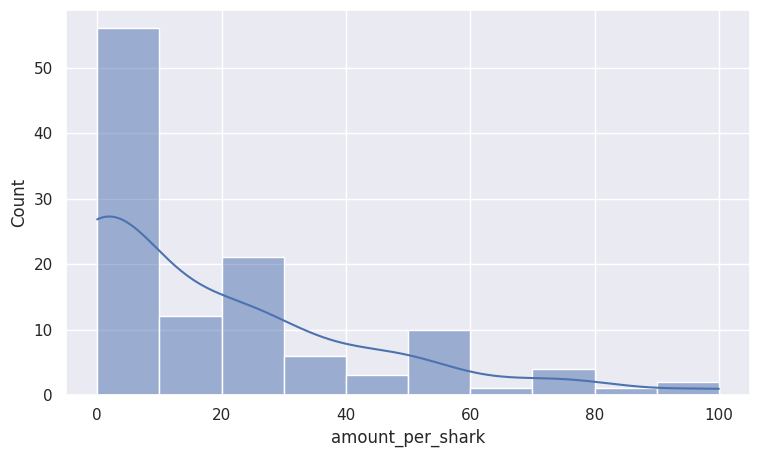

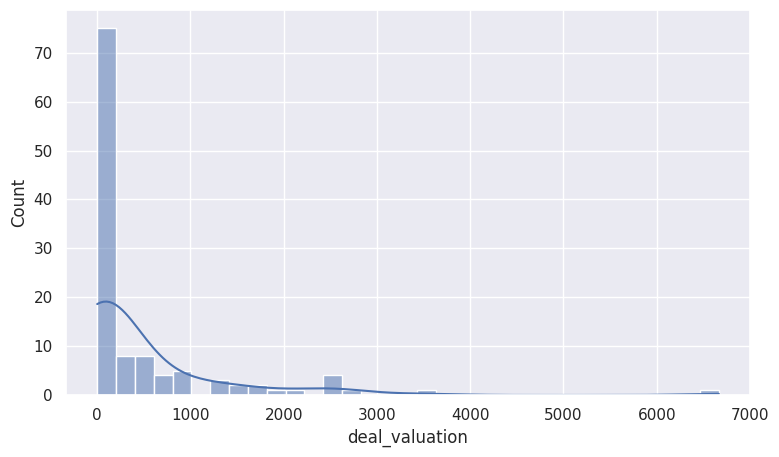

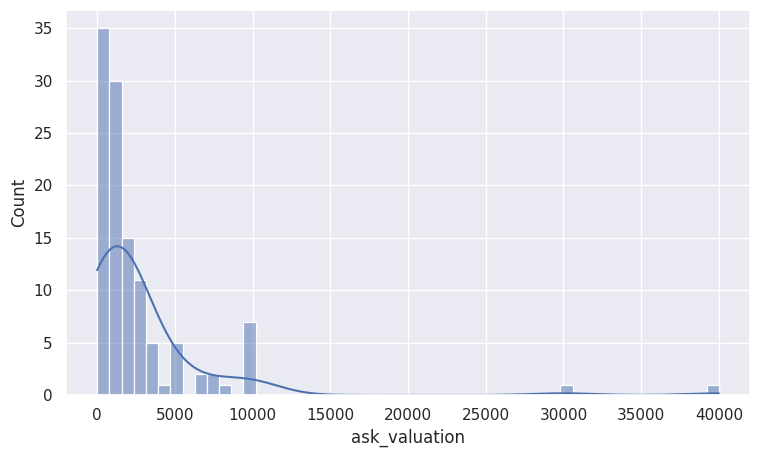

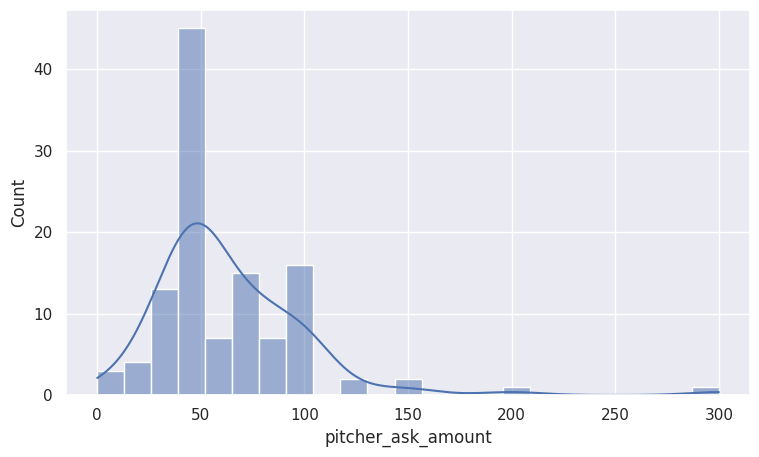

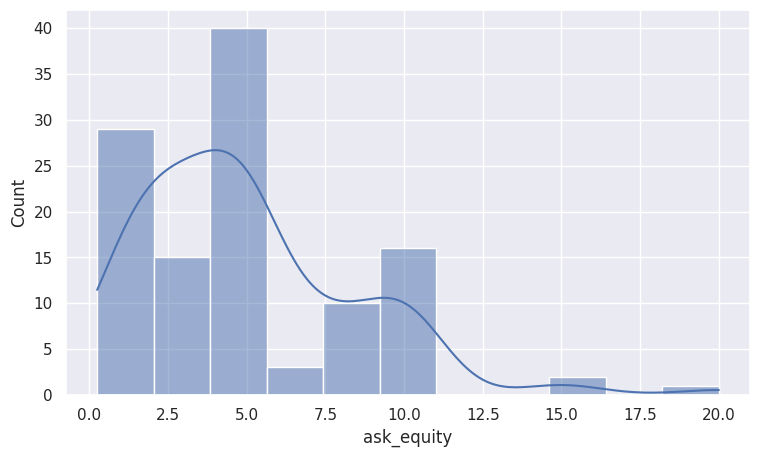

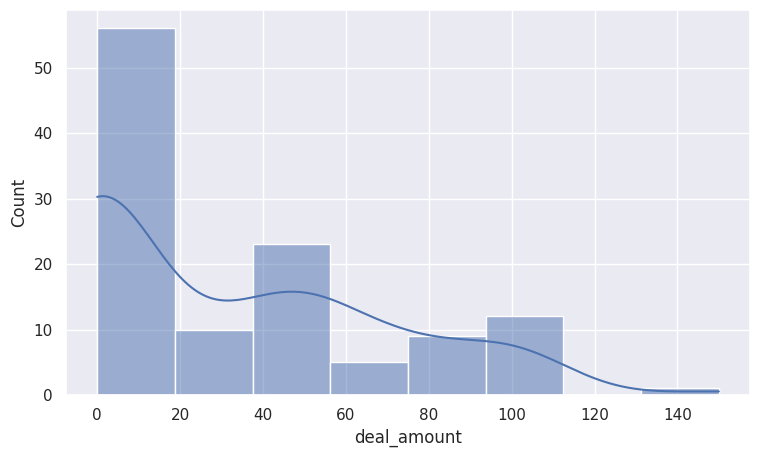

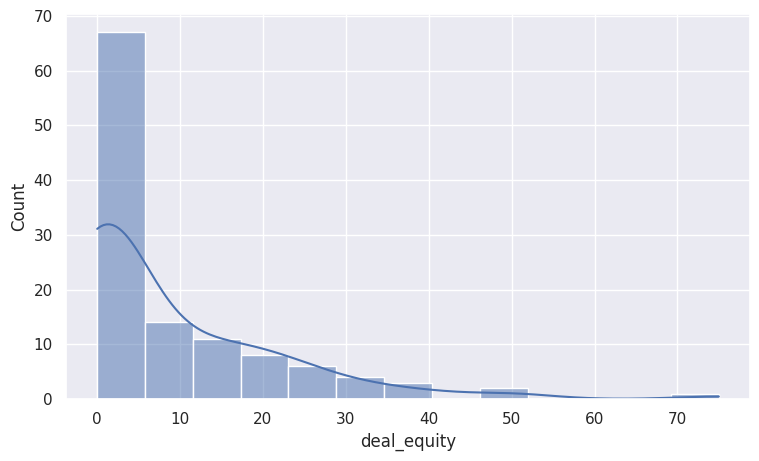

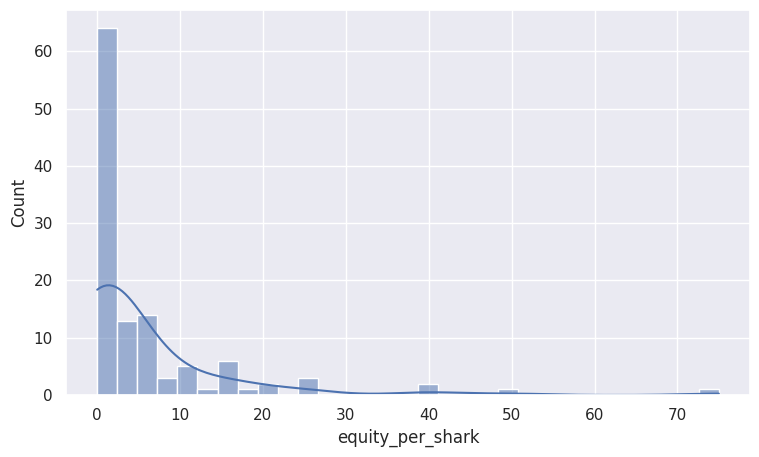

In [8]:
#To check the distribution of pitcher_ask_amount, ask_equity, ask_valuation, amount_per_shark, deal_valuation, deal_amount, deal_equity, and equity_per_shark using histogram
independent_variables=["amount_per_shark","deal_valuation","ask_valuation","pitcher_ask_amount","ask_equity", "deal_amount", "deal_equity","equity_per_shark"]
count = 1 
for i in range(0,len(independent_variables)):
  plt.figure(figsize = (30,5))
  plt.subplot(1,3,count)
  sns.histplot(x = independent_variables[i], data = data_df.drop(data_df[data_df['pitcher_ask_amount'] == 30000].index, axis = 0), kde = True)
  plt.show()

Below graphs are plotted using histogram with kernel density estimate(KDE)which shows the distribution of each column in the dataframe.

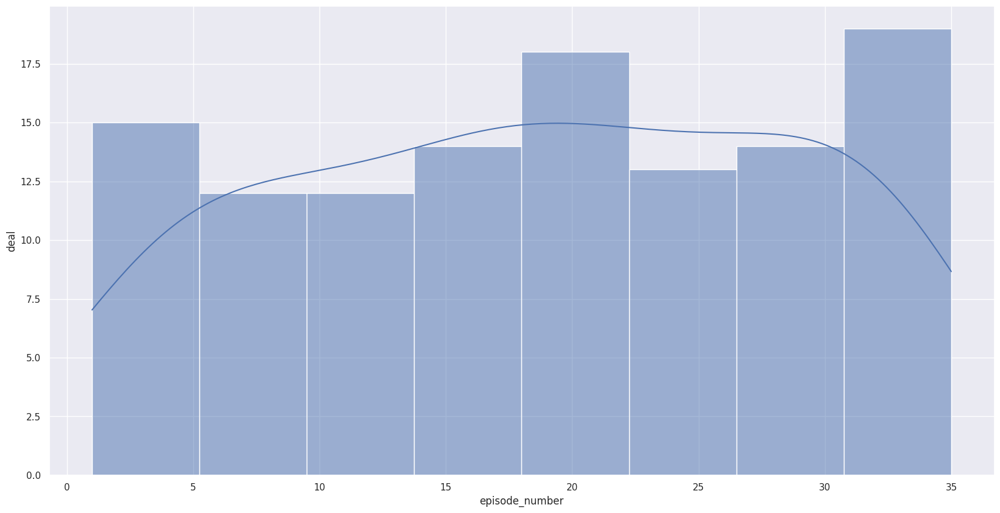

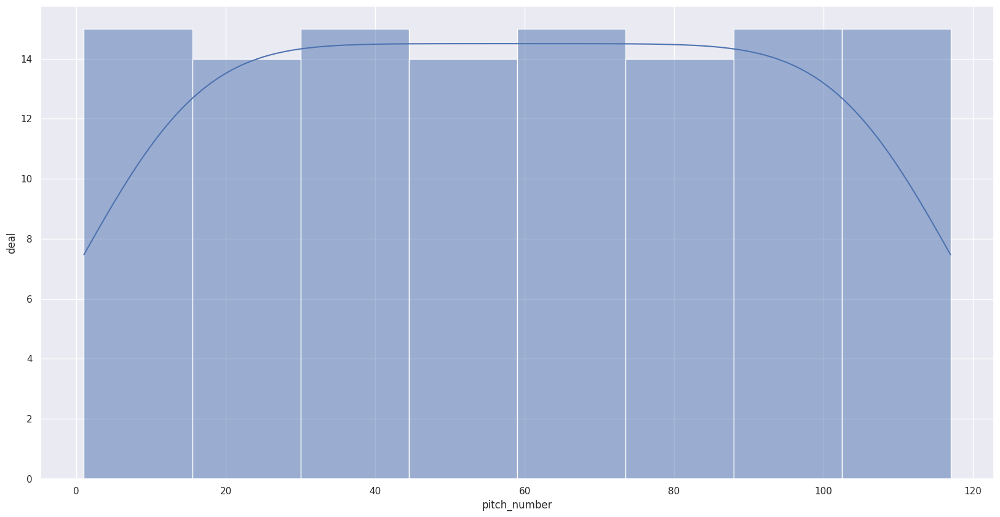

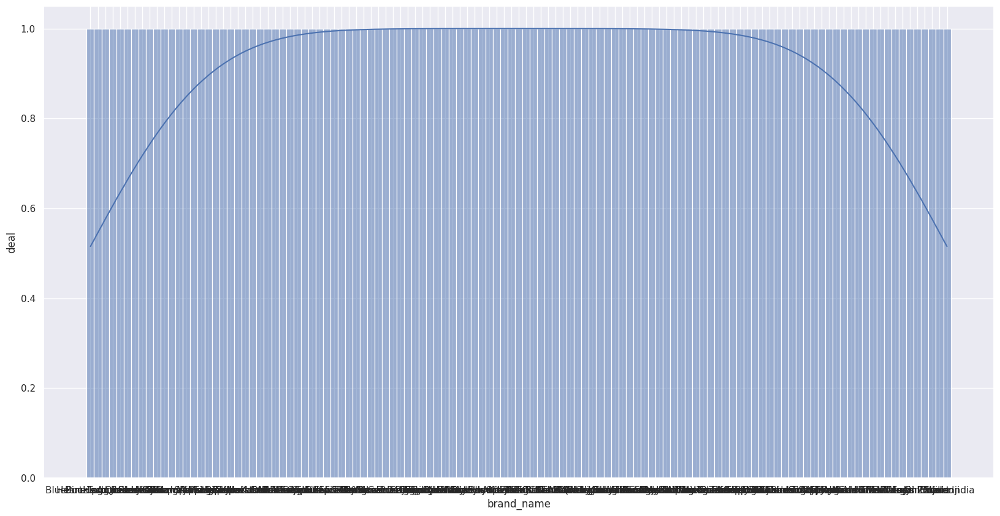

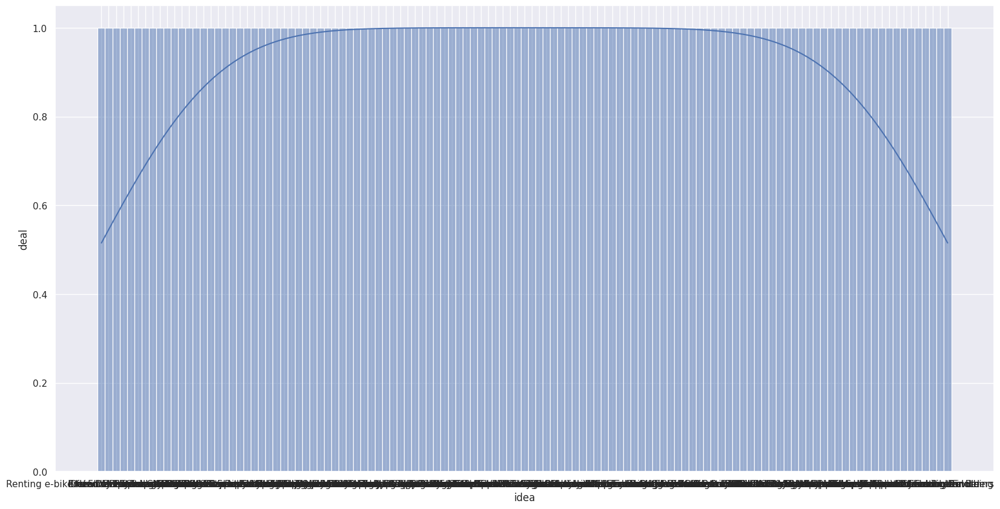

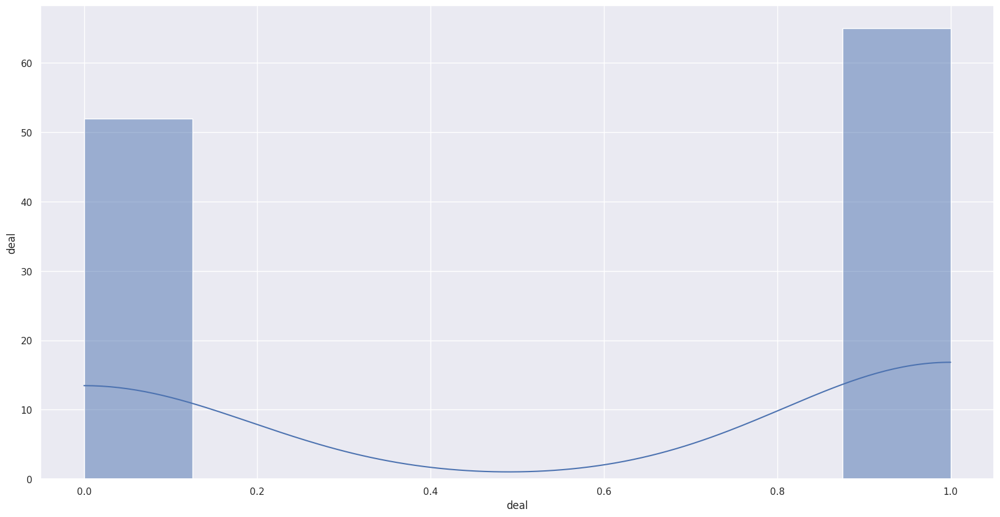

...

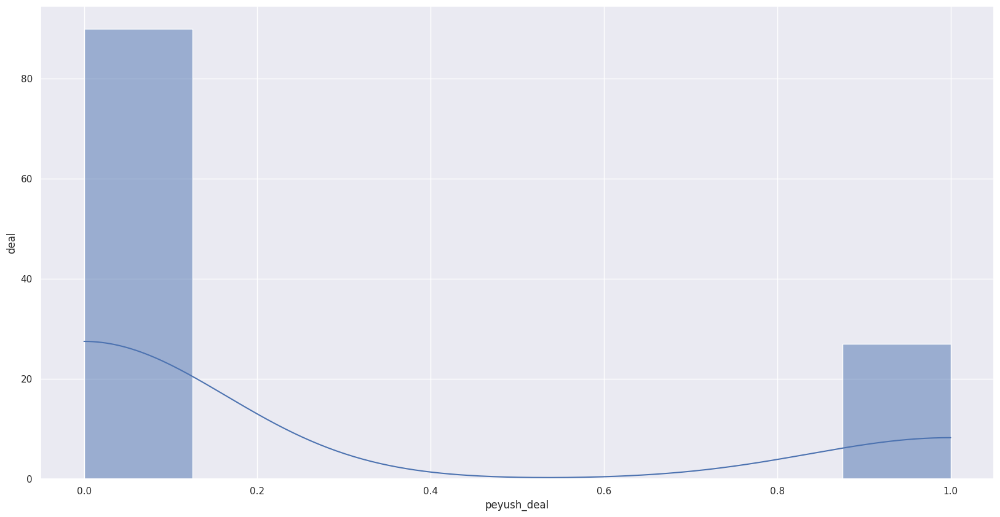

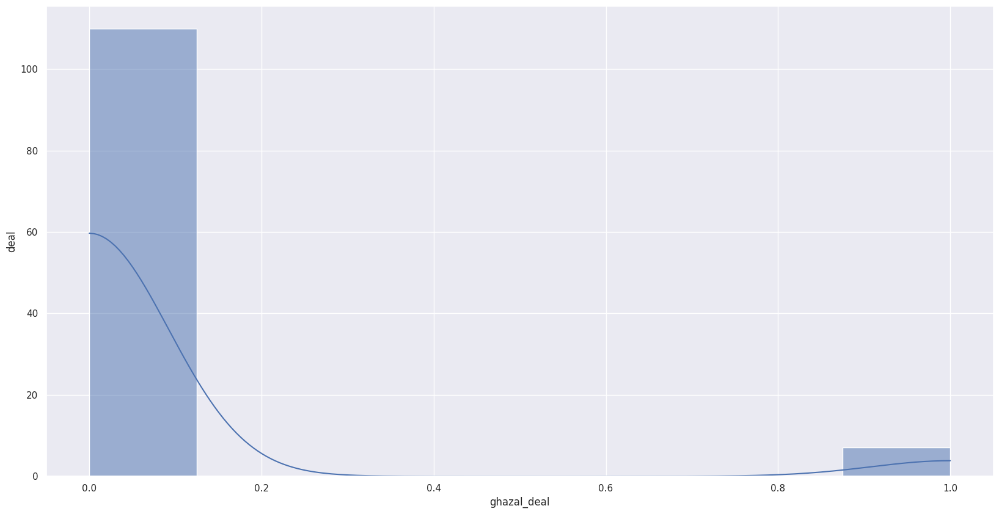

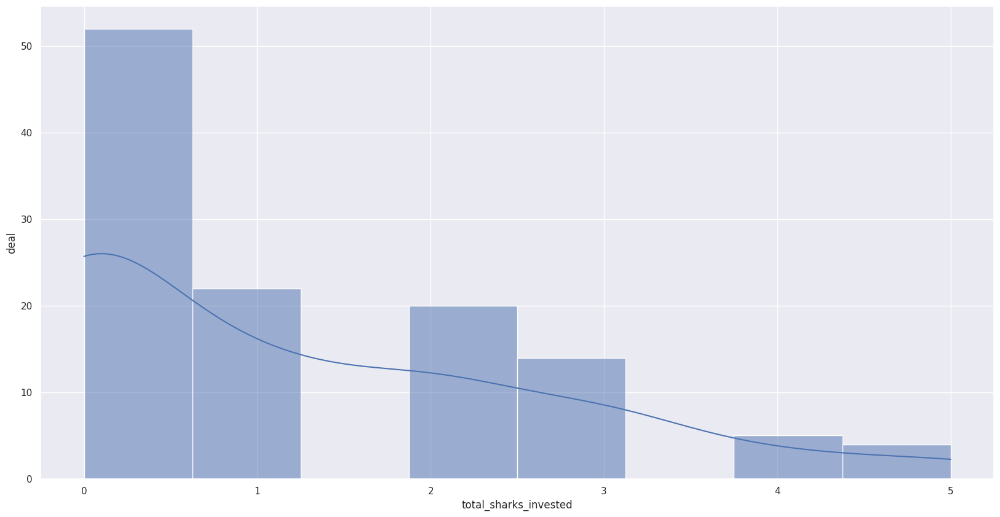

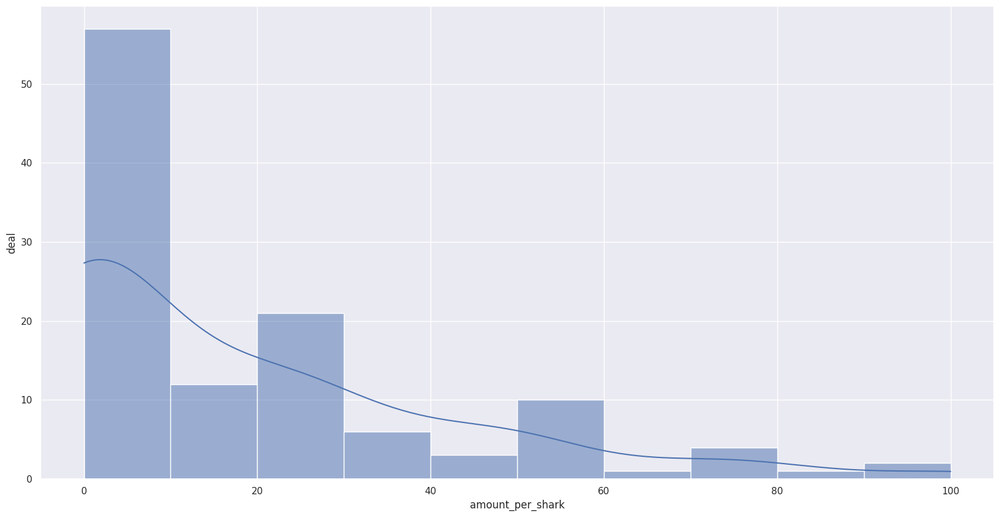

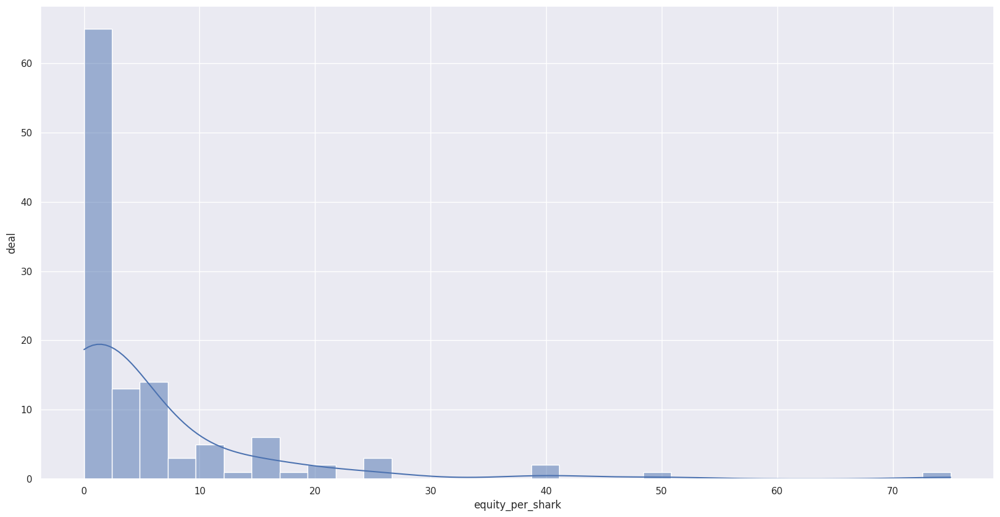

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

# set the size of the plot
sns.set(rc={"figure.figsize": (20, 10)})

# loop over each column of the DataFrame
for col in data_df.columns:
    # plot the distribution of the column
    sns.histplot(data=data_df, x=col, kde=True)
    plt.xlabel(col)
    plt.ylabel("deal")
    plt.show()



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.



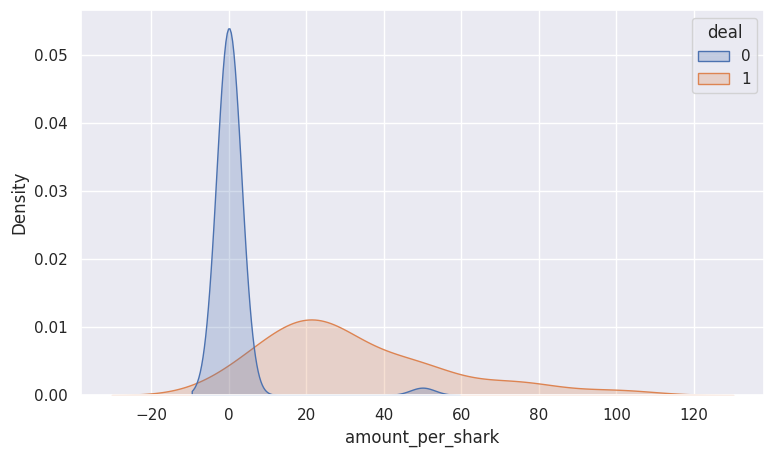



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.



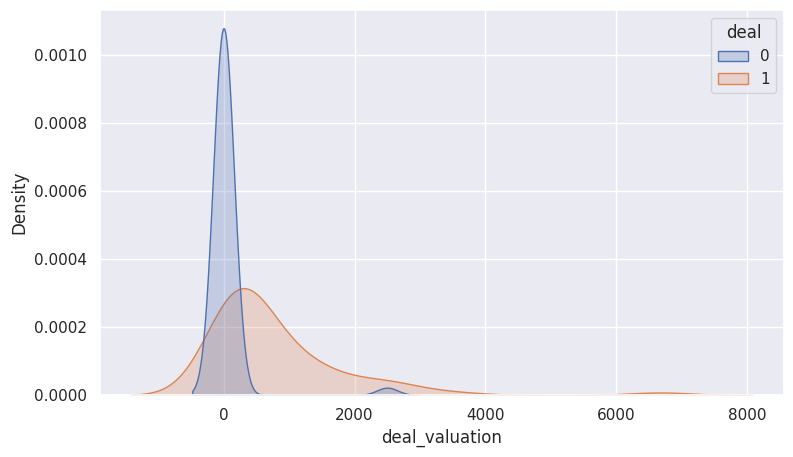



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.



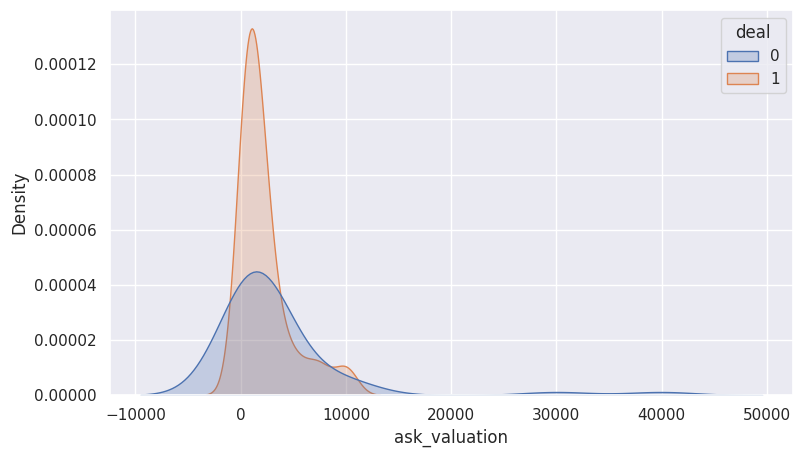



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.



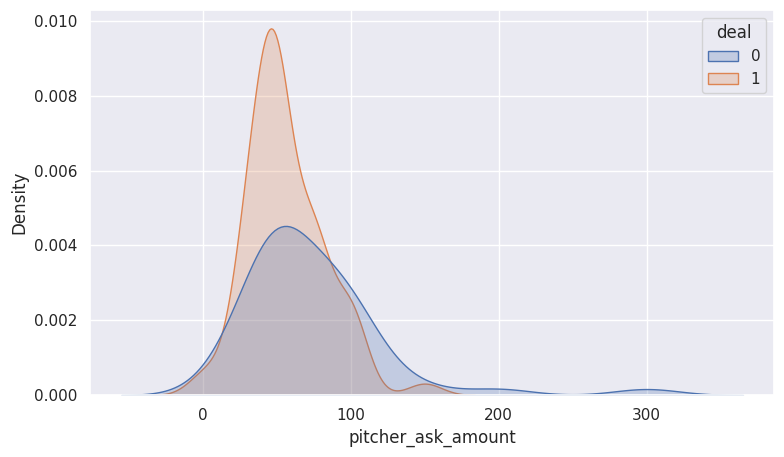



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.



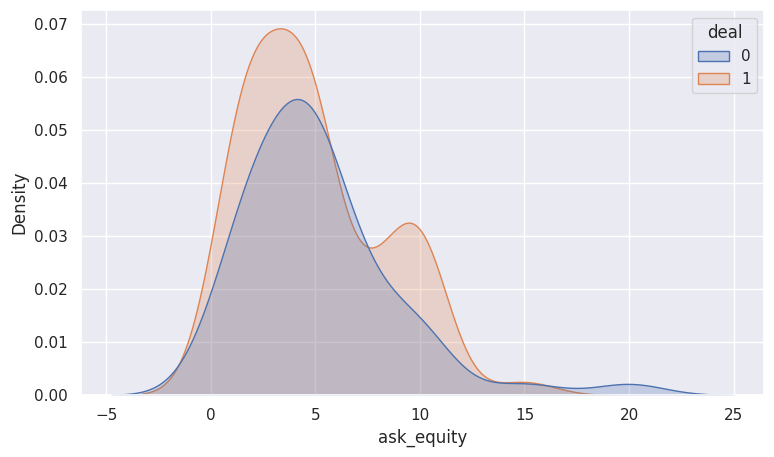



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.



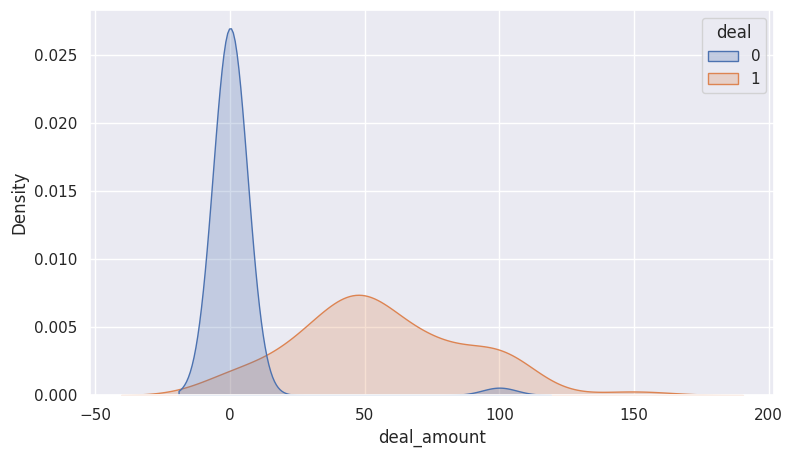



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.



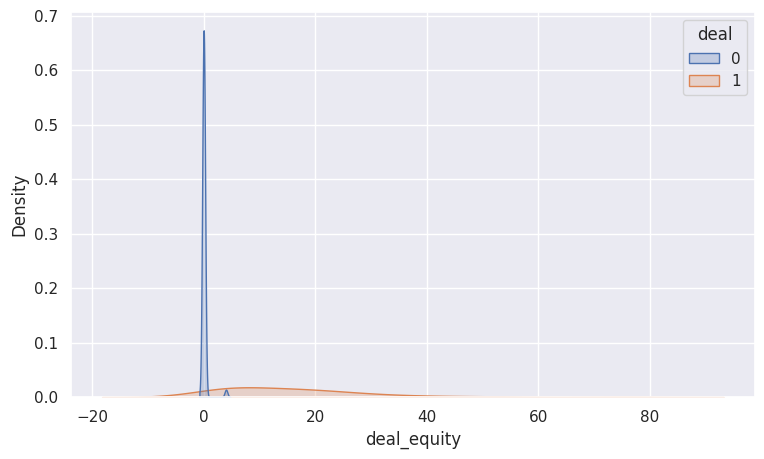



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.



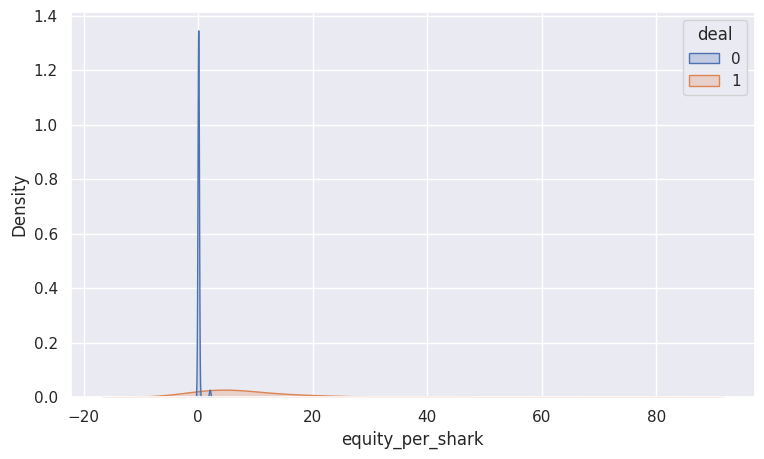

In [10]:
# 4. To check the distribution of pitcher_ask_amount, ask_equity, ask_valuation, amount_per_shark, deal_valuation, deal_amount, deal_equity, and equity_per_shark using kdeplot
independent_variables=["amount_per_shark","deal_valuation","ask_valuation","pitcher_ask_amount","ask_equity", "deal_amount", "deal_equity","equity_per_shark"]
count = 1 
for i in range(0,len(independent_variables)):
  plt.figure(figsize = (30,5))
  plt.subplot(1,3,count)
  sns.kdeplot(x = independent_variables[i], data = data_df.drop(data_df[data_df['pitcher_ask_amount'] == 30000].index, axis = 0),hue = 'deal',shade = True)
  plt.show()

In [11]:
data_df.corr()

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


,episode_number,pitch_number,deal,pitcher_ask_amount,ask_equity,ask_valuation,deal_amount,deal_equity,deal_valuation,ashneer_present,...,ashneer_deal,anupam_deal,aman_deal,namita_deal,vineeta_deal,peyush_deal,ghazal_deal,total_sharks_invested,amount_per_shark,equity_per_shark
episode_number,1.000000,0.998850,-0.214033,-0.069500,-0.077674,-0.070829,-0.187023,-0.114719,-0.146336,-0.342116,...,-0.116462,-0.121671,-0.264855,-0.041819,-0.035758,0.022564,0.229482,-0.121894,-0.157896,-0.073187
pitch_number,0.998850,1.000000,-0.223068,-0.074881,-0.080792,-0.073517,-0.199542,-0.119973,-0.151003,-0.338967,...,-0.117380,-0.129104,-0.272245,-0.053756,-0.028765,0.013214,0.226210,-0.131541,-0.166871,-0.079109
deal,-0.214033,-0.223068,1.000000,-0.106927,-0.076438,-0.151695,0.736002,0.609043,0.409138,-0.020728,...,0.373509,0.454369,0.461369,0.430422,0.342997,0.489898,0.225630,0.759342,0.653882,0.461046
pitcher_ask_amount,-0.069500,-0.074881,-0.106927,1.000000,0.470198,0.911174,-0.080719,-0.067233,-0.045988,0.040759,...,-0.044099,-0.050348,-0.053685,-0.045850,-0.036575,-0.052946,-0.024308,-0.084288,-0.071281,-0.050873
ask_equity,-0.077674,-0.080792,-0.076438,0.470198,1.000000,0.260603,-0.177955,0.288341,-0.310331,-0.047404,...,-0.088782,0.013584,-0.140932,0.027449,0.096837,-0.026575,0.071451,-0.028387,-0.165141,0.238074
ask_valuation,-0.070829,-0.073517,-0.151695,0.911174,0.260603,1.000000,-0.090163,-0.155565,0.017869,0.053817,...,-0.052650,-0.095488,-0.085926,-0.075664,-0.068814,-0.089131,-0.050633,-0.140668,-0.066631,-0.118541
deal_amount,-0.187023,-0.199542,0.736002,-0.080719,-0.177955,-0.090163,1.000000,0.370487,0.636411,-0.026851,...,0.392853,0.335148,0.482279,0.443929,0.315109,0.384539,0.188542,0.695950,0.793392,0.239212
deal_equity,-0.114719,-0.119973,0.609043,-0.067233,0.288341,-0.155565,0.370487,1.000000,-0.082694,-0.093570,...,0.127167,0.267897,0.150735,0.136270,0.359560,0.399927,0.188478,0.432880,0.359031,0.897922
deal_valuation,-0.146336,-0.151003,0.409138,-0.045988,-0.310331,0.017869,0.636411,-0.082694,1.000000,0.018973,...,0.206179,0.219510,0.360149,0.178616,-0.001066,0.138179,-0.002742,0.319298,0.581751,-0.080662
ashneer_present,-0.342116,-0.338967,-0.020728,0.040759,-0.047404,0.053817,-0.026851,-0.093570,0.018973,1.000000,...,0.205939,-0.005886,0.246972,-0.025346,-0.108422,-0.143856,-0.475201,-0.026656,-0.049810,-0.102568


The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


<Axes: >

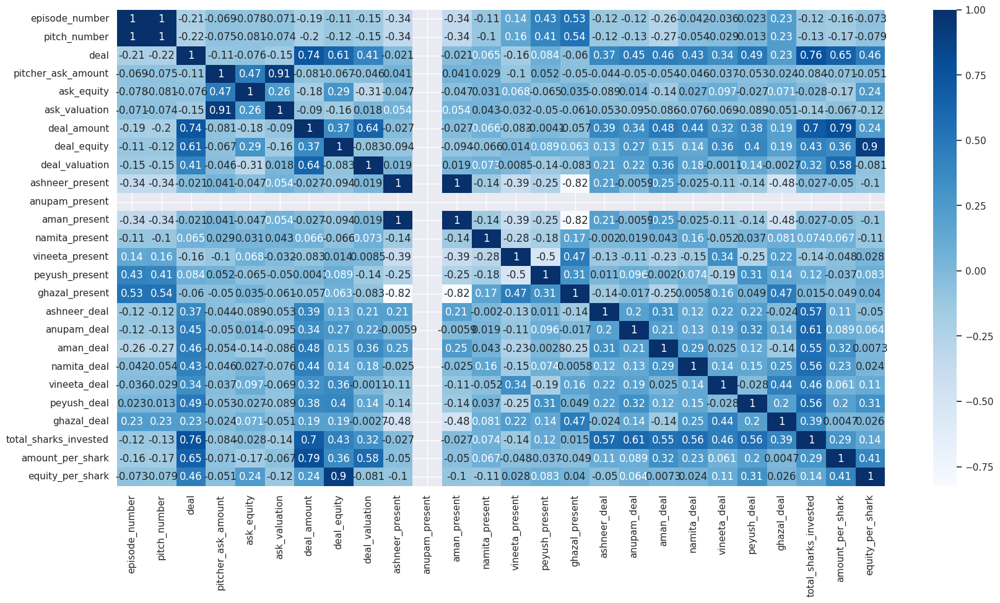

In [12]:
plt.rcParams["figure.figsize"] = (20, 10)
sns.heatmap(
    data_df.corr(), annot=True, cmap="Blues"
)  # Heatmap showing correlation between the attributes.

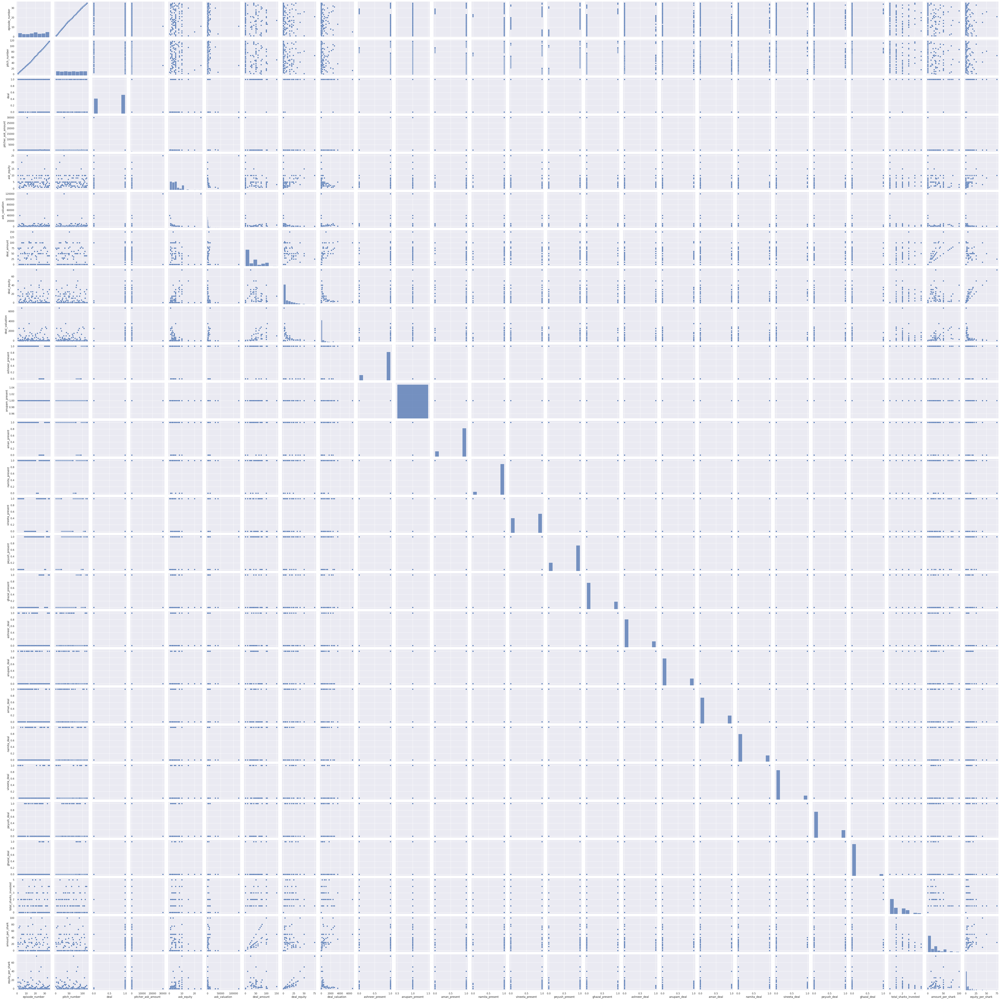

In [13]:
# All attributes are plotted against each other to see the pattern of distribution
sns.pairplot(data_df)

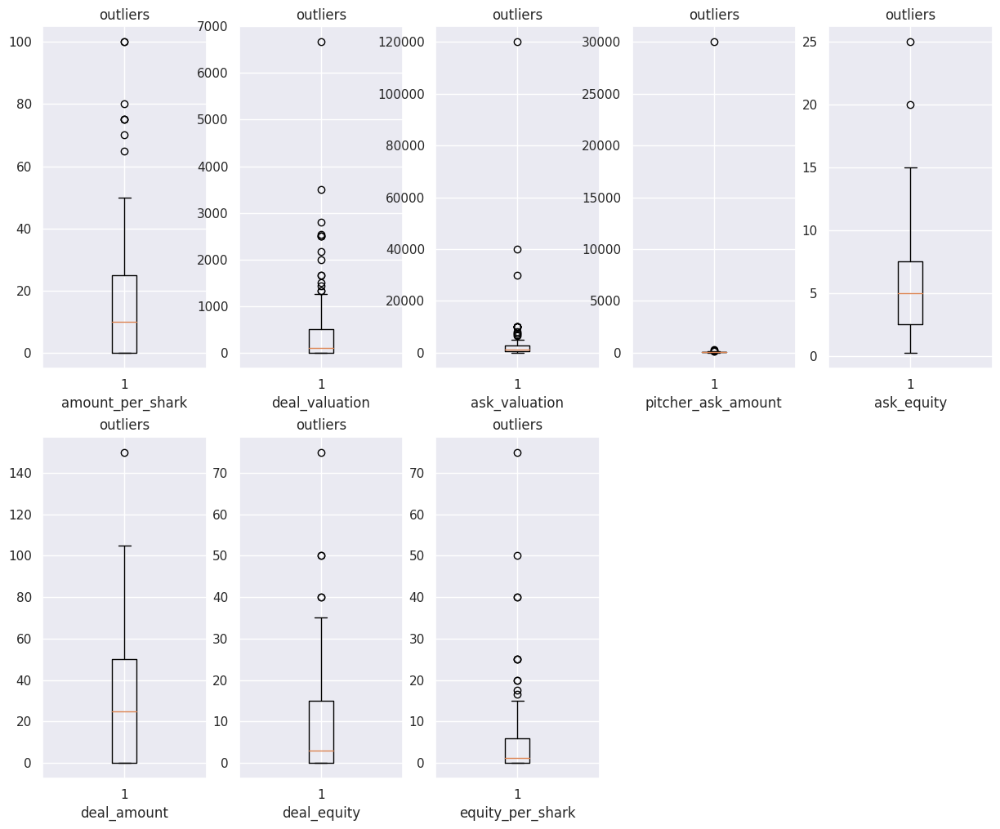

In [14]:
## Checking outliers using Boxplot
l=["amount_per_shark","deal_valuation","ask_valuation","pitcher_ask_amount","ask_equity", "deal_amount", "deal_equity","equity_per_shark"]
pos=1
plt.figure(figsize=(15,25))
for i in l:
    
    plt.subplot(4,5,pos)
    plt.boxplot(data_df[i])
    plt.xlabel(i)
    plt.title("outliers")
    pos=pos+1

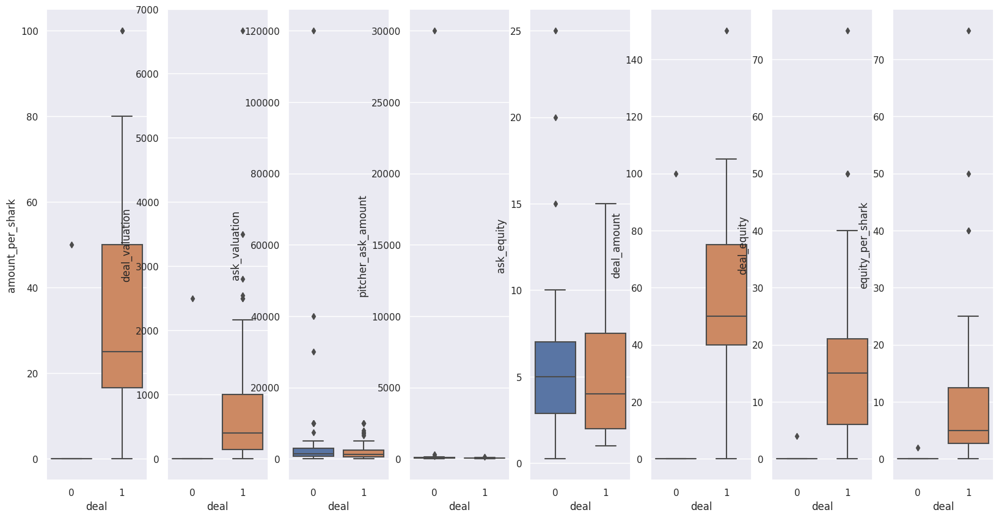

In [15]:
names = data_df[
    [
        "amount_per_shark",
        "deal_valuation",
        "ask_valuation",
        "pitcher_ask_amount",
        "ask_equity",
        "deal_amount", 
        "deal_equity",
        "equity_per_shark",
        "deal"
    ]
].columns.drop("deal")
ncols = len(names)
fig, axes = plt.subplots(1, ncols)
for name, ax in zip(names, axes.flatten()):
    sns.boxplot(
        y=name,
        x="deal",
        data=data_df[
            [
               "amount_per_shark",
               "deal_valuation",
               "ask_valuation",
               "pitcher_ask_amount",
               "ask_equity",
               "deal_amount", 
               "deal_equity",
               "equity_per_shark",
               "deal" 
            ]
        ],
        orient="v",
        ax=ax,
    )
plt.rcParams["figure.figsize"] = (12, 16)

###What kind of data exploration did you do?

Preliminary findings from the EDA.

*   Datatype Check - All the features in the dataset are Integers, Float and object.
*   Missing Data Check - Our Dataset didn't had any missing values in any of the features.
*   Distribution of training data - I checked the probability distribution of each and every feature in the training dataset
*   Correlation Check - I performed a correlation check on the dataset using heatmap and pairplot, the findings from it was that the didn't had any significant multi colinearity issues.
*   Barplot - Performed Barplot analysis to findout how a variable impacts the probability of deal.


The above graphs are a cohesive representation of how quality of wine is changing w.r.t. all the significant variables.


*   A few findings which we can interpret from the above graph as

probability to get deal increase as the amount_per_shark increase

probability to get deal increase as the deal_valuation increase

probability to get deal increase as the deal_amount increase

probability to get deal reamins constant as the ask_equity increases or decreases


*  These are the preliminary findings about how the individual parameters are 
affecting the probability of deal.


###Data Cleaning

*   This dataset was relatively cleaner with no missing values. But handing missing values is one of the most important tasks in any Data Science project.

###Handling Missing Data


*   In any ML modeling task, one of the very important task is to check if we have any missing values in our dataset. If there are missing values in the dataset it can horribly change the results and make our model inefficient.
*   But there are ways to tackle this problem, we will discuss these methods in a bit detail below


###How to handle missing data - Data Imputation techniques


1.   Delete rows with missing data
2.   Fill the missing data points by either mean/mode/median
3.   Model a regression with rest of the feature as input and the missing value as the target i.e. MICE Imputation


Our dataset doesn't have any missing values, lets deliberately create some missing values and have a comparative analysis of how effectively each method is recovering the data back.


We will remove 1%, 5% and 10% of the data from deal in our dataset and see how well Mean Imputation and MICE imputation will recover the data back

In [16]:
df2=data_df.drop(["brand_name", "idea"], axis=1)
print(df2)
df_imputation = df2.copy()
# Creating three extra coloumns of deal for performing Data Imputation techniques
df_imputation["deal_1_percent"] = df_imputation[["deal"]]
df_imputation["deal_5_percent"] = df_imputation[["deal"]]
df_imputation["deal_10_percent"] = df_imputation[["deal"]]

     episode_number  pitch_number  deal  pitcher_ask_amount  ask_equity  \
0                 1             1     1                50.0         5.0   
1                 1             2     1                40.0        15.0   
2                 1             3     1                25.0        10.0   
3                 2             4     1                70.0         1.0   
4                 2             5     0                50.0         5.0   
..              ...           ...   ...                 ...         ...   
112              34           113     0                60.0         2.0   
113              34           114     0               100.0         1.0   
114              35           115     1                40.0         8.0   
115              35           116     0                50.0         4.0   
116              35           117     0               100.0         2.5   

     ask_valuation  deal_amount  deal_equity  deal_valuation  ashneer_present  \
0          1000.00

In [17]:

# Function to calculate percentage of missing data in dataset
def get_percent_missing(dataframe):

    percent_missing = dataframe.isnull().sum() * 100 / len(dataframe)
    missing_value_df = pd.DataFrame(
        {"column_name": dataframe.columns, "percent_missing": percent_missing}
    )
    return missing_value_df


# Function to create missing values
def create_missing(dataframe, percent, col):
    dataframe.loc[dataframe.sample(frac=percent).index, col] = np.nan


# Modified function to impute data using mean imputation
def mean_impute(train_df):
    mm_impute_train_df = train_df.copy()  # Make a copy of dataframe for imputation
    mm_impute_train_df["deal_1_percent"] = mm_impute_train_df[
        "deal_1_percent"
    ].fillna(mm_impute_train_df["deal"].mean())
    mm_impute_train_df["deal_5_percent"] = mm_impute_train_df[
        "deal_5_percent"
    ].fillna(mm_impute_train_df["deal"].mean())
    mm_impute_train_df["deal_10_percent"] = mm_impute_train_df[
        "deal_10_percent"
    ].fillna(mm_impute_train_df["deal"].mean())
    return mm_impute_train_df


# Function to impute data using MICE method
def mice_impute(train_df):
    mice_imputed_train_df = pd.DataFrame(
        MICE().fit_transform(train_df), columns=list(train_df.columns)
    )
    return mice_imputed_train_df


# Function to calculate how well the data has been recovered after performing data imputation
def percentage_change(l1, l2):
    percent_change = abs(l2 - l1) / (l1 + 0.000000001)
    avg_change = (percent_change.sum() / percent_change.count()) * 100
    return avg_change

In [18]:
# Checking for % missing values in dataset
print(get_percent_missing(df_imputation))

                                 column_name  percent_missing
episode_number                episode_number              0.0
pitch_number                    pitch_number              0.0
deal                                    deal              0.0
pitcher_ask_amount        pitcher_ask_amount              0.0
ask_equity                        ask_equity              0.0
ask_valuation                  ask_valuation              0.0
deal_amount                      deal_amount              0.0
deal_equity                      deal_equity              0.0
deal_valuation                deal_valuation              0.0
ashneer_present              ashneer_present              0.0
anupam_present                anupam_present              0.0
aman_present                    aman_present              0.0
namita_present                namita_present              0.0
vineeta_present              vineeta_present              0.0
peyush_present                peyush_present              0.0
ghazal_p

In [19]:
# Creating missing values in respected coloumns to perform data imputation
create_missing(df_imputation, 0.01, "deal_1_percent")
create_missing(df_imputation, 0.05, "deal_5_percent")
create_missing(df_imputation, 0.1, "deal_10_percent")

In [20]:
# Performing Mean Imputation
mm_imputed_df_imputation = mean_impute(df_imputation)

For MICE imputation, we have to be careful and create three different dataframes for all three configuration, because MICE imputation uses all features in the data to predict(impute) the missing value. Having all coloumns in one dataframe can lead to the issue of co-linearity which will mislead the regression model and result in bad imputation

In [21]:
# Dataframe for 1% missing value
df_imputation_1_percent = df_imputation.drop(
    ["deal", "deal_5_percent", "deal_10_percent"], axis=1
)
# Dataframe for 5% missing value
df_imputation_5_percent = df_imputation.drop(
    ["deal", "deal_1_percent", "deal_10_percent"], axis=1
)
# Dataframe for 10% missing value
df_imputation_10_percent = df_imputation.drop(
    ["deal", "deal_1_percent", "deal_5_percent"], axis=1
)

# Performing Imputation on Dataframe with 1% missing values
mice_imputed_df_imputation_1_percent = mice_impute(df_imputation_1_percent)
# Performing Imputation on Dataframe with 5% missing values
mice_imputed_df_imputation_5_percent = mice_impute(df_imputation_5_percent)
# Performing Imputation on Dataframe with 10% missing values
mice_imputed_df_imputation_10_percent = mice_impute(df_imputation_10_percent)

####To see how the imputation methods have recovered the data

In [22]:
# This is the average % error on residuals for 1% missing data imputed using Mean Imputation
print("Average % error on residuals for 1% missing data imputed using Mean Imputation")
print(
    percentage_change(
        mm_imputed_df_imputation["deal"],
        mm_imputed_df_imputation["deal_1_percent"],
    )
)

# This is the average % error on residuals for 1% missing data imputed using MICE Imputation
print("Average % error on residuals for 1% missing data imputed using MICE Imputation")
print(
    percentage_change(
        df_imputation["deal"],
        mice_imputed_df_imputation_1_percent["deal_1_percent"],
    )
)

# This is the average % error on residuals for 5% missing data imputed using Mean Imputation
print("Average % error on residuals for 5% missing data imputed using Mean Imputation")
print(
    percentage_change(
        mm_imputed_df_imputation["deal"],
        mm_imputed_df_imputation["deal_5_percent"],
    )
)

# This is the average % error on residuals for 5% missing data imputed using MICE Imputation
print("Average % error on residuals for 5% missing data imputed using MICE Imputation")
print(
    percentage_change(
        df_imputation["deal"],
        mice_imputed_df_imputation_5_percent["deal_5_percent"],
    )
)

# This is the average % error on residuals for 10% missing data imputed using Mean Imputation
print("Average % error on residuals for 10% missing data imputed using Mean Imputation")
print(
    percentage_change(
        mm_imputed_df_imputation["deal"],
        mm_imputed_df_imputation["deal_10_percent"],
    )
)

# This is the average % error on residuals for 10% missing data imputed using MICE Imputation
print("Average % error on residuals for 10% missing data imputed using MICE Imputation")
print(
    percentage_change(
        df_imputation["deal"],
        mice_imputed_df_imputation_10_percent["deal_10_percent"],
    )
)

Average % error on residuals for 1% missing data imputed using Mean Imputation
474833808.1671415
Average % error on residuals for 1% missing data imputed using MICE Imputation
24134140577.690346
Average % error on residuals for 5% missing data imputed using Mean Imputation
1424501425.6410255
Average % error on residuals for 5% missing data imputed using MICE Imputation
221746766.19261956
Average % error on residuals for 10% missing data imputed using Mean Imputation
3323836659.0693254
Average % error on residuals for 10% missing data imputed using MICE Imputation
701033557.2883391


###Interpreting the Imputation Methods


*   From the above 6 readings we can conclude that the MICE imputation works well when compared to the Mean imputation method as the imputed value is a function of rest of the features.

*   We can also observe that the % error of residuals increase as the missing data points increase. From this we can conclude that if we have less missing data in the dataset, more perfectly it is imputed back by the imputation method.

####Why Imputing data is always better than deleting the row ?

*   For obvious reason - Data Loss. When we delete a row we end up deleting a sample from training data which will do more harm to the model instead of doing any good.

*   Selecting of imputation method is really a personal choice, although from the above analysis we can come to the conclusion that MICE does a better job in getting the databack, but after creating a model it hardly has any positive effects on the accuracy of model. But it is always a better choice to use MICE as it can give you the closest possible value.




###Feature Importance and Selection

To fit a very simple linear model to understand how the independent features are affecting the probability of deal

In [23]:
# To perform the linear regression method using Ordinary least square method
#Using OLS for finding the p value to check the significant features
import statsmodels.api as sm
model = sm.OLS(data_df['deal'], data_df[['amount_per_shark','deal_valuation','ask_valuation','pitcher_ask_amount','ask_equity', 'deal_amount', 'deal_equity','equity_per_shark']
]).fit() 
# summary() method is used to print out a summary of the regression analysis results, including the R-squared value, coefficients, standard errors, t-values, and p-values. 
# Print out the statistics
model.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                   deal   R-squared (uncentered):                   0.857
Model:                            OLS   Adj. R-squared (uncentered):              0.846
Method:                 Least Squares   F-statistic:                              81.43
Date:                Wed, 26 Apr 2023   Prob (F-statistic):                    2.00e-42
Time:                        17:36:13   Log-Likelihood:                         -17.992
No. Observations:                 117   AIC:                                      51.98
Df Residuals:                     109   BIC:                                      74.08
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
amount_per_shark       0.0063      0.002      2.616      0.010       0.002       0.011
deal_valuation      8.324e-05   4.45e-05      1.870      0.064      -5e-06       0.000
ask_valuation       5.368e-06   5.21e-06      1.031      0.305   -4.95e-06    1.57e-05
pitcher_ask_amount -3.021e-05   2.33e-05     -1.295      0.198   -7.64e-05     1.6e-05
ask_equity             0.0105      0.006      1.745      0.084      -0.001       0.022
deal_amount            0.0037      0.002      2.184      0.031       0.000       0.007
deal_equity            0.0335      0.006      5.224      0.000       0.021       0.046
equity_per_shark      -0.0219      0.007     -2.945      0.004      -0.037      -0.007
==============================================================================
Omnibus:                       19.411   Durbin-Watson:                   2.070
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               46.770
Skew:                           0.589   Prob(JB):                     6.98e-11
Kurtosis:                       5.864   Cond. No.                     4.67e+03
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 4.67e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

###Feature Selection

Feature Selection is the process of selecting the features which are relevant to a machine learning model. It means that you select only those attributes that have a significant effect on the model's output.



Consider the case when you go to the departmental store to buy grocery items. A product has a lot of information on it, i.e., product, category, expiry date, retail cost, ingredients, and manufacturing details. All this information is the features of the product. Normally, you check the brand, retail cost, expiry date, weather the item is vegetarian or not before buying a product. However, manufacturing section is not your concern. Therefore, brand, retail cost, expiry date, vegetraian/non-vegetarian are relevant features, and the manufacturing details are irrelevant. This is how feature selection is done.



###Null-Hypothesis

For Example:- Testing the efficacy of a new Vaccine


Any new vaccine manufacturer has to conduct a double blind clinical controlled trials to check the efficacy of any vaccine in the general population. Now to test the vaccine, manufacturer will likely recruite around 60k people from all over the population where 30k would be vaccinated by a vaccine and rest 30k would be given a placebo. After few months the it was found that 500 people from vaccinated group got the diesease whereas 10000 people from placebo group got the dieases. This translate to a vaccine efficacy of 95%. i.e. those who received the vaccine were at a 95% lower risk of developing disease than the group who received the placebo. Now, this finding on a subset of 60k individuals is generalized over the whole population of man kind. These assumption is known as Null-Hypothesis.

Statistically, this can be achieved by P-Value.


P-Value - It stands for probability values; it tells how likely it is that a result occurred by chance alone. Basically, the p-value is used in hypothesis testing to help you support or reject the null hypothesis. The smaller the p-value, the stronger the evidence to reject the null hypothesis.


*   Features in our dataset with P value < 0.05

amount_per_shark

deal_amount

deal_equity

equity_per_shark

Lets consider only these features and calculate the model fit again, and then lets have a comparative analysis of both models.

###Variance Inflation Factor(VIF)

The Variance Inflation Factor (VIF) is the measure of multicollinearity that exists in the set of variables that are involved in multiple regressions.

Generally, the vif value above 10 indicates that there is a high correlation with the other independent variables.

In [24]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
# the independent variables set
X = data_df[['pitcher_ask_amount', 'ask_equity', 'ask_valuation', 'deal_amount',
       'deal_equity', 'deal_valuation','total_sharks_invested', 'amount_per_shark', 'equity_per_shark']]
  
# VIF dataframe
vif = pd.DataFrame()
vif["features"] = X.columns

# calculating VIF for each feature
vif["VIF"] = [variance_inflation_factor(X.values, i)
                          for i in range(len(X.columns))]
  
print(vif)

                features        VIF
0     pitcher_ask_amount   5.745616
1             ask_equity   2.133708
2          ask_valuation   5.791167
3            deal_amount  15.333698
4            deal_equity  18.994681
5         deal_valuation   2.905794
6  total_sharks_invested   7.461022
7       amount_per_shark   8.453980
8       equity_per_shark  13.508322


VIF for 'deal-amount', 'deal_equity' and 'equity_per_shark' is greater than 10, which indicates they highly correlated with other variables

In [25]:
X = data_df.drop(["deal", "brand_name", "idea"], axis=1)  # Training Feature
Y = data_df["deal"]  # Target

In [26]:
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
Y= label_encoder.fit_transform(Y)

from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state = 2)
X_train_res, Y_train_res = sm.fit_resample(X,Y)

from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X_train_res, Y_train_res, test_size = 0.2)

How did you split the data into train, and test?

The data was splitted into Training ad Testing Data into 90% and 10% respectively

In [27]:
(
    x_train,
    x_test,
    y_train,
    y_test,
) = train_test_split(  # Splitting Data into Training and Test
    X, Y, test_size=0.1, random_state=42
)
x_train_100 = shap.utils.sample(
    x_train, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process
x_test_100 = shap.utils.sample(
    x_test, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process

####Fitting a linear model

In [28]:
import sklearn

linear_model = sklearn.linear_model.LinearRegression()  # Initializing a Linear Model
linear_model.fit(x_train, y_train)  # Training a linear model

LinearRegression()

In [29]:
y_linear_predictions = linear_model.predict(x_test).round()

In [30]:
df_norm = (data_df
           .drop(["deal", "idea", "brand_name"], axis=1)
           .apply(lambda x: (x - x.min()) / (x.max() - x.min()))
           .assign(deal=data_df.deal))

In [ ]:
import statsmodels.formula.api as smf  # OLS model Library

results = smf.ols(
    "deal ~ pitcher_ask_amount + ask_equity + ask_valuation + deal_amount + deal_equity +  deal_valuation + total_sharks_invested + amount_per_shark + equity_per_shark",
    data=df_norm,
).fit()
print(results.summary()) # to print the OLS model summary

                            OLS Regression Results                            
Dep. Variable:                   deal   R-squared:                       0.850
Model:                            OLS   Adj. R-squared:                  0.838
Method:                 Least Squares   F-statistic:                     67.48
Date:                Sun, 09 Apr 2023   Prob (F-statistic):           4.92e-40
Time:                        15:22:02   Log-Likelihood:                 26.875
No. Observations:                 117   AIC:                            -33.75
Df Residuals:                     107   BIC:                            -6.127
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept                 0.14

###Interpreting Regression Co-efficients

###Model Co-efficients:

The sign of the coefficient indicates the direction of the relationship between the target and the predictors. A positive value indicates that the value of target increases if the value of co-efficient increases and vice-versa. Whereas the negative values indicates that the value of target increases if the value of co-efficient decreases and vice versa.


As seen in the co-efficient coloumn in the above table


*   Value for the variable amount_per_shark is highest = 1.3596
*   Followed by total_sharks_invested = 1.3450


High absolute values of co-efficients can be used to get an idea of the 
importance of variables in a linear regression. Here, as stated above amount_per_shark and total_sharks_invested seems to be the most important variables to predict target i.e. deal



Also, it signifies that Higher the values for the amount_per_shark and total_sharks_invested - better is the probability to secure the deal for the pitch.




###P-Values:
If the p-value is 0.05 or lower, the result is said to be significant, but if it is higher than 0.05, the result is non-significant


*   total_sharks_invetsed
*   amount_per_shark
*   deal_amount
*   ask_equity


These variables have P-Value less that or equal to 0.05, hence it can be interpreted that these variables are significant variables and any change to this variables have significant impact on the target (deal).



###Skew and Kurtosis

Skewness tells us the amount and direction of skew(Departure from the central axis) and Kurtosis tells us how tall and sharp the central peak is. The optimum value for these two measures is 0

In our case,

Skewness = 0.281 (which indicates the distribution is fairly symmetrical as the value lies between -0.5 to 0.5)

Kurtosis = 8.986

###Durbin-Watson


The Durbin-Watson test is a statistical test to detect auto-correlation in the residuals of a regression analysis. Its range is 0 to 4.


*   Value of 2 indicates that no auto correlation is detected

*   Value between 0 to 2 indicates that there is positive auto correlation detected
*   Value between 2 to 4 indicates that there is negative auto correlation detected


Our model has a DW score of 2.393 which could be interpreted as a negative auto-correlation in the residuals of regression.

###Jarque-Bera Test

The JB test is known as the test of Normality, irrespective if the data has skew or kurtosis. If it is far from zero, it signals the data do not have a normal distribution. Our JB value is 176.193 which again re-inforces the interpretation we got from Skew and Kurtosis.

In [31]:
from sklearn.ensemble import RandomForestRegressor
#to train random forest regression model on the training dataset
tree_model = RandomForestRegressor(max_depth=3, random_state=0, n_estimators=10) 
tree_model.fit(X_train, Y_train)
     

RandomForestRegressor(max_depth=3, n_estimators=10, random_state=0)

####Fitting a Tree Based Model

In [32]:
y_tree_based_predictions = tree_model.predict(x_test).round()

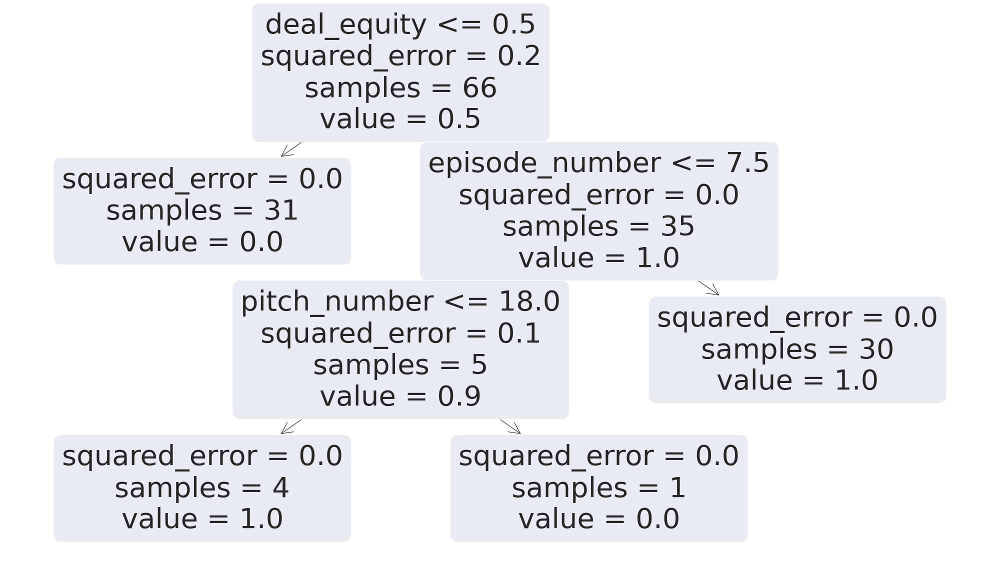

In [35]:
# Visualization of Nodes for the purpose of explainability
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(32, 18), dpi=80)
plot_tree(tree_model.estimators_[0], feature_names=list(X_train.columns), rounded=True, precision=1, ax=ax)
plt.show()

####Interpreting nodes of the tree-based model

Random Forest Regressor works on the concept of the wisdom of the crowd. It is a meta estimator that fits a number of classifying decision trees on various sub-samples of the dataset and uses averaging to improve the predictive accuracy and control over-fitting.


As usual, the tree has conditions on each internal node and a value associated with each leaf (i.e. the value to be predicted). But additionally, we’ve plotted out the value at each internal node i.e. the mean of the response variables in that region.

In [36]:
# Get numerical feature importances
tree_importances = list(tree_model.feature_importances_)
# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 3))
    for feature, importance in zip(X_train.columns, tree_importances)
]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)


# Print out the feature and importances
[print("Variable: {:20} Importance: {}".format(*pair)) for pair in feature_importances];

Variable: deal_equity          Importance: 0.294
Variable: amount_per_shark     Importance: 0.281
Variable: total_sharks_invested Importance: 0.178
Variable: equity_per_shark     Importance: 0.1
Variable: deal_valuation       Importance: 0.092
Variable: pitch_number         Importance: 0.017
Variable: pitcher_ask_amount   Importance: 0.011
Variable: ask_valuation        Importance: 0.011
Variable: ask_equity           Importance: 0.008
Variable: aman_deal            Importance: 0.005
Variable: ashneer_deal         Importance: 0.003
Variable: episode_number       Importance: 0.0
Variable: deal_amount          Importance: 0.0
Variable: ashneer_present      Importance: 0.0
Variable: anupam_present       Importance: 0.0
Variable: aman_present         Importance: 0.0
Variable: namita_present       Importance: 0.0
Variable: vineeta_present      Importance: 0.0
Variable: peyush_present       Importance: 0.0
Variable: ghazal_present       Importance: 0.0
Variable: anupam_deal          Importan

The variable importance we get from the tree-based regressor re-inforces our interpretation from the linear model.

####Fitting a Support Vector Machine (SVM)

In [38]:
from sklearn import svm

regr = svm.SVR()
svm_model = regr.fit(x_train, y_train)

In [39]:
svm_predictions = svm_model.predict(x_test).round()

####Fitting a MLP Regressor

In [40]:
from sklearn.neural_network import MLPRegressor

regr = MLPRegressor(random_state=1, max_iter=500).fit(x_train, y_train)

In [41]:
mlp_predictions = regr.predict(x_test).round()

####Using AutoML to find out the best Model

In [42]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222

In [43]:
# Setting up memory
pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

5


In [45]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:53120..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpv7mox_t5
  JVM stdout: /tmp/tmpv7mox_t5/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpv7mox_t5/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:53120
Connecting to H2O server at http://127.0.0.1:53120 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,22 days
H2O_cluster_name:,H2O_from_python_unknownUser_uuvn43
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,5 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [46]:
data_hf = h2o.H2OFrame(data_df)  # Converting Pandas dataframe in H2O dataframe

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [47]:
pct_rows = 0.80  # Setting up the data split between training and test dataset.
df_train, df_test = data_hf.split_frame([pct_rows])

In [48]:
def autoML(df_train, df_test):
    X1 = df_train.columns
    y1 = "deal"

    X1.remove(y1)  # Removing the result frm our predictors data

    aml = H2OAutoML(max_runtime_secs=222, seed=1)  # Setting of AutoML
    aml.train(x=X1, y=y1, training_frame=df_train)  # Trainig the dataset on different models

    return df_train, df_test, aml


In [49]:
# Function to get best model from the AutoML leaderboard
def getBestModel(aml):
    model_index = 0
    glm_index = 0
    glm_model = ""
    aml_leaderboard_df = aml.leaderboard.as_data_frame()
    models_dict = {}

    for m in aml_leaderboard_df["model_id"]:
        models_dict[m] = model_index
        if "StackedEnsemble" not in m:
            break
        model_index = model_index + 1

    for m in aml_leaderboard_df["model_id"]:
        if "GLM" in m:
            models_dict[m] = glm_index
            break
        glm_index = glm_index + 1

    print(model_index)
    best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])
    return best_model

In [50]:
autoML = autoML(df_train, df_test)  # Training AutoML

AutoML progress: |
17:41:32.732: _train param, Dropping bad and constant columns: [brand_name, idea, anupam_present]
17:41:32.733: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.


17:41:34.787: _train param, Dropping bad and constant columns: [brand_name, idea, anupam_present]
17:41:34.787: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

█
17:41:36.373: _train param, Dropping bad and constant columns: [brand_name, idea, anupam_present]
17:41:36.373: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical bef

In [51]:
autoML[2].leaderboard  # Leaderbord of AutoML output

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
GBM_grid_1_AutoML_1_20230426_174132_model_26,0.158496,0.0251209,0.0631833,0.109626,0.0251209
GBM_3_AutoML_1_20230426_174132,0.158554,0.0251395,0.0672662,0.110415,0.0251395
GBM_grid_1_AutoML_1_20230426_174132_model_35,0.158729,0.0251949,0.0639563,0.109686,0.0251949
GBM_grid_1_AutoML_1_20230426_174132_model_5,0.161403,0.0260509,0.0662297,0.111097,0.0260509
XGBoost_lr_search_selection_AutoML_1_20230426_174132_select_grid_model_1,0.161834,0.0261901,0.0666167,0.111405,0.0261901
GBM_4_AutoML_1_20230426_174132,0.162255,0.0263266,0.067044,0.111532,0.0263266
GBM_2_AutoML_1_20230426_174132,0.162355,0.0263592,0.0677481,0.111425,0.0263592
StackedEnsemble_BestOfFamily_6_AutoML_1_20230426_174132,0.163484,0.0267269,0.0608864,0.115632,0.0267269
GBM_grid_1_AutoML_1_20230426_174132_model_34,0.163573,0.026756,0.0662248,0.111033,0.026756
GBM_grid_1_AutoML_1_20230426_174132_model_2,0.163759,0.0268169,0.0624517,0.114308,0.0268169


In [52]:
# To Get the Best Model
autoML_model = getBestModel(autoML[2])  
print(autoML_model)

0
Model Details
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_grid_1_AutoML_1_20230426_174132_model_26


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    43                 43                          5069                   2            4            3.16279       4             5             4.74419

ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 0.015819678754828453
RMSE: 0.12577630442507226
MAE: 0.04595873739242881
RMSLE: 0.08721642922981374
Mean Residual Deviance: 0.015819678754828453

ModelMetricsRegression: gbm
** Reported on cross-validation data. **

MSE: 0.025120942984664177
RMSE: 0.15849587686960243
MAE: 0.06318333381680662
RMSLE: 0.10962614696235237
Mean Resi

In [53]:
autoML_best_predictions = autoML_model.predict(df_test).round()

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [54]:
autoMLpredictions = h2o.as_list(autoML_best_predictions, use_pandas=False)
y_test_h2O = h2o.as_list(df_test["deal"], use_pandas=False)

In [55]:
def flatten(t):
    listt = [(item) for sublist in t for item in sublist][1:]
    listt = [float(x) for x in listt]
    x = pd.Series(listt)
    return x

In [56]:
autoMLpredictions = flatten(autoMLpredictions)
y_test_h2O = flatten(y_test_h2O)

####Hyperparameter Tuning of AutoML's Best Model

In [57]:
train, validate, test = np.split(
    data_df.sample(frac=1, random_state=42),
    [int(0.6 * len(X)), int(0.8 * len(X))],
)
train = h2o.H2OFrame(train)
validate = h2o.H2OFrame(validate)
test = h2o.H2OFrame(test)

drf_hyper_params = {
    "ntrees": [10, 25, 50, 75, 100],
    "max_depth": [5, 7, 10, 14],
    "sample_rate": [0.25, 0.5, 0.75, 1.0],
}

search_criteria = {"strategy": "RandomDiscrete", "max_models": 100, "seed": 1}

gbm_grid2 = H2OGridSearch(
    model=H2ORandomForestEstimator,
    grid_id="gbm_grid2",
    hyper_params=drf_hyper_params,
    search_criteria=search_criteria,
)

gbm_grid2.train(
    x=list(X.columns),
    y="deal",
    training_frame=train,
    validation_frame=validate,
    seed=1,
)


def find_best_model_from_grid(h2o_grid, test_parameter):
    model_list = []
    for grid_item in h2o_grid:
        if test_parameter is "r2":
            if not (grid_item.r2() == "NaN"):
                model_list.append(grid_item.r2())
            else:
                model_list.append(0.0)
        elif test_parameter is "auc":
            if not (grid_item.auc() == "NaN"):
                model_list.append(grid_item.auc())
            else:
                model_list.append(0.0)
    max_index = model_list.index(max(model_list))
    best_model = h2o_grid[max_index]
    print("Model ID with best R2: " + best_model.model_id)
    if test_parameter is "r2":
        print("Best R2: " + str(best_model.r2()))
    elif test_parameter is "auc":
        print("Best AUC: " + str(best_model.auc()))
    return best_model


best_drf_model = find_best_model_from_grid(gbm_grid2, "r2")

Parse progress: |

"is" with a literal. Did you mean "=="?
"is" with a literal. Did you mean "=="?
"is" with a literal. Did you mean "=="?
"is" with a literal. Did you mean "=="?
"is" with a literal. Did you mean "=="?
"is" with a literal. Did you mean "=="?
"is" with a literal. Did you mean "=="?
"is" with a literal. Did you mean "=="?


████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
drf Grid Build progress: |███████████████████████████████████████████████████████| (done) 100%
Model ID with best R2: gbm_grid2_model_13
Best R2: 0.8744145180932749


"is" with a literal. Did you mean "=="?
"is" with a literal. Did you mean "=="?
"is" with a literal. Did you mean "=="?
"is" with a literal. Did you mean "=="?


####How do training, validation, and test metrics compare?

The best model (AutoML's Hyperparameter tuned model) has done pretty well on both the Training Dataset as well as Validation Dataset.

As the Mean Residual Deviance of this model on training and validation dataset is ~0.0309 and ~0.0309 respectively. 

In [58]:
best_drf_model

,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
,10.0,10.0,981.0,1.0,3.0,2.1,2.0,5.0,3.2
,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance,validation_rmse,validation_mae,validation_deviance
,2023-04-26 17:46:10,4.431 sec,0.0,nan,nan,nan,nan,nan,nan
,2023-04-26 17:46:10,4.434 sec,1.0,0.1482067,0.0372960,0.0219652,0.0213861,0.0178372,0.0004574
,2023-04-26 17:46:10,4.435 sec,2.0,0.1912871,0.0803723,0.0365908,0.0333353,0.0321533,0.0011112
,2023-04-26 17:46:10,4.436 sec,3.0,0.1757107,0.0698531,0.0308742,0.0314165,0.0306538,0.0009870
,2023-04-26 17:46:10,4.438 sec,4.0,0.1712982,0.0659910,0.0293431,0.0304847,0.0299041,0.0009293
,2023-04-26 17:46:10,4.440 sec,5.0,0.1819638,0.0739595,0.0331108,0.0702203,0.0432781,0.0049309
,2023-04-26 17:46:10,4.441 sec,6.0,0.1762915,0.0699978,0.0310787,0.0614409,0.0406743,0.0037750
,2023-04-26 17:46:10,4.443 sec,7.0,0.1746081,0.0666914,0.0304880,0.0545821,0.0375496,0.0029792


In [59]:
autoML_model.predict

<bound method ModelBase.predict of H2OGradientBoostingEstimator({'parms': {'model_id': {'__meta': {'schema_version': 3, 'schema_name': 'ModelParameterSchemaV3', 'schema_type': 'Iced'}, 'name': 'model_id', 'label': 'model_id', 'help': 'Destination id for this model; auto-generated if not specified.', 'required': False, 'type': 'Key<Model>', 'default_value': None, 'actual_value': {'__meta': {'schema_version': 3, 'schema_name': 'ModelKeyV3', 'schema_type': 'Key<Model>'}, 'name': 'GBM_grid_1_AutoML_1_20230426_174132_model_26', 'type': 'Key<Model>', 'URL': '/3/Models/GBM_grid_1_AutoML_1_20230426_174132_model_26'}, 'input_value': None, 'level': 'critical', 'values': [], 'is_member_of_frames': [], 'is_mutually_exclusive_with': [], 'gridable': False}, 'training_frame': {'__meta': {'schema_version': 3, 'schema_name': 'ModelParameterSchemaV3', 'schema_type': 'Iced'}, 'name': 'training_frame', 'label': 'training_frame', 'help': 'Id of the training data frame.', 'required': False, 'type': 'Key<Fra

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

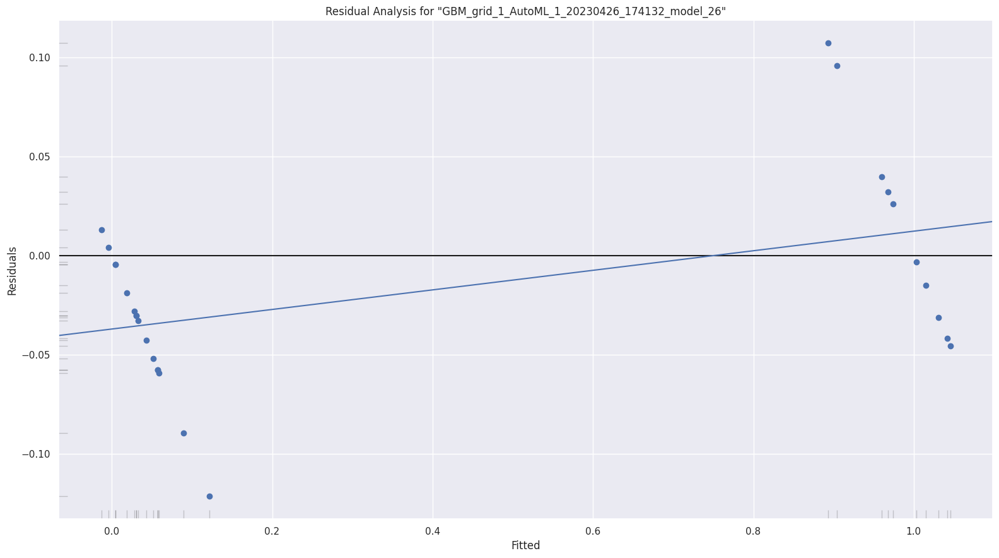

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

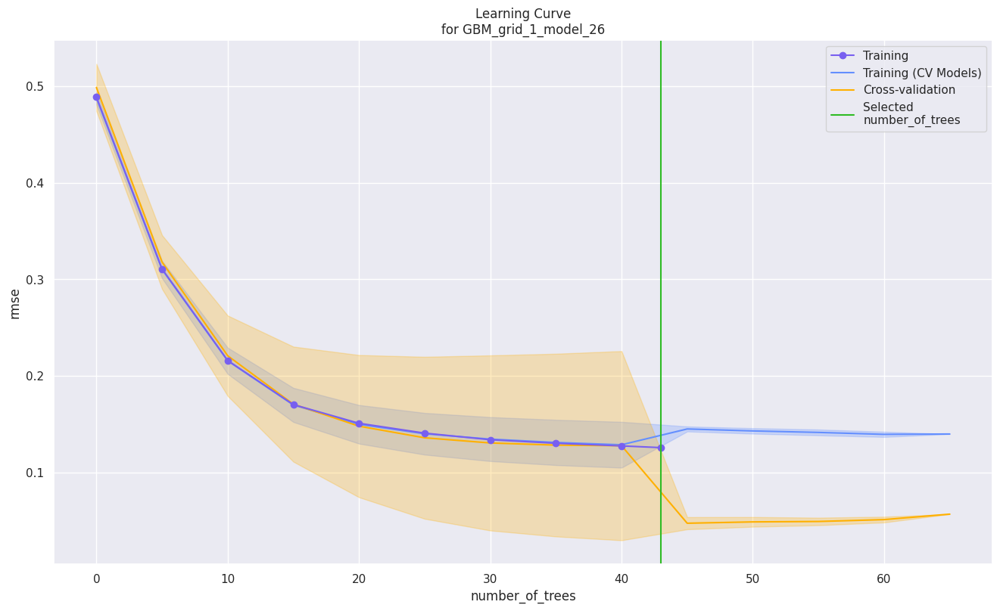

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

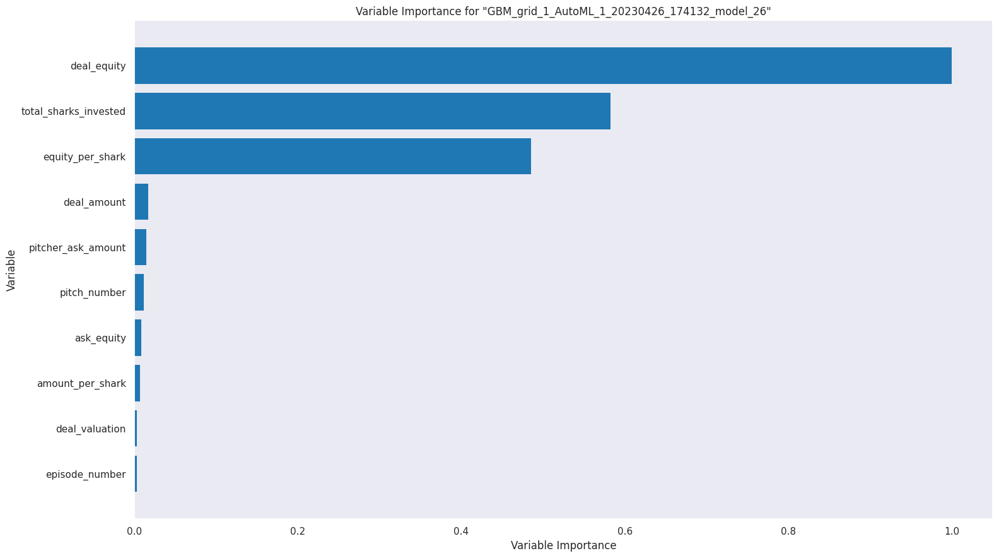

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

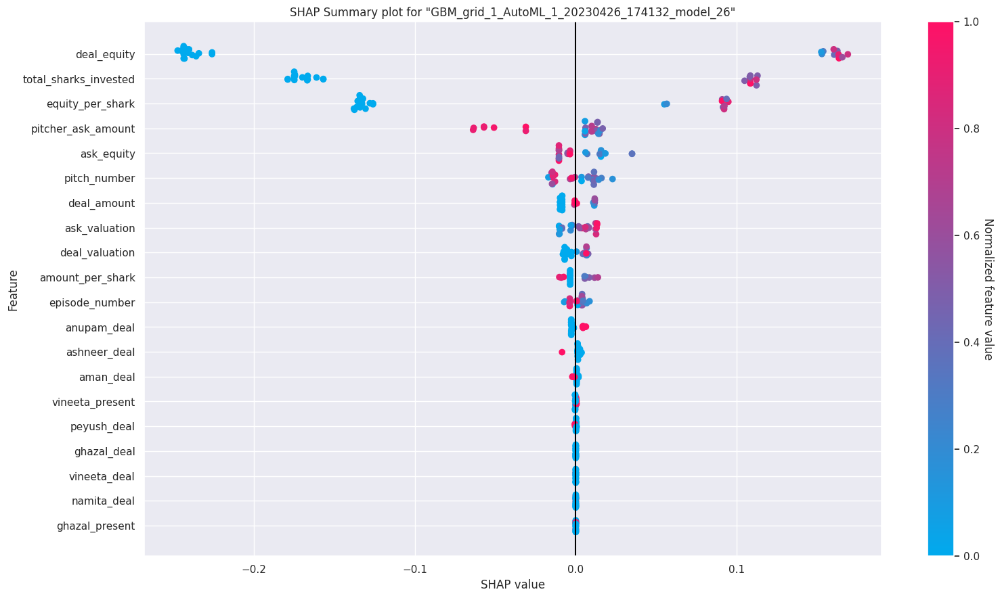

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

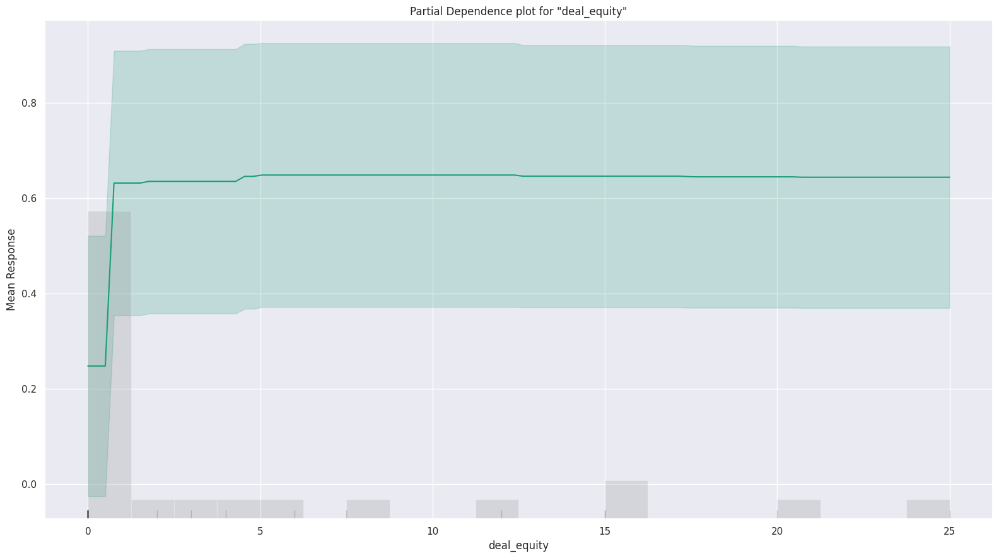

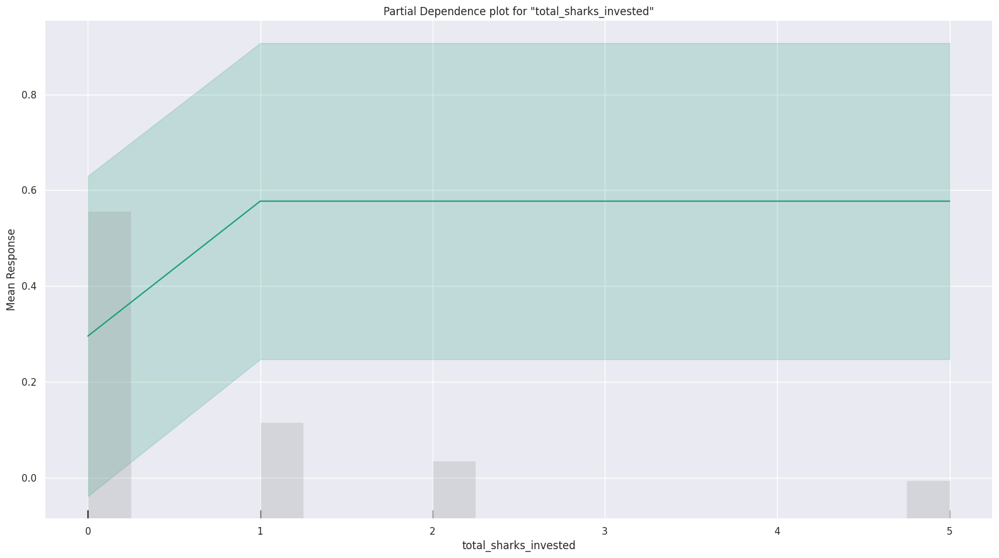

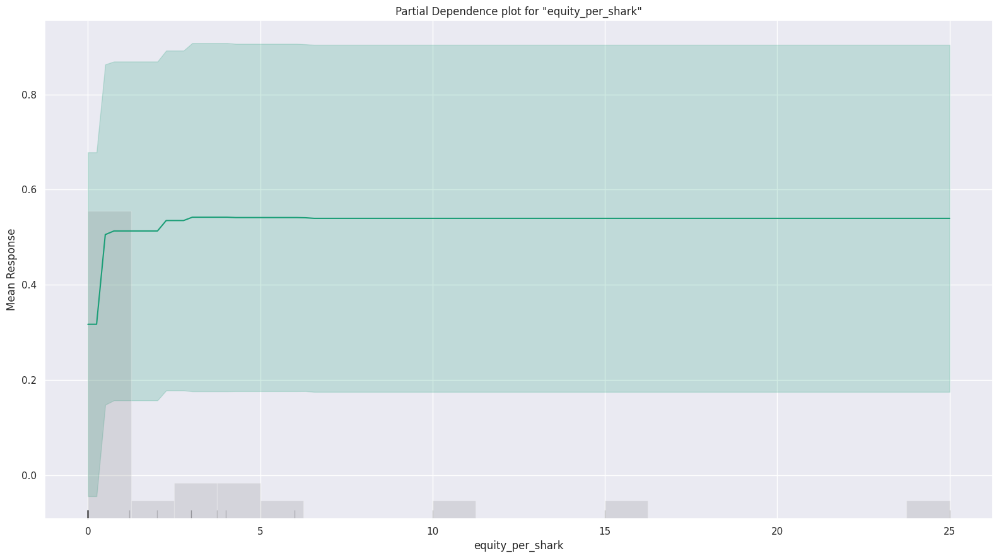

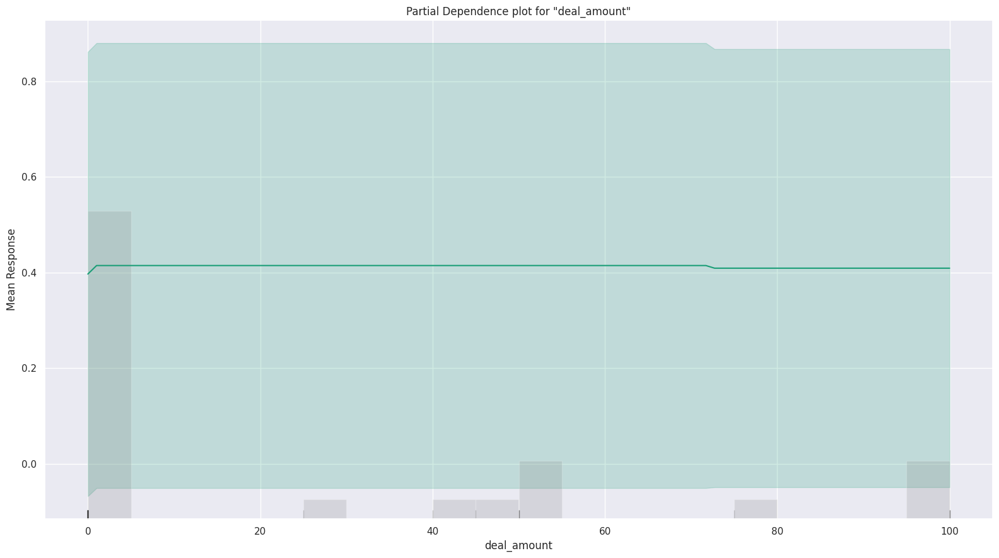

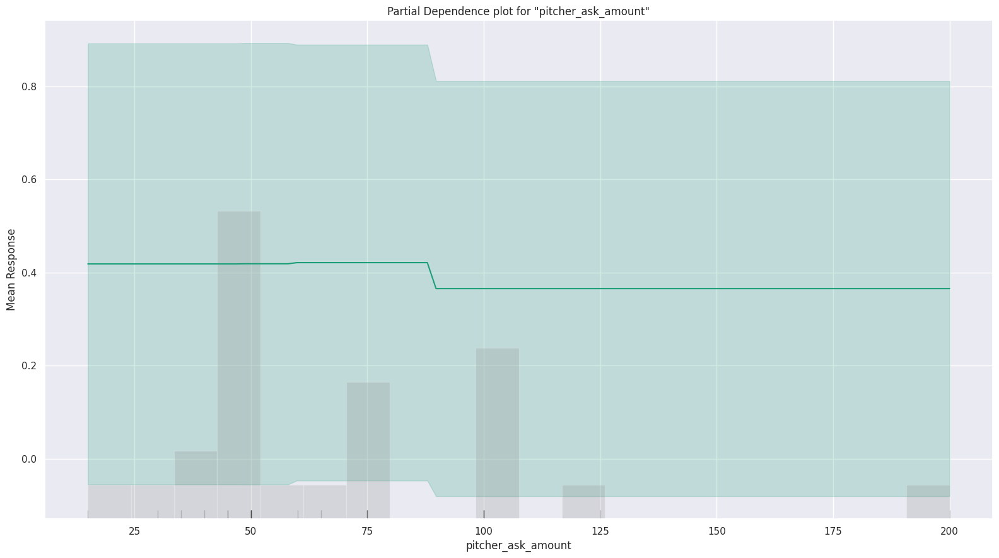

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

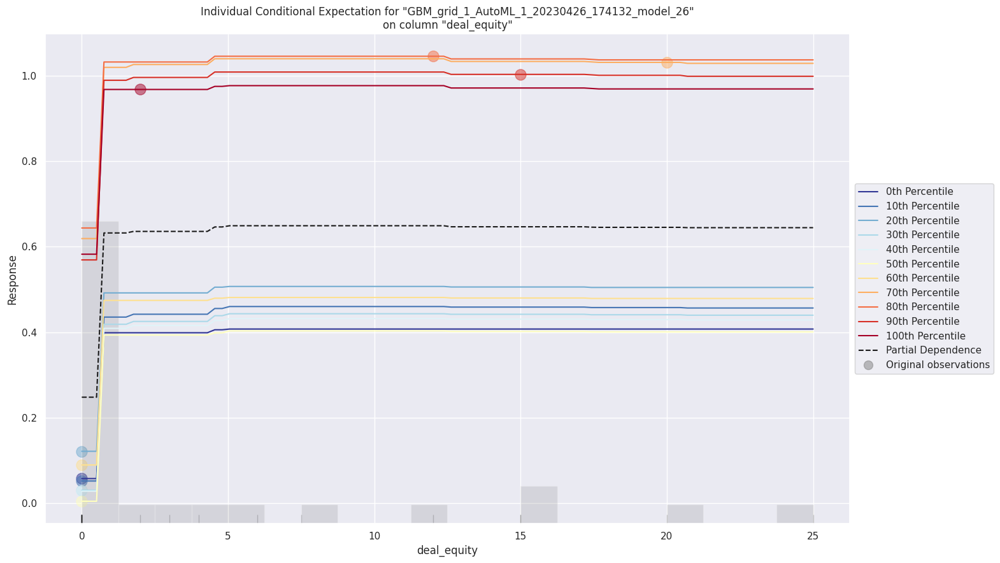

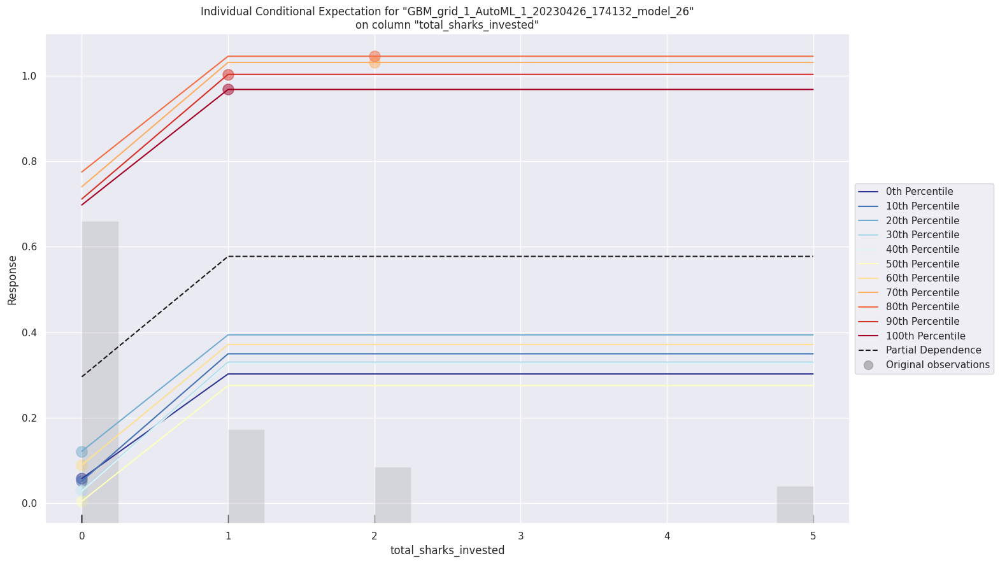

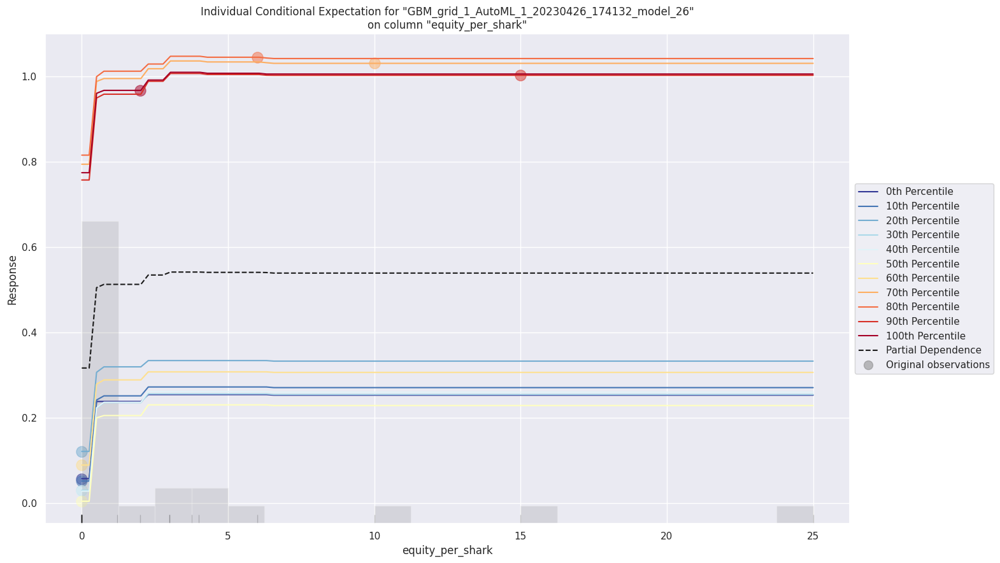

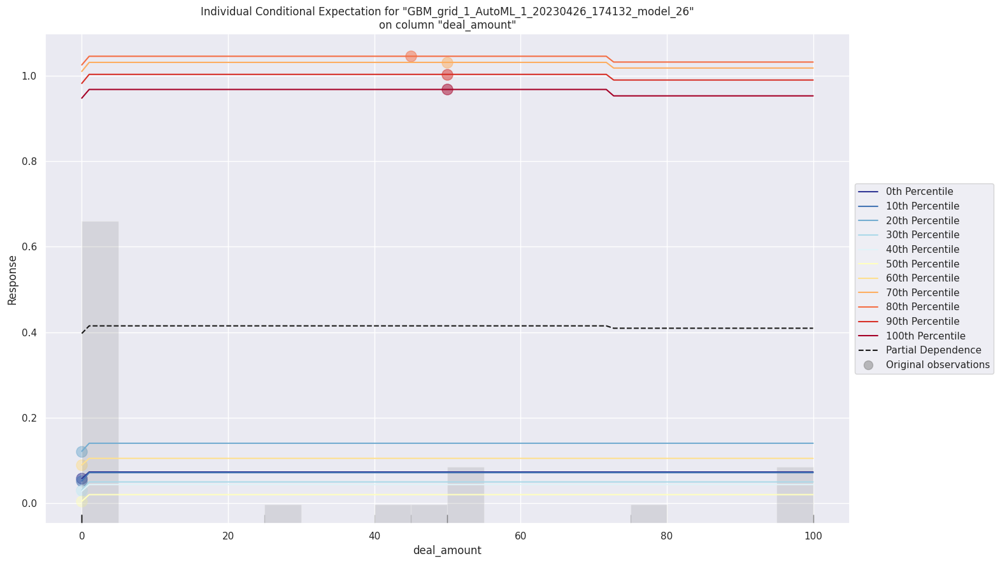

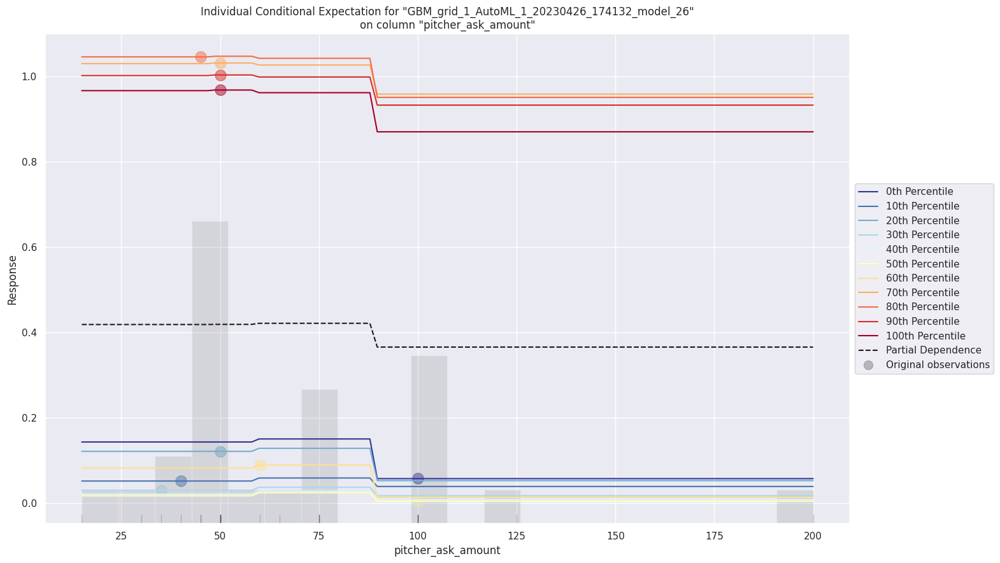

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

In [60]:
#AutoMl explainability 
autoML_model.explain(autoML[1])

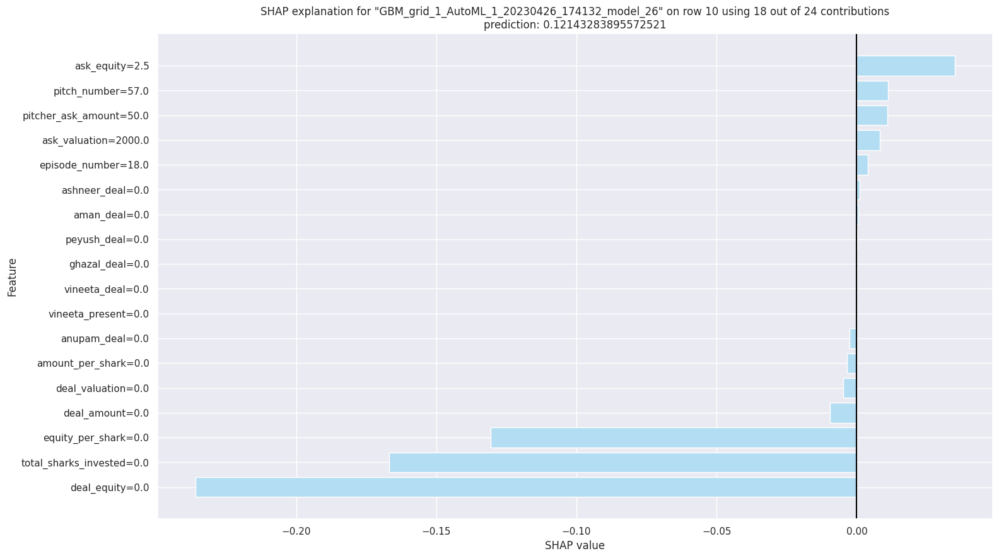

In [61]:
autoML_model.shap_explain_row_plot(
    autoML[1], 10
)  # Lets Analyze the 10th row in Test Data

####Interpreting Best Model from AutoML

####Residual Analysis:

Here, we can see the striped lines of residuals, which is an artifact of having an integer value as a response value, instead of a real value. It can also be observed from the below graph that residuals are normally distributed. Residuals signify that residuals don't have heteroscedasticity.

####Variable Importance:

In the variable importance plot we can observe that the plot replicates the results which we got from the Linear Model and Tree-Based Model above. The variable importance has been scaled between 0 to 1.

with deal_equity, deal_valuation, total_sharks_invested, amount_per_shark, equity_per_shark being the significant variables.

####SHAP Summary :

From the SHAP summary diagram, we can interpret a few conclusions -


*   All the features are listed as per their importance in making the prediction, that is deal_equity is more significant followed by deal equity, deal valuation, equity_per_shark, total_sharks_invested, amount_per_shark and so on.
*   The position on the SHAP value axis indicates the impact the feature has on the prediction either positive or negative. That is, the more the data point is away from the 0.0 shap value - the more its impact is. As we can see deal_equity has the most impact on the probability of deal. The color of the dot represents (Red - High, Blue - Low) the impact of the value on the result. i.e. - Hight percentage of deal_equity results in high probability of deal, a low amount of ask_valuation results in high probability of deal, and so on.


The advantage of SHAP analysis over normal feature importance is that we could visualize how the feature is affecting the target at different values. The standard methods tend to overestimate the importance of continuous or high-cardinality categorical variables.



####Partial Dependence Plot (PDP):

A partial dependence plot shows the marginal effect of a feature on the target(deal in our dataset). It is achieved by keeping all other variables constant and changing the value of one variable to get its PDP.

For Interpretation purposes, let us pick up the two most important variables - deal_equity and deal_amount.


*   As we can see that when the rest of the variables are kept constant and a marginal change is made in deal_equity, we can see the mean response increases between deal_equity levels of 2 and 7. This could be interpreted as this range of deal_equity could be the deciding factor in the probablity of the deal.

The computation of partial dependence plots is intuitive: The partial dependence function at a particular feature value represents the average prediction if we force all data points to assume that feature value.



###SHAP Analysis for Linear and Tree-Based Models:

Here the x-axis is the feature and the y-axis is the output as we vary the feature. The grey histogram is the distribution of variables in the dataset and the cross made by E[Feature], E[f(x)] is the expected values.

Let us take a feature of deal_valuation

For the linear model the cross is made at approx E[f(x)] 5.74

For Tree-based model the cross is made at approx E[f(x)] 5.735

So as the deal_valuation increases the expected value also increases


Talking about the red line on the plot - When we give a sample as an input (sample_ind = 16) as an input to check the output. By plotting this we can see the difference between the model output from the expected value.

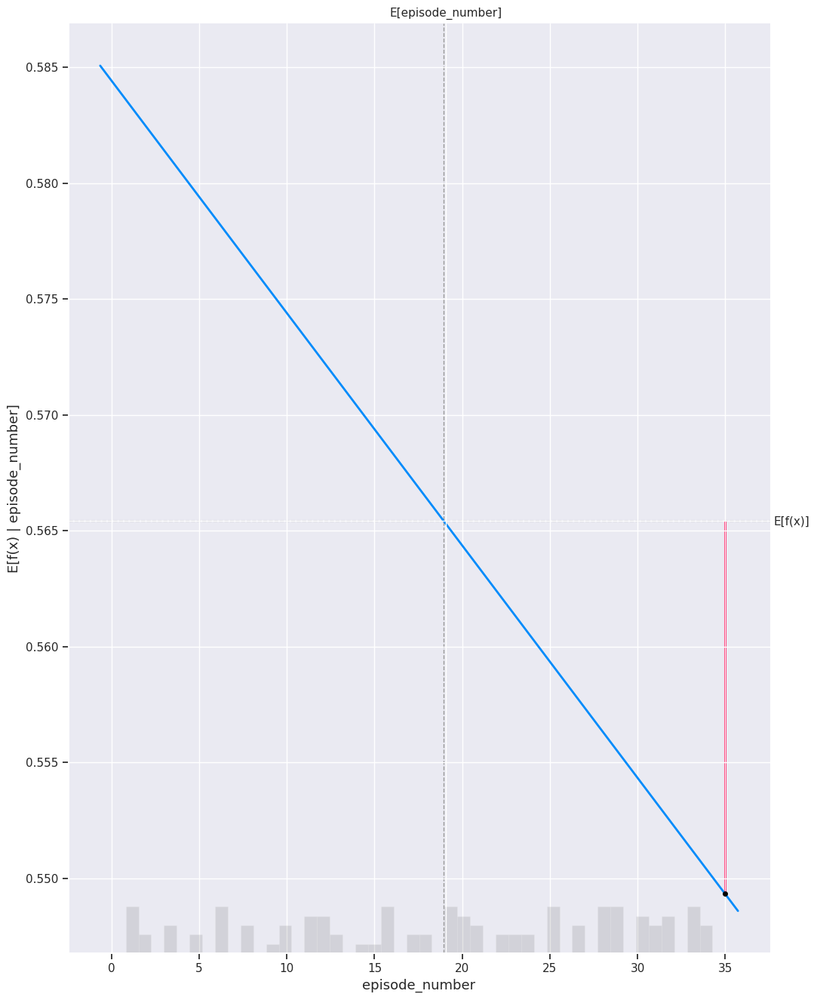

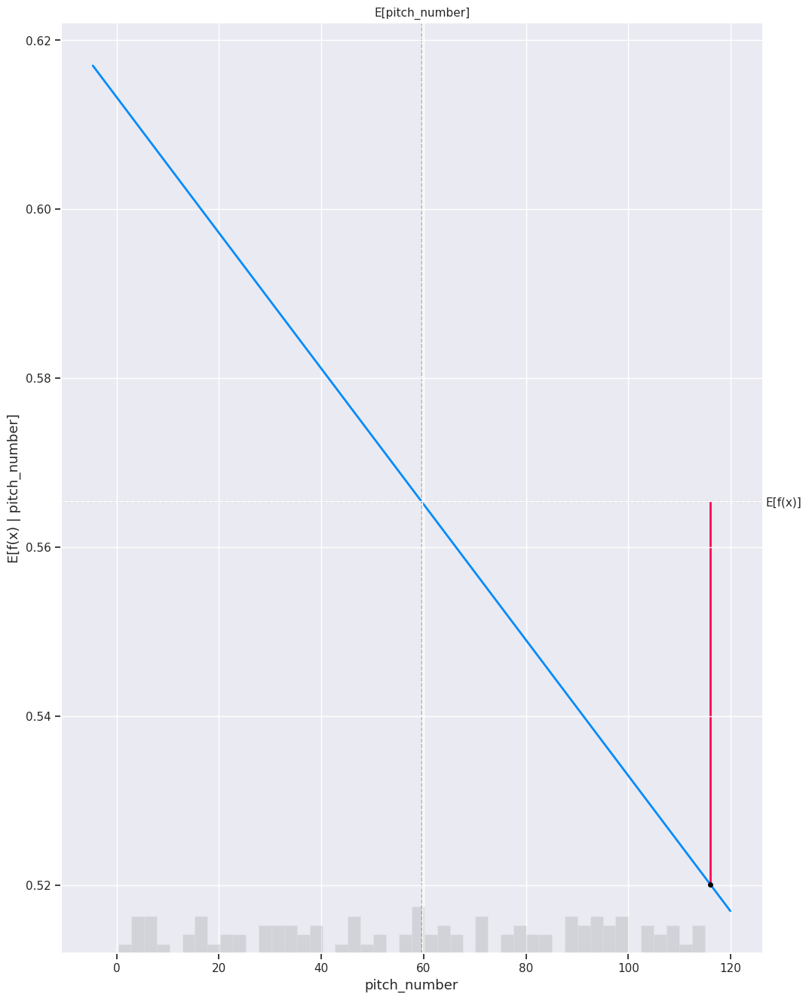

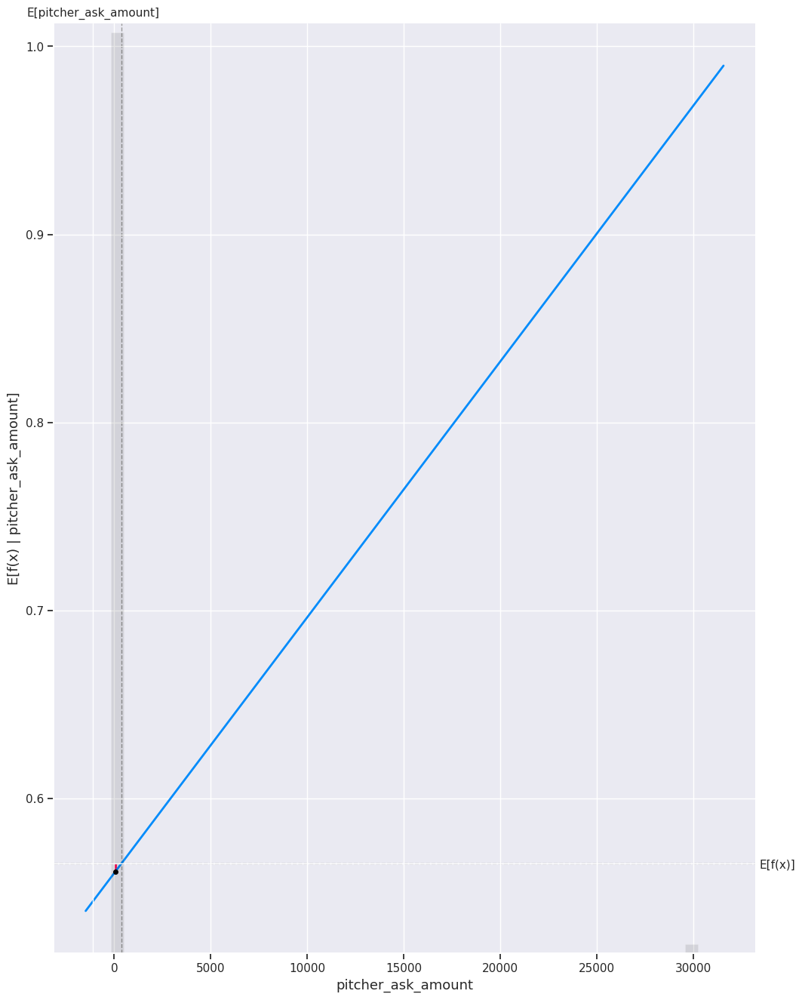

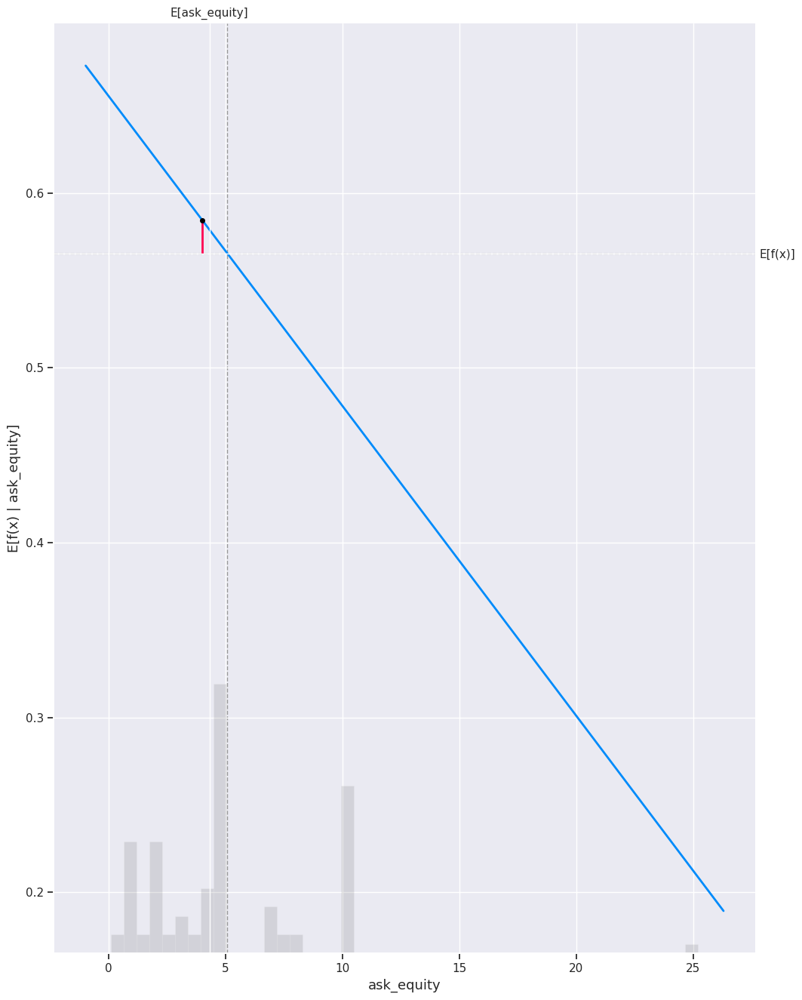

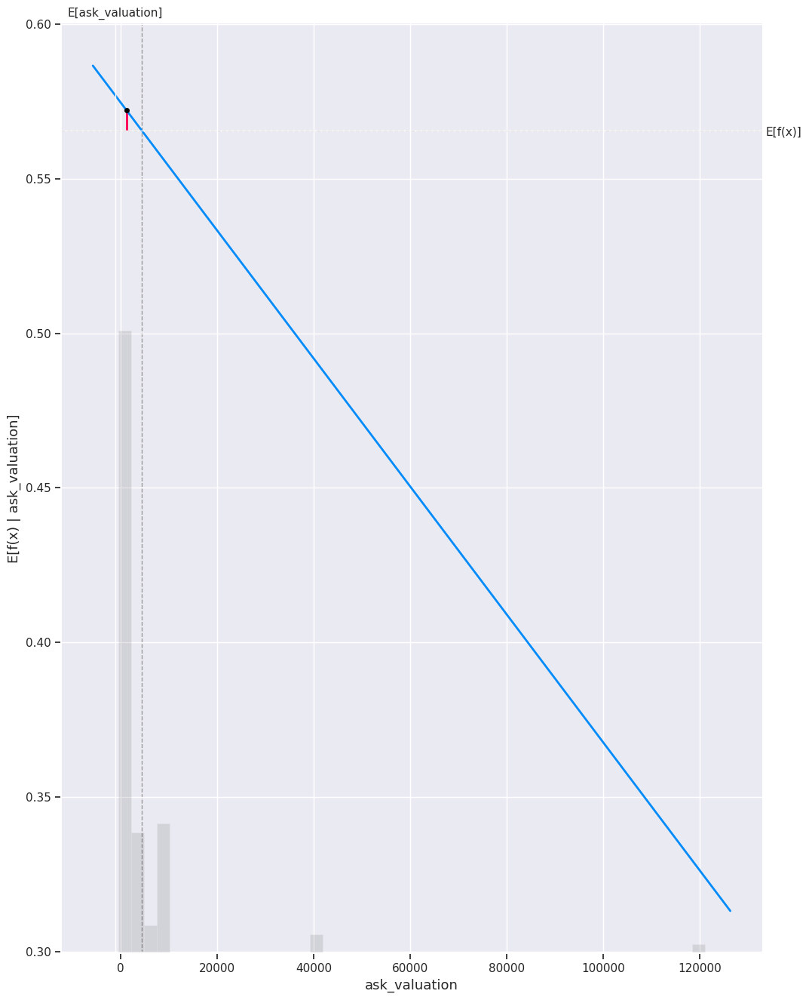

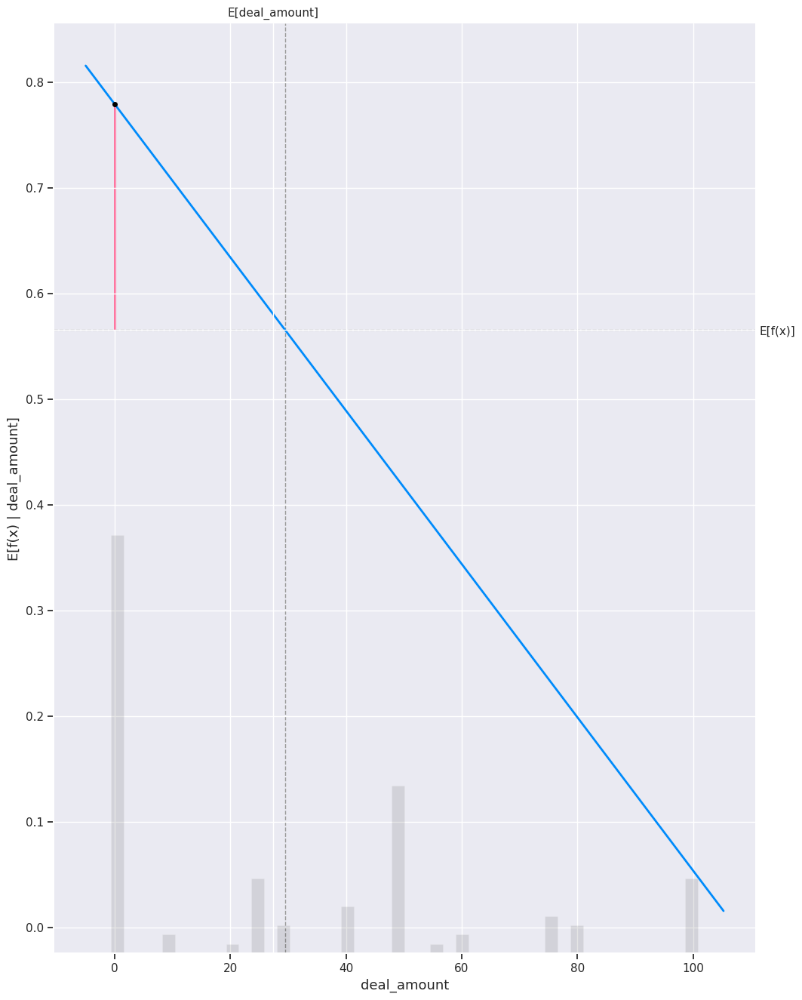

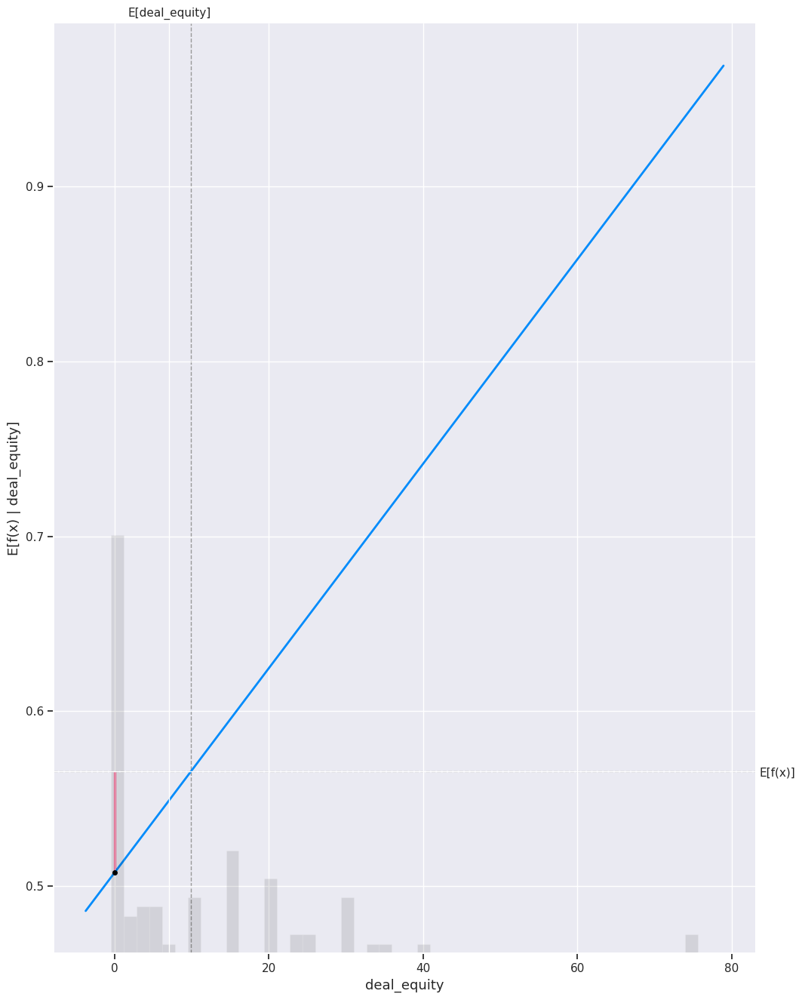

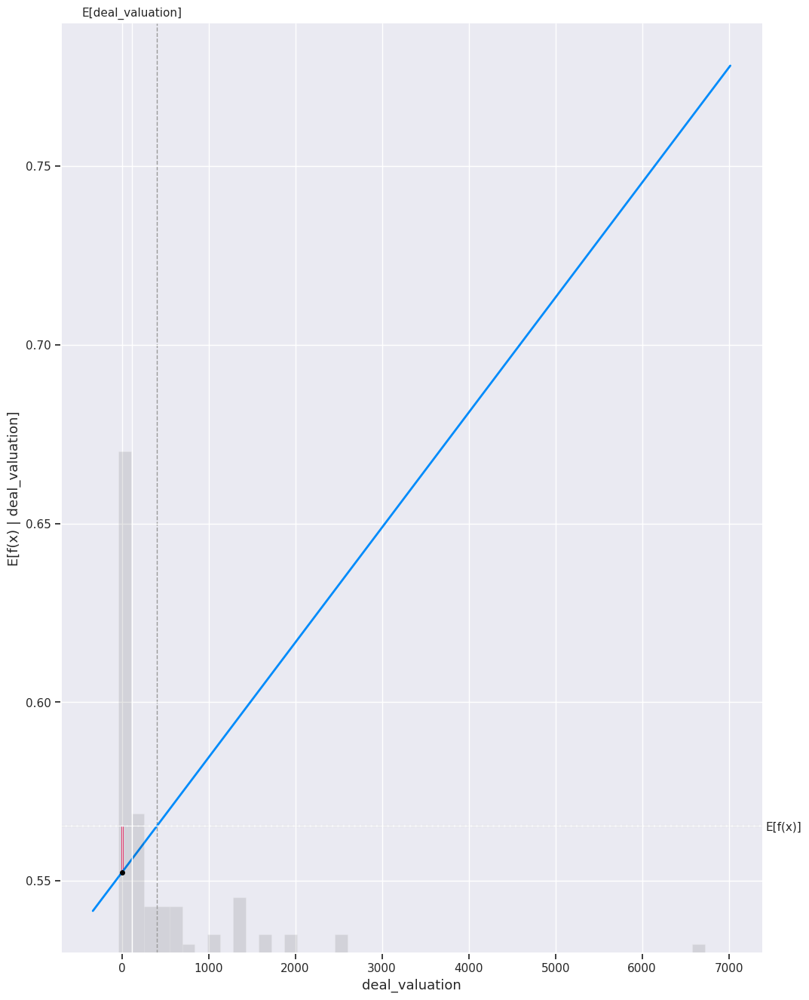

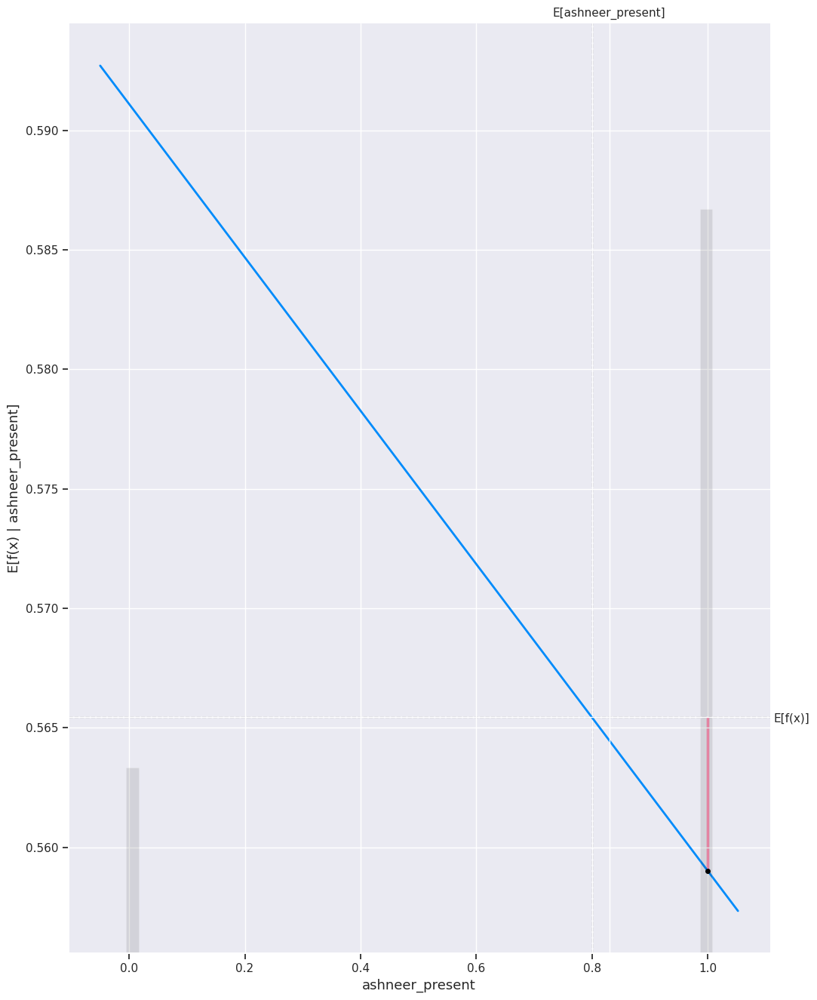

Attempting to set identical low and high xlims makes transformation singular; automatically expanding.


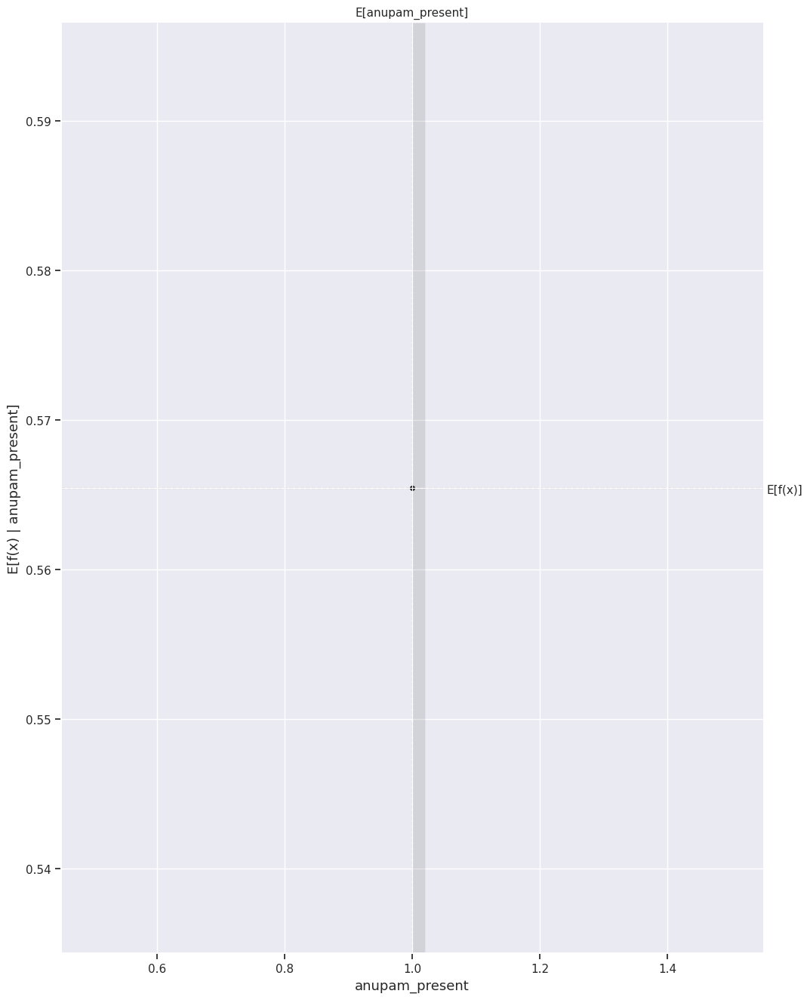

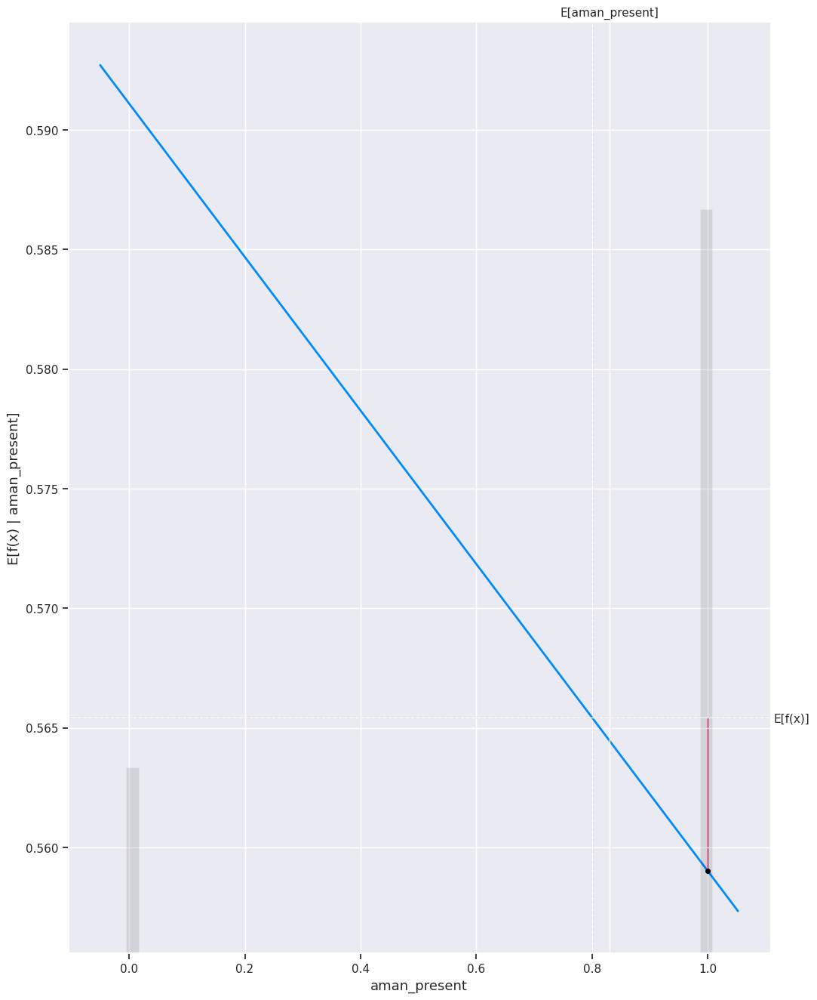

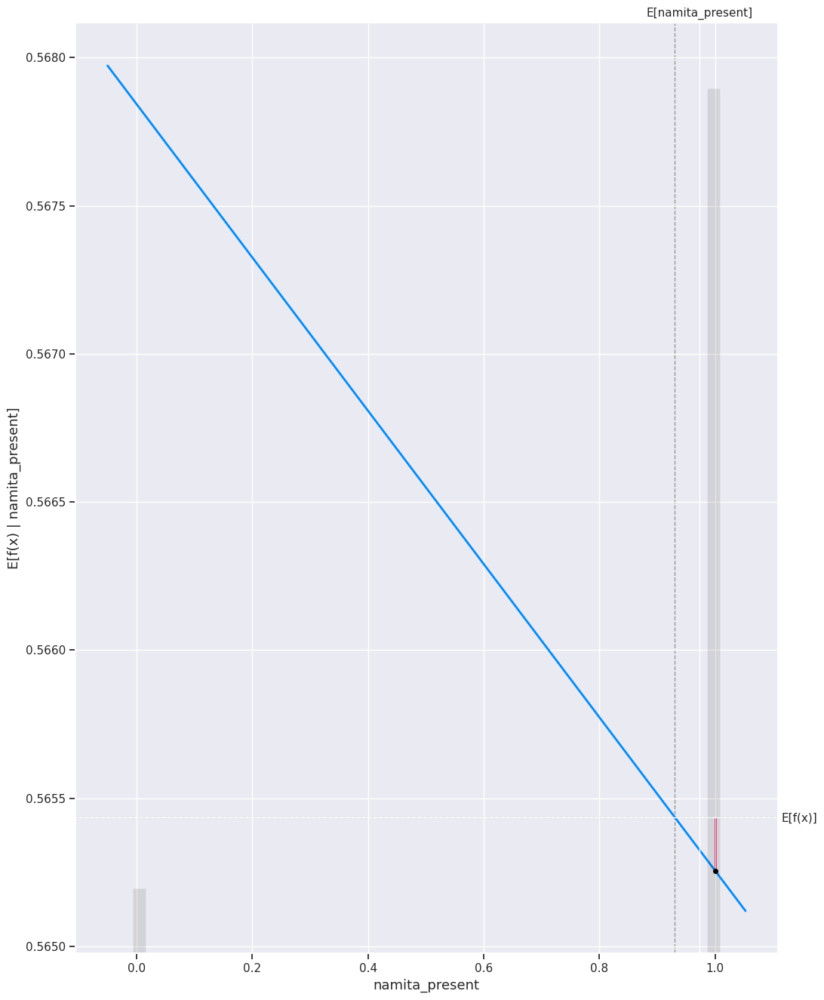

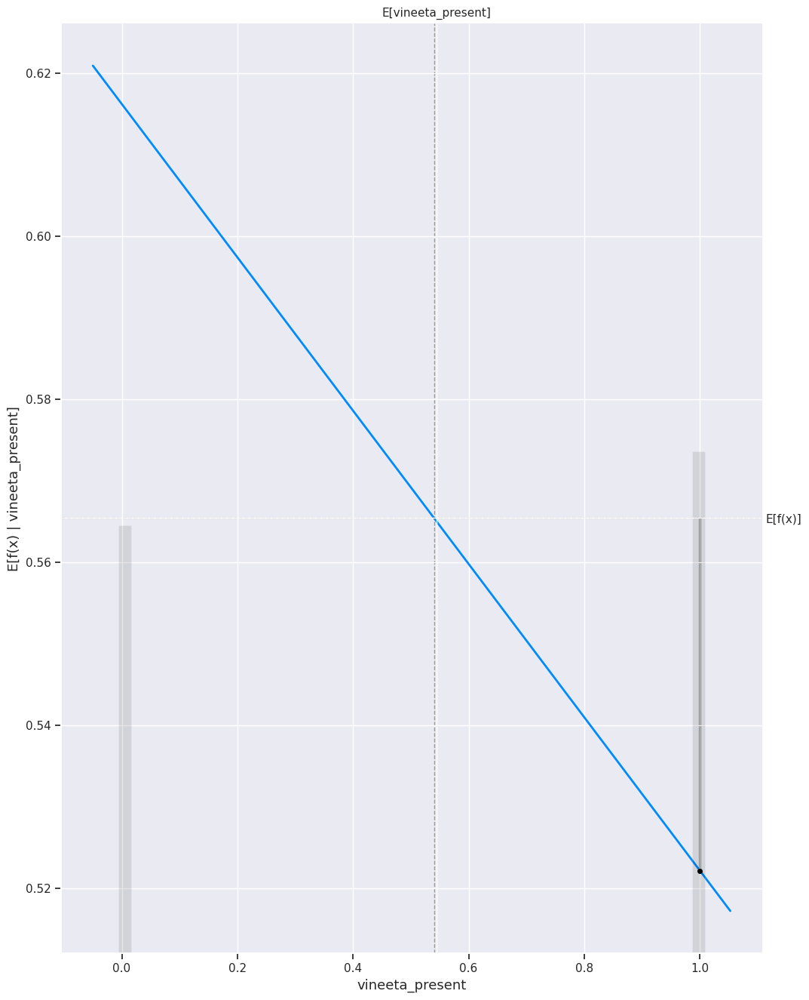

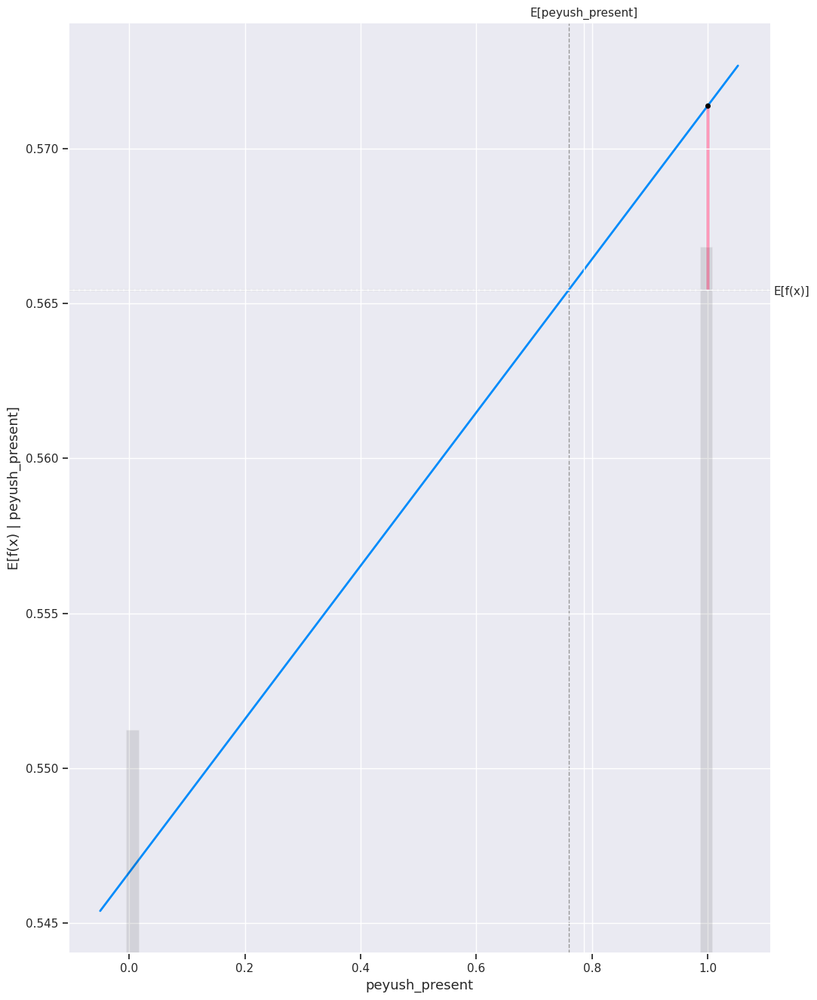

...

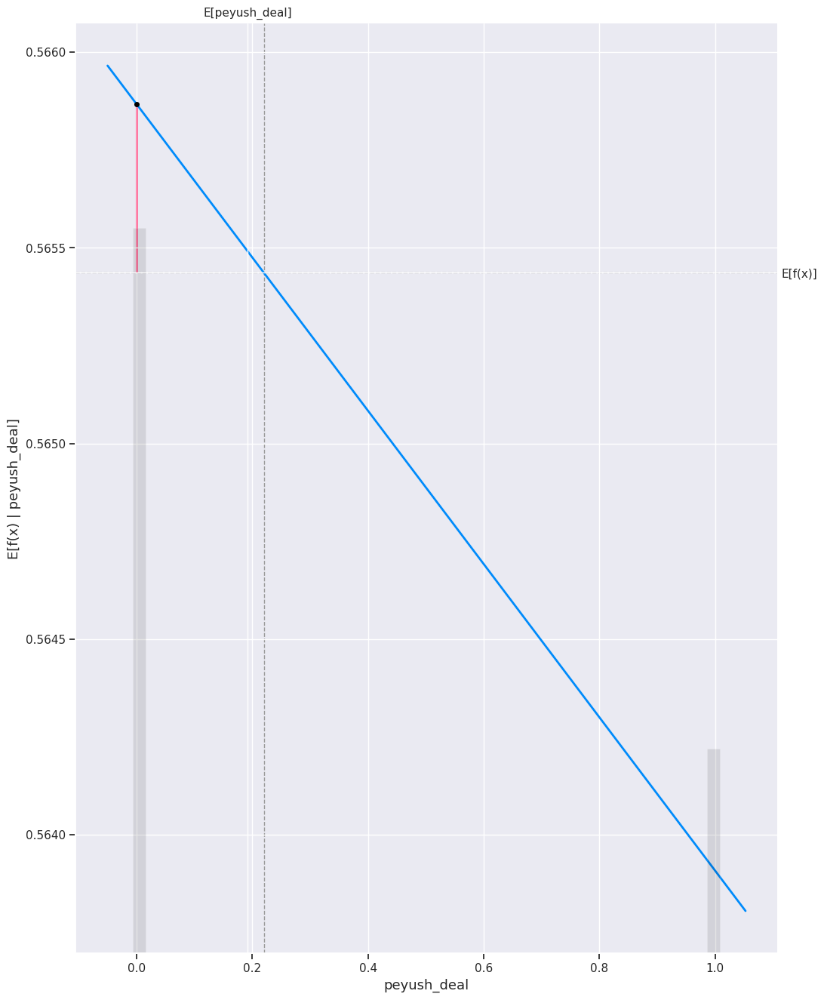

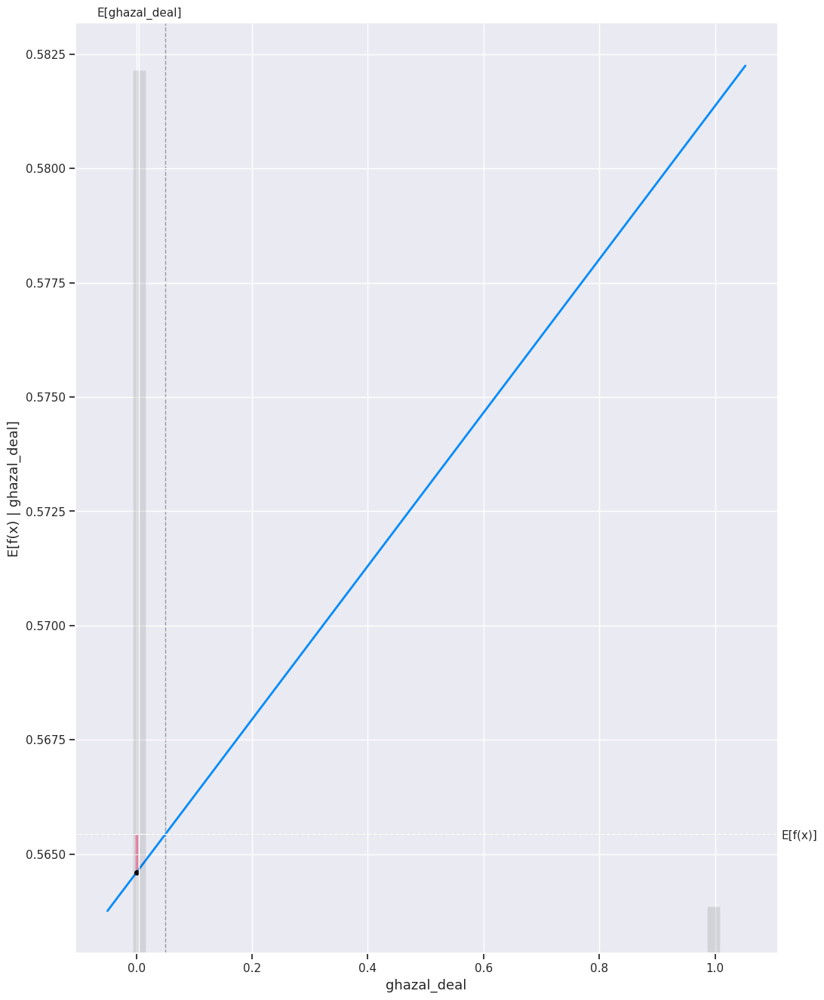

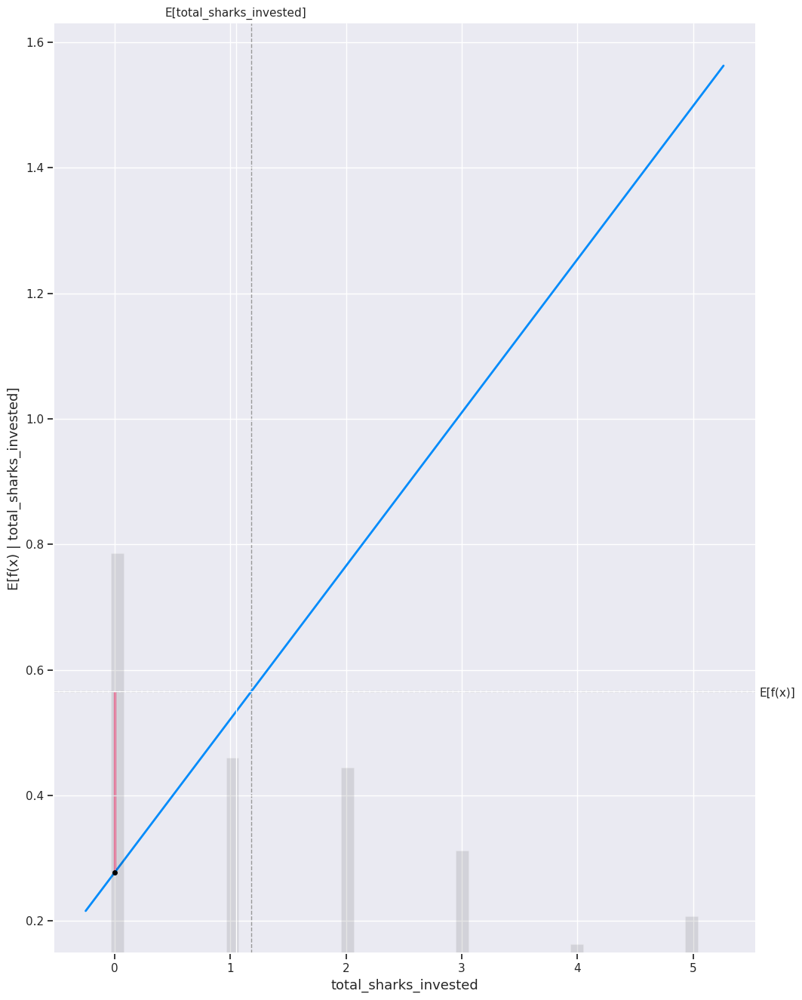

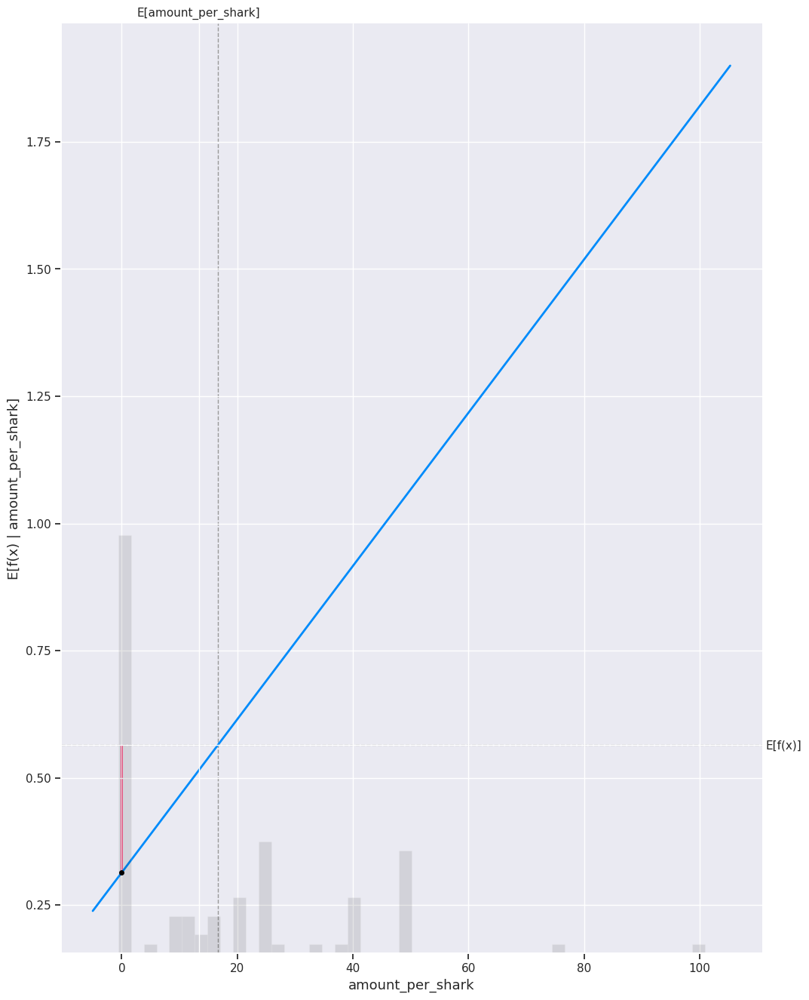

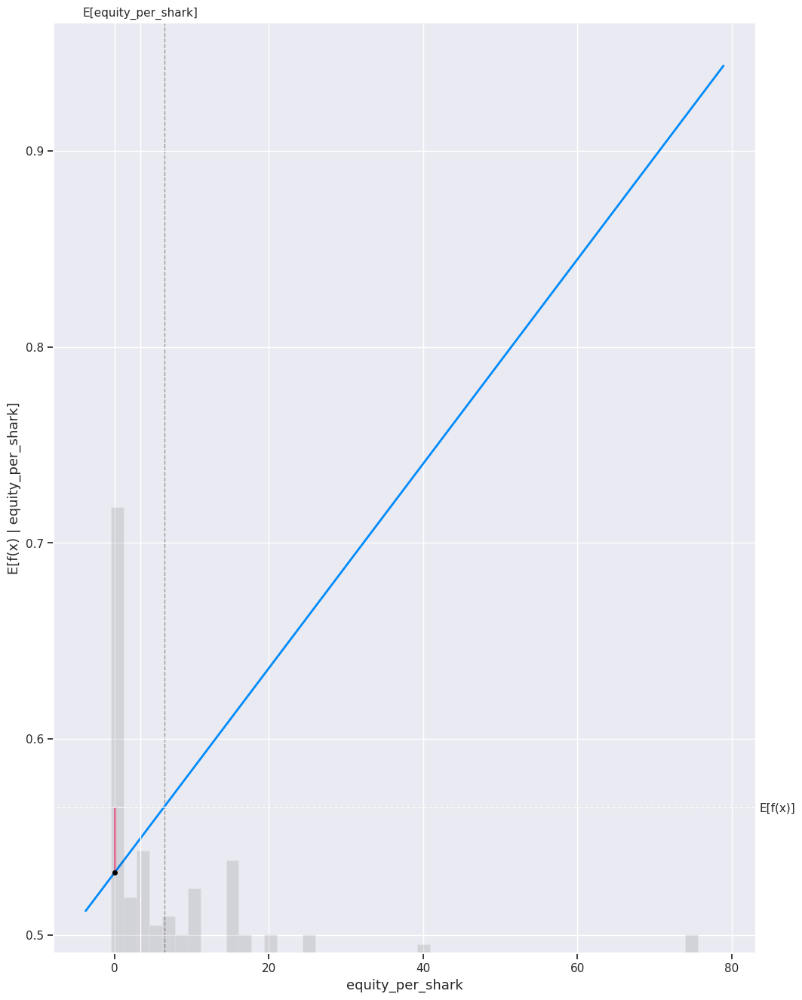

In [62]:
linear_explainer = shap.Explainer(linear_model.predict, x_train_100)
linear_shap_values = linear_explainer(X_train)
for i in X_train.columns:
    # make a standard partial dependence plot
    sample_ind = 16
    shap.partial_dependence_plot(
        i,
        linear_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
    )
     

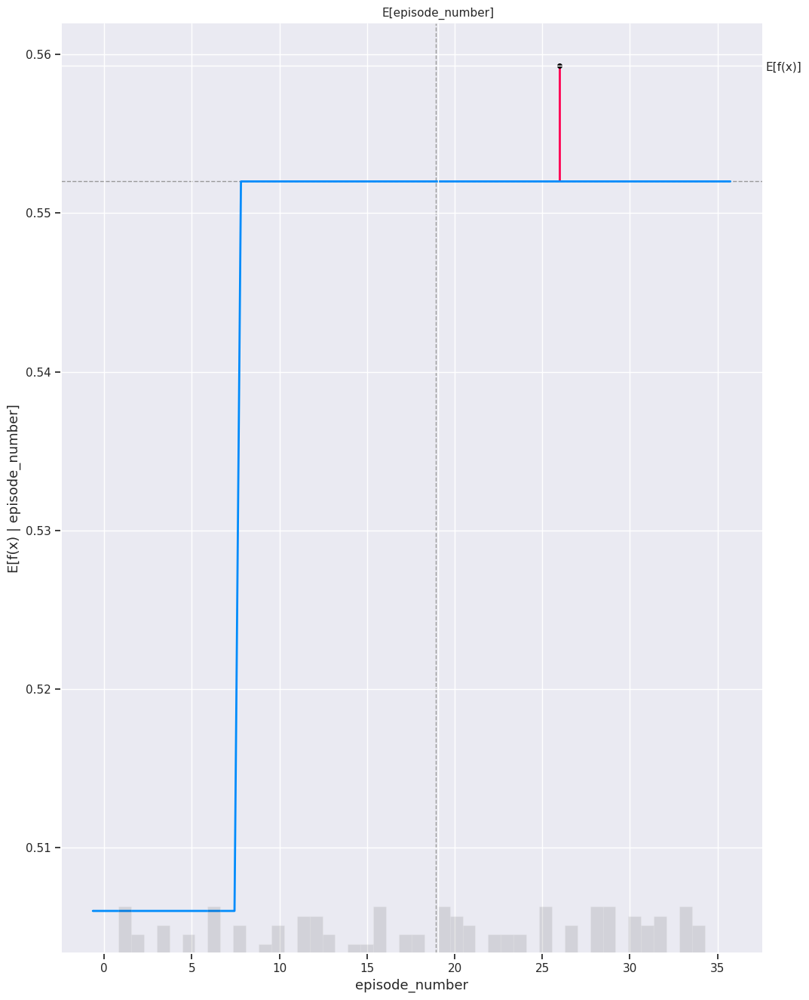

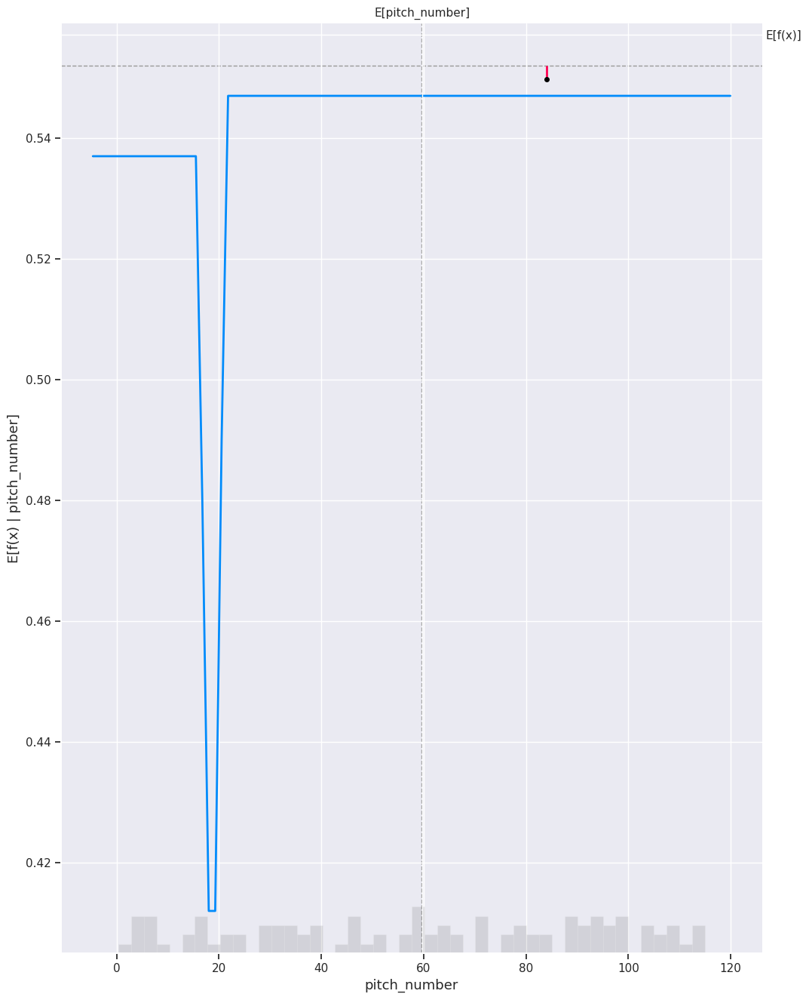

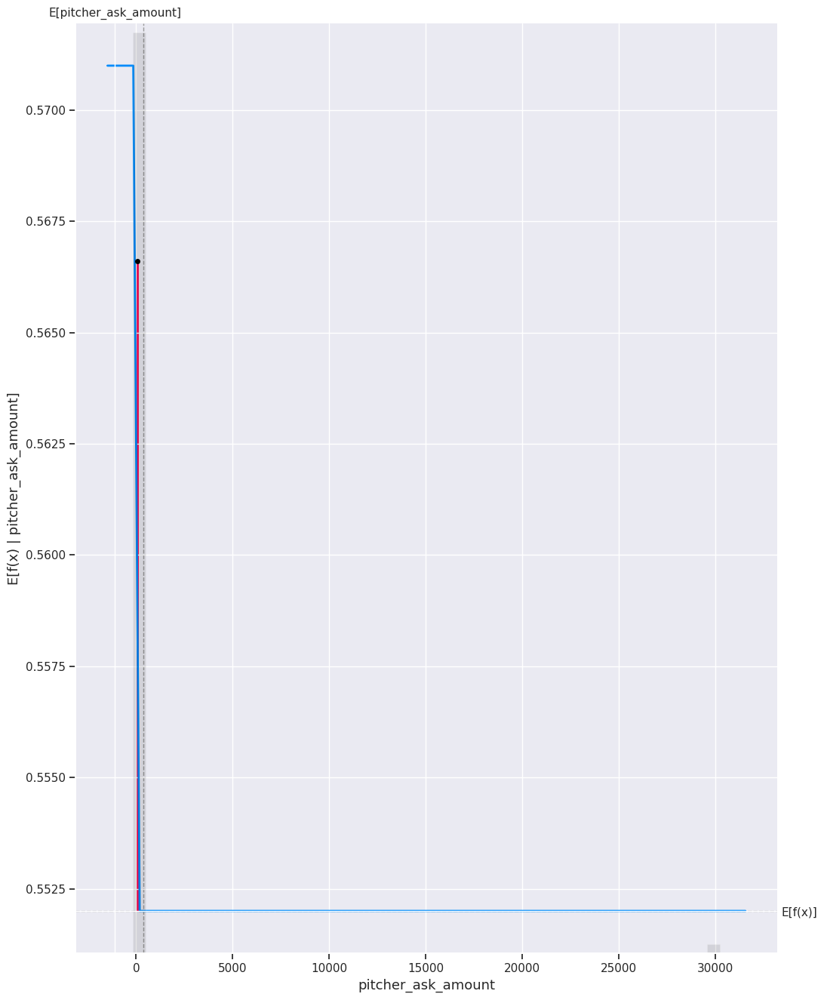

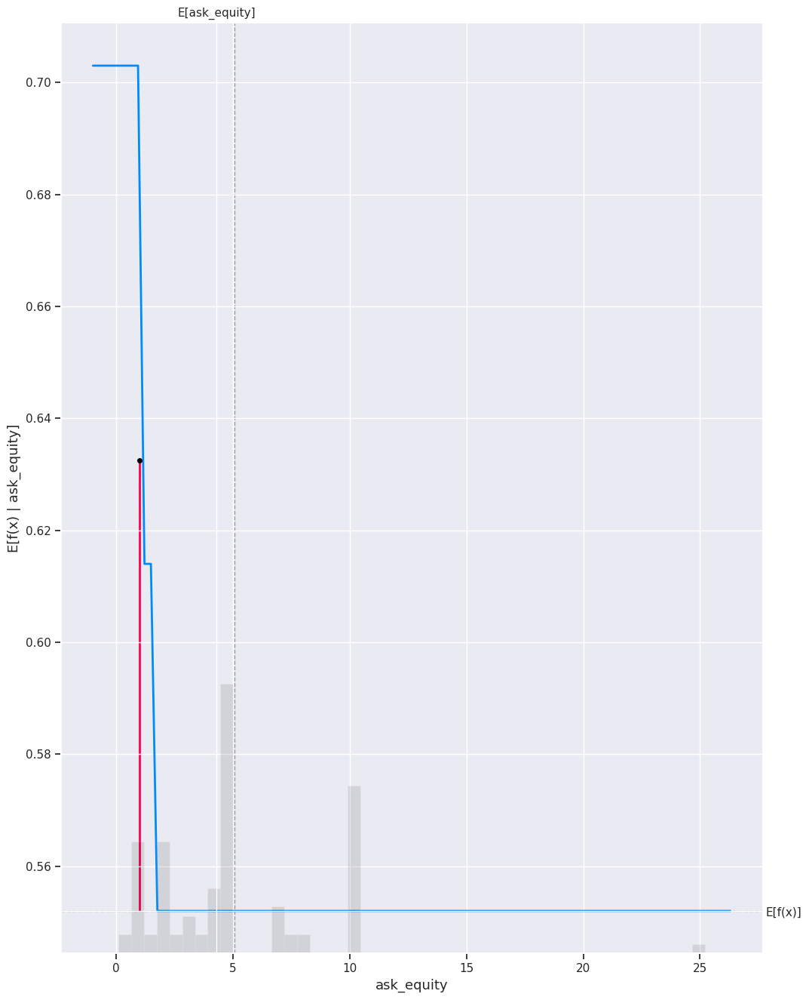

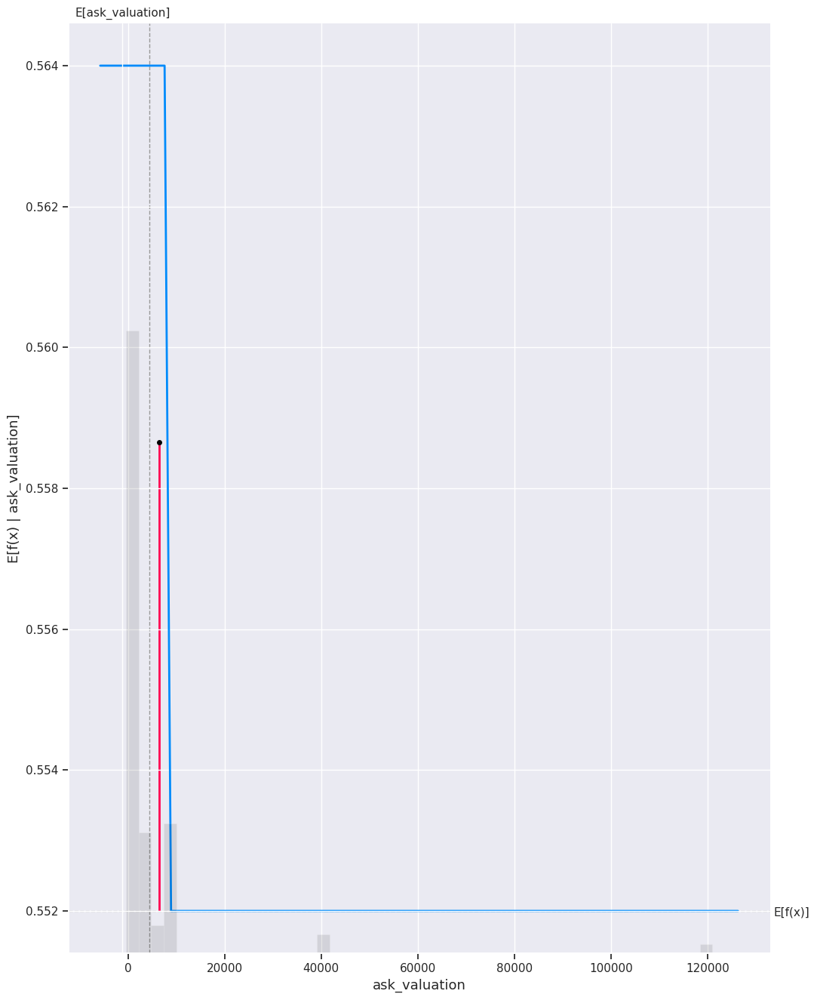

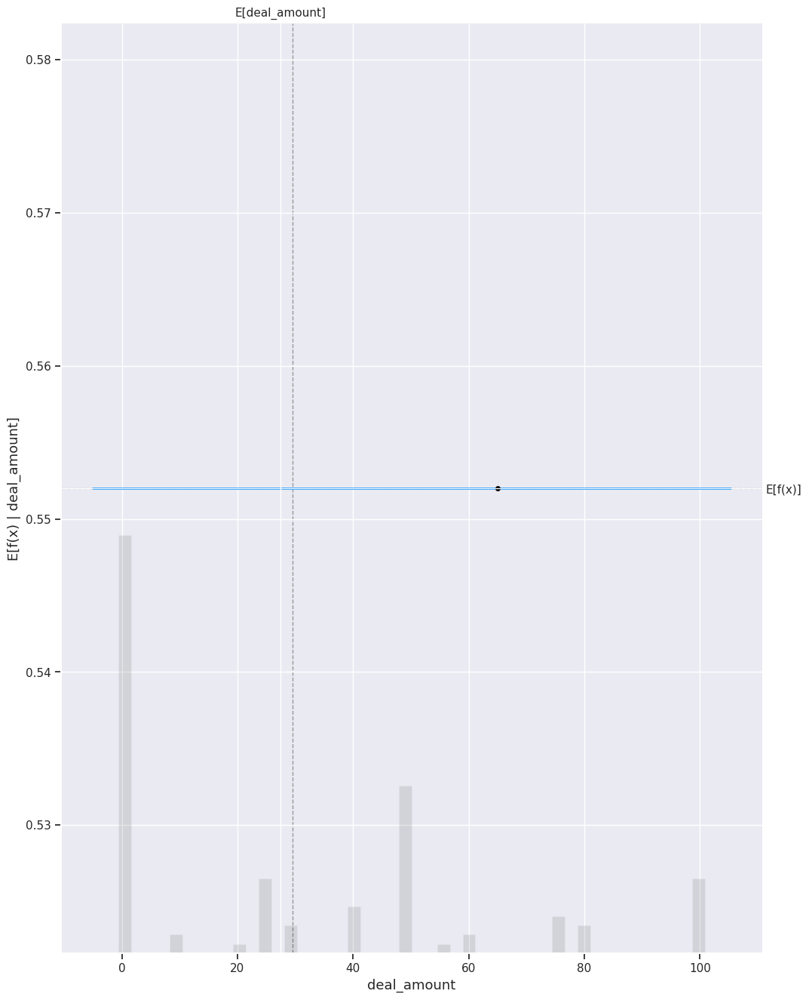

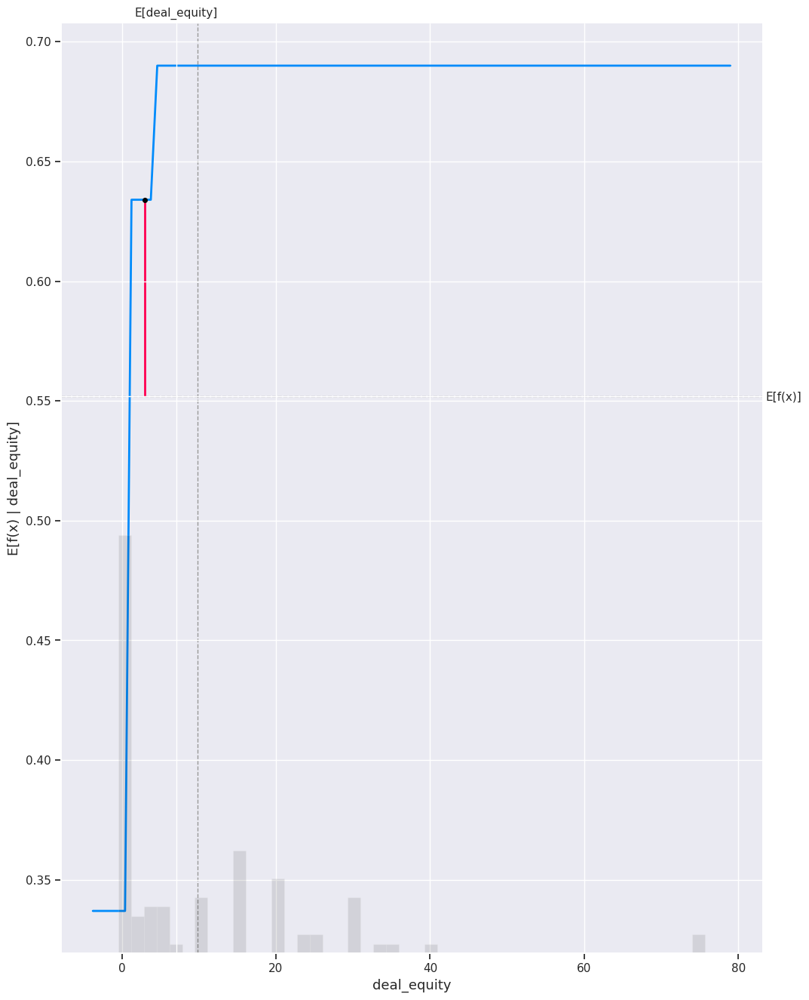

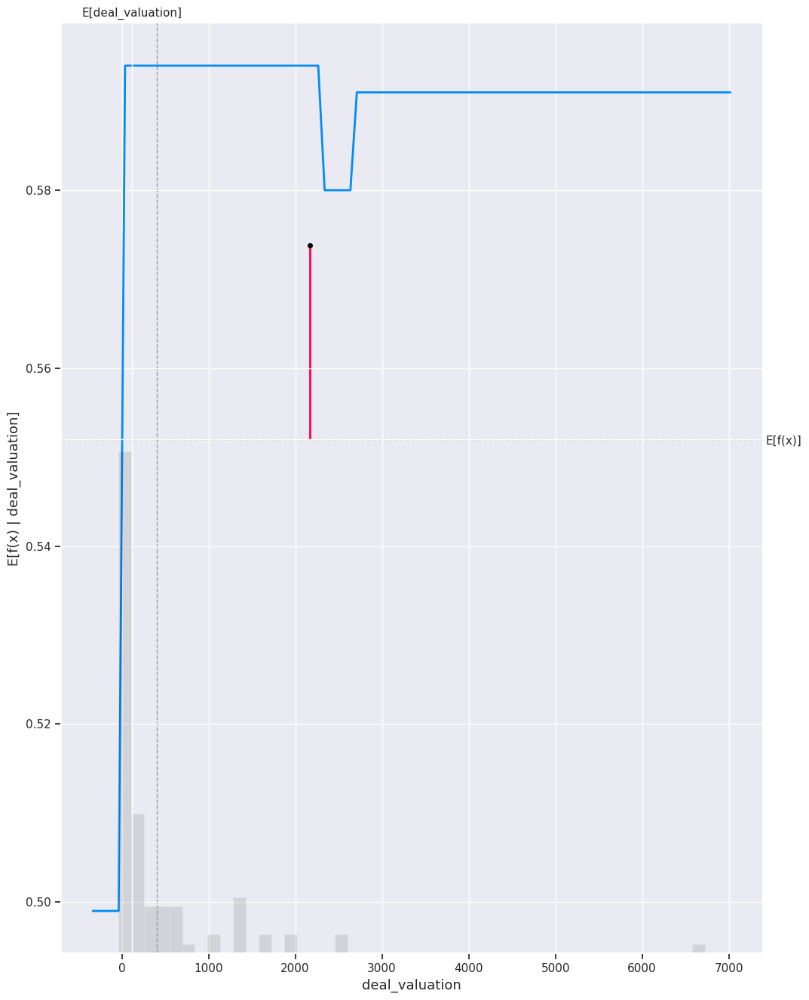

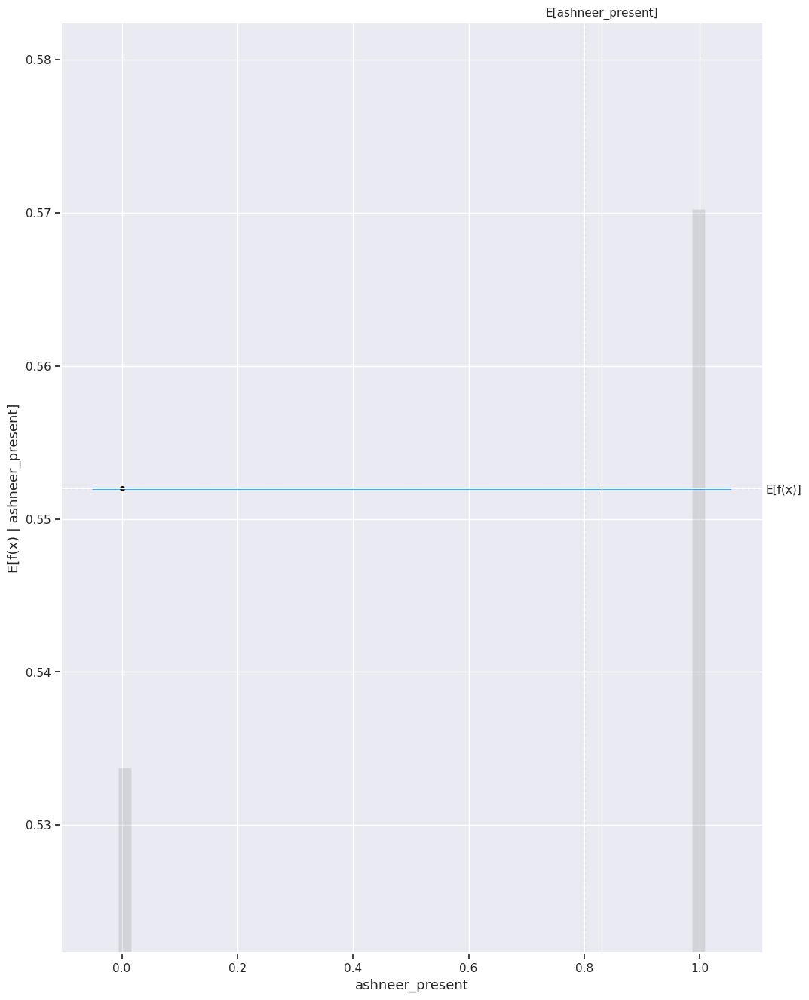

Attempting to set identical low and high xlims makes transformation singular; automatically expanding.


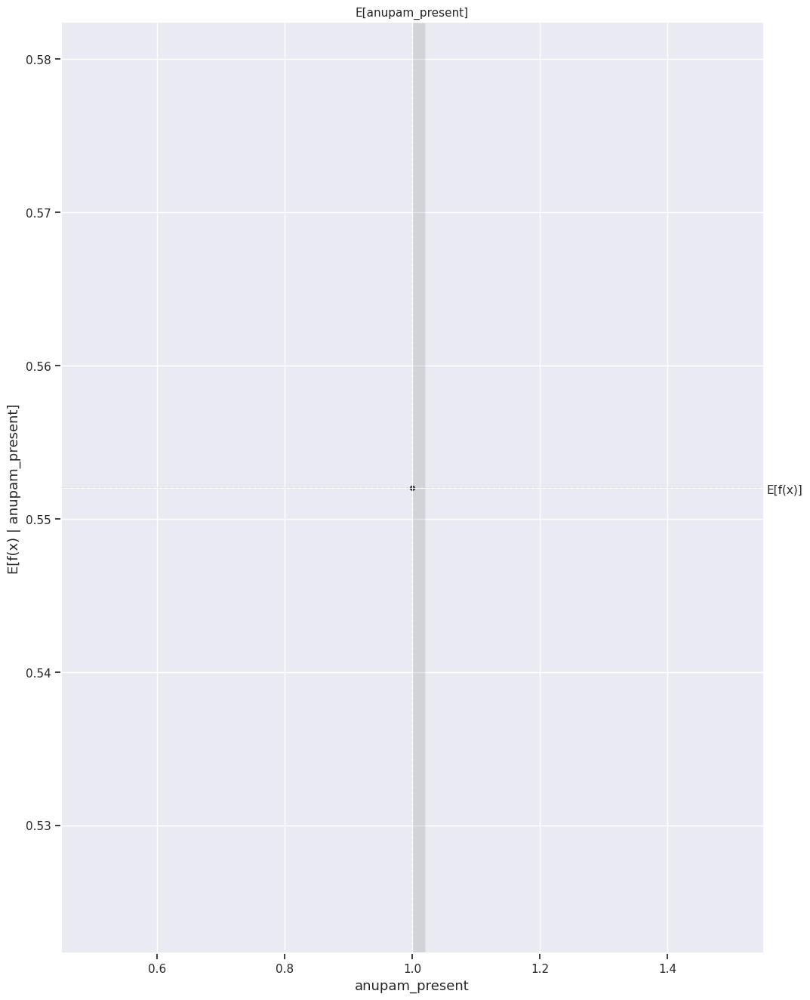

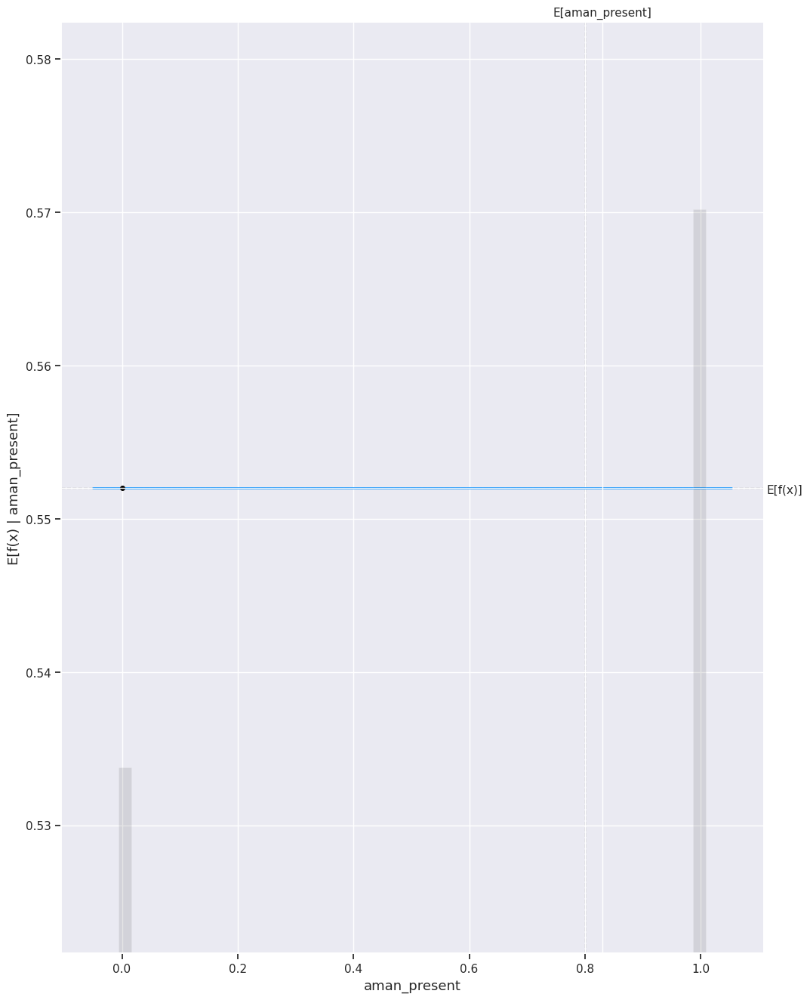

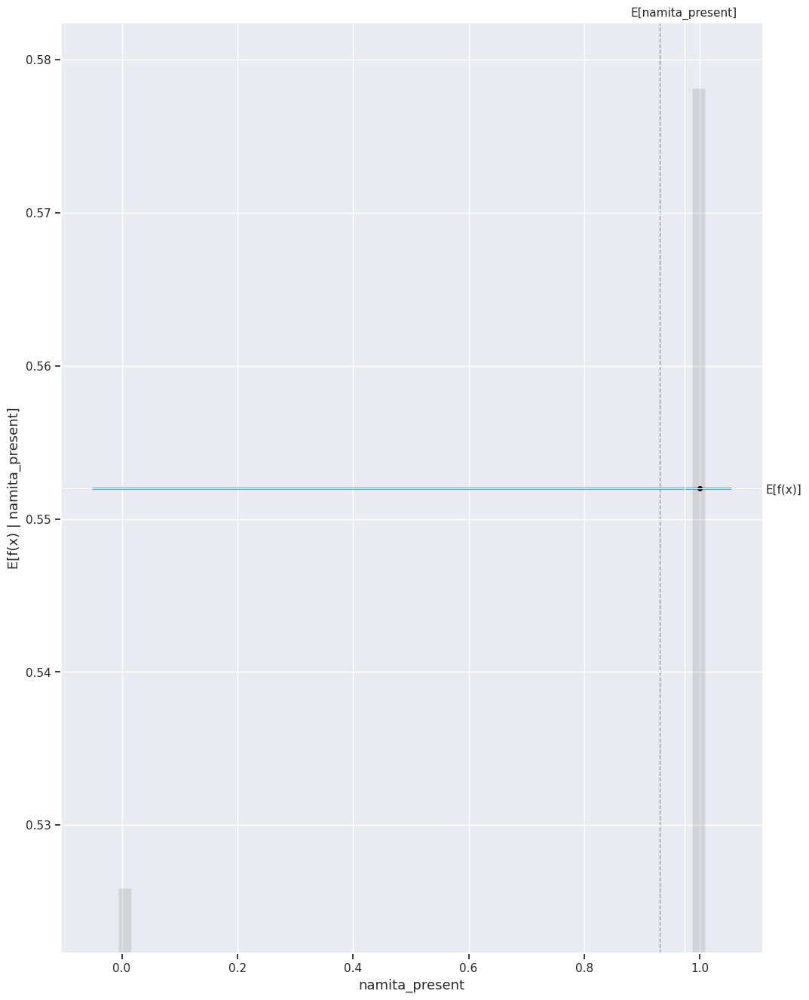

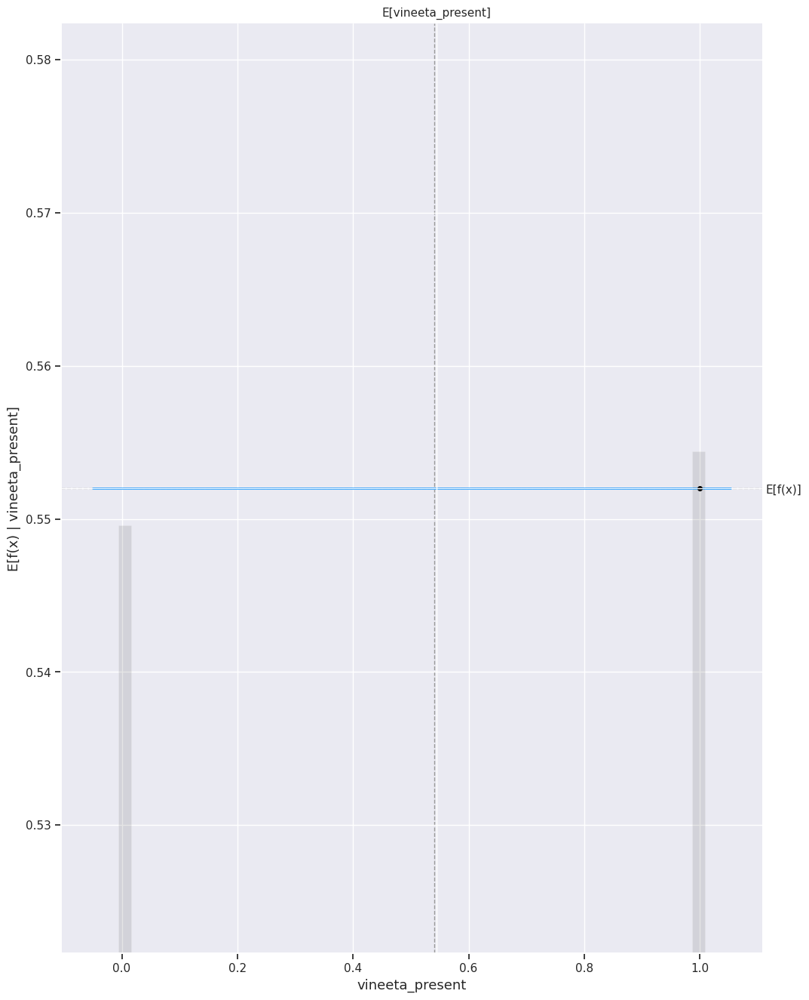

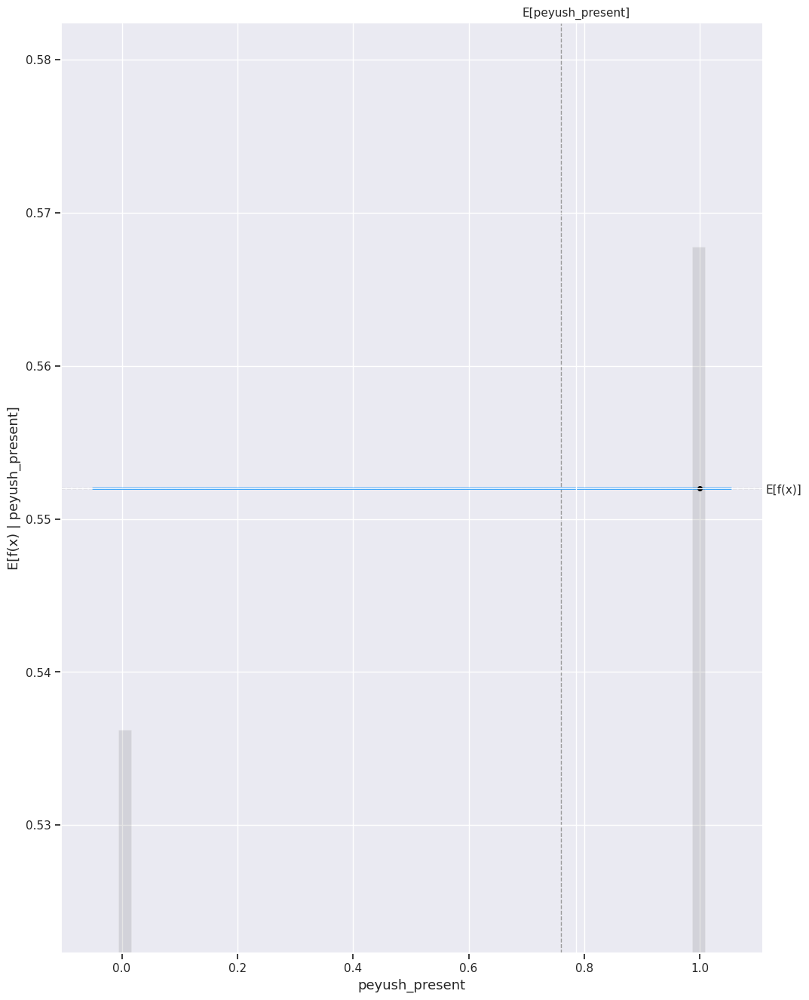

...

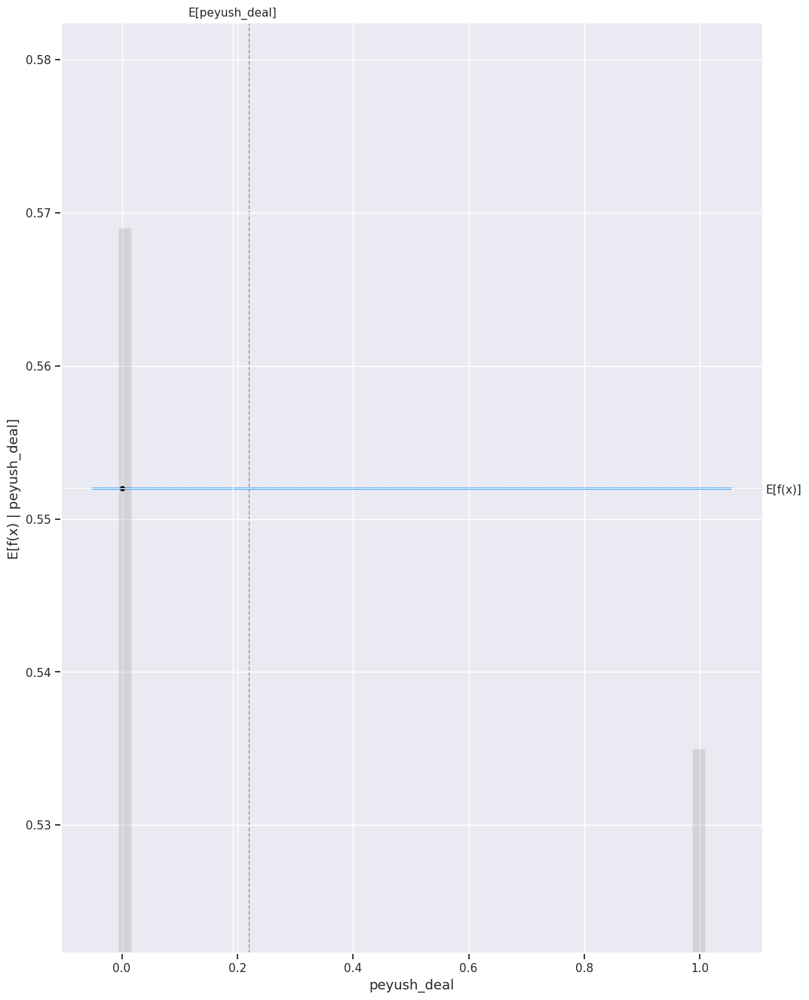

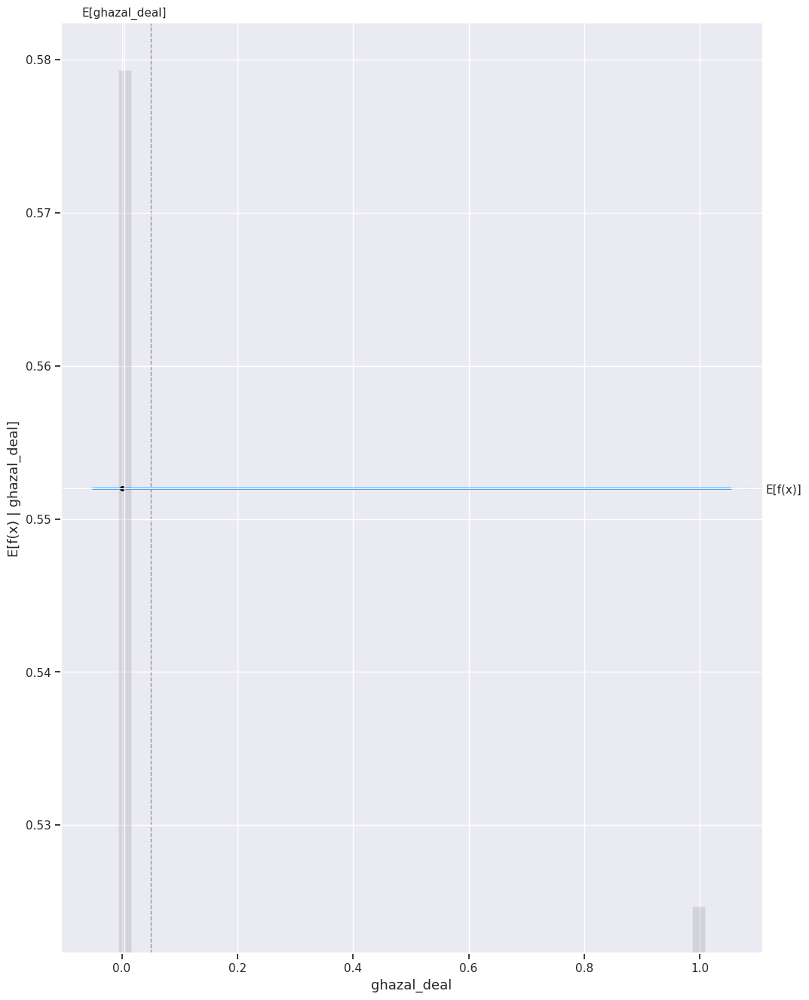

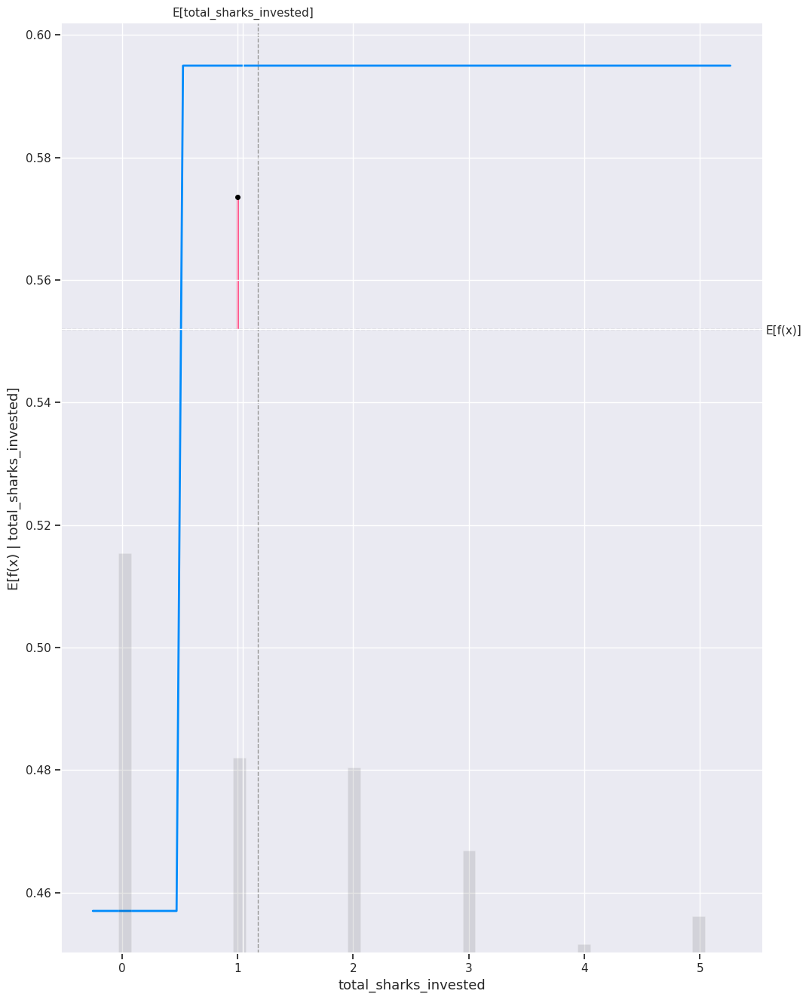

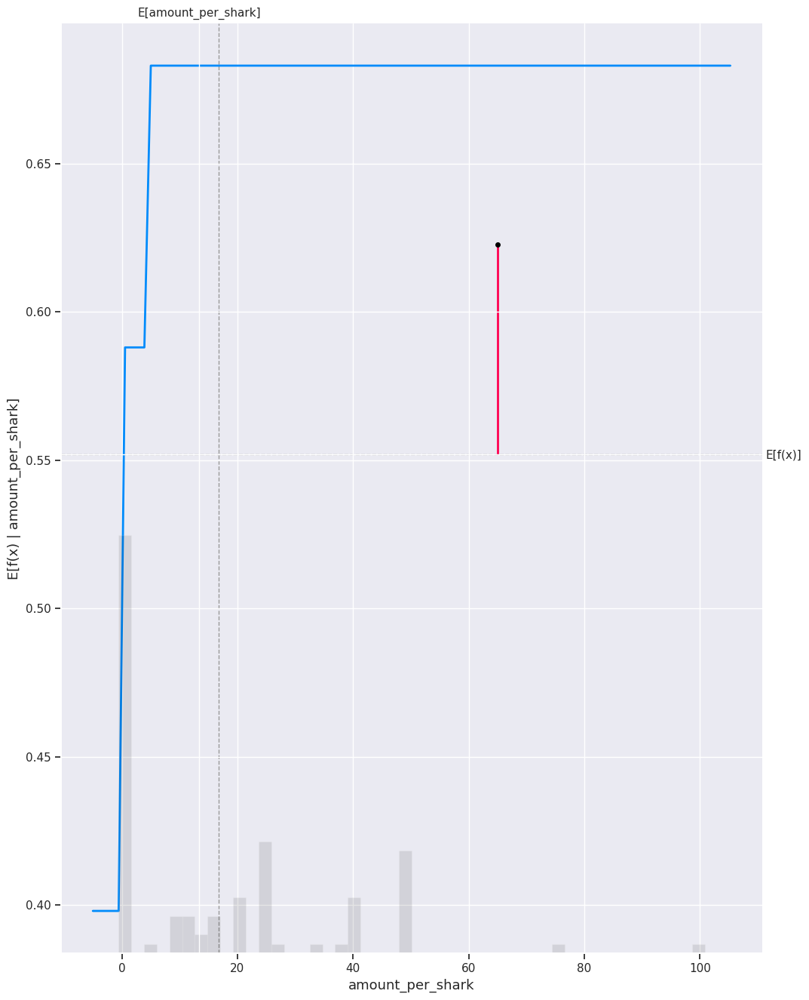

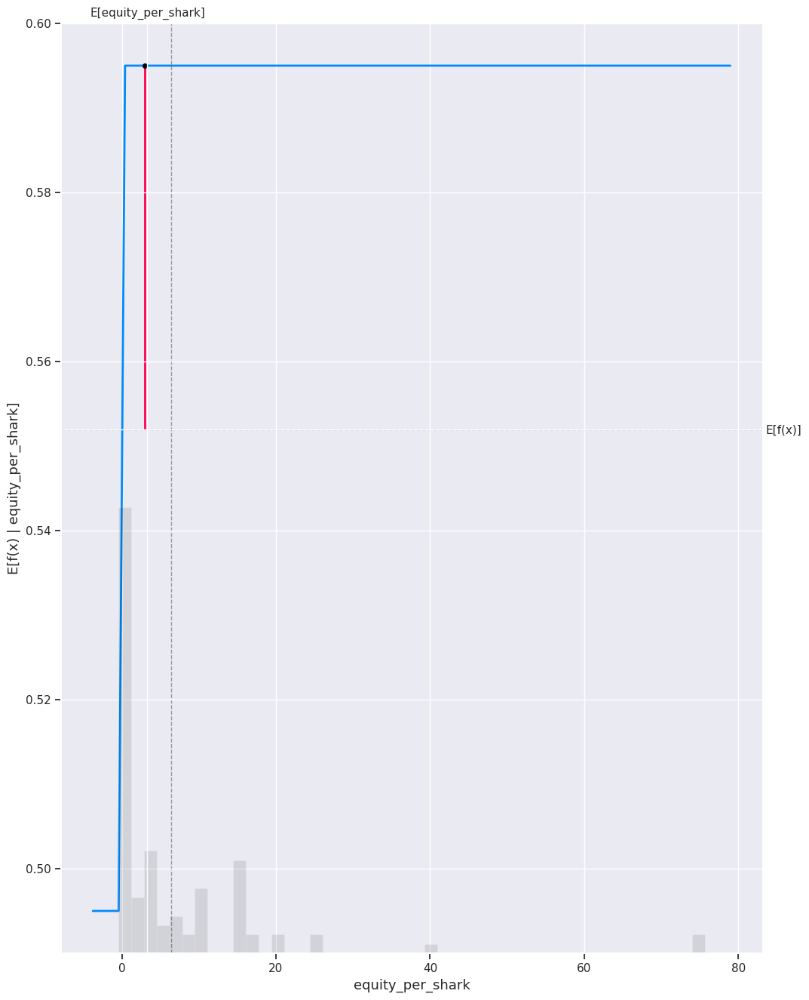

In [63]:
# SHAP explanation of a tree based model
tree_explainer = shap.Explainer(tree_model.predict, x_train_100)
tree_shap_values = tree_explainer(X_train)
for i in X_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        tree_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )

####Interpreting SHAP Feature Importance Plot for Linear and Tree-based model:


The idea behind SHAP feature importance is simple: Features with large absolute Shapley values are important. Since we want global importance, we average the absolute Shapley values per feature across the data. Next, we sort the features by decreasing importance and plot them.

The following plots are:


*   SHAP feature importance for a linear model
*   SHAP feature importance for tree-based model

For the linear model, total_sharks_invested is the most important feature but for our tree-based model deal_equity is the most important feature when we consider the average of SHAP values to calculate feature importance.

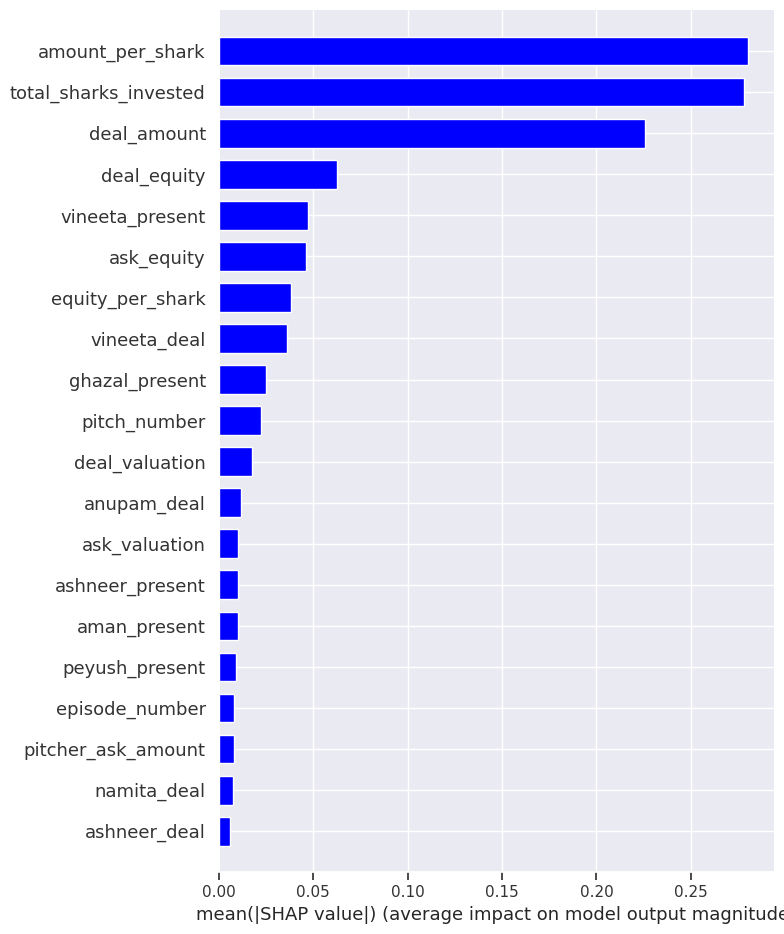

In [64]:
shap.summary_plot(linear_shap_values, X_train, plot_type="bar", color="blue")
##shap.summary_plot(shap_values, X_train, plot_type='bar')

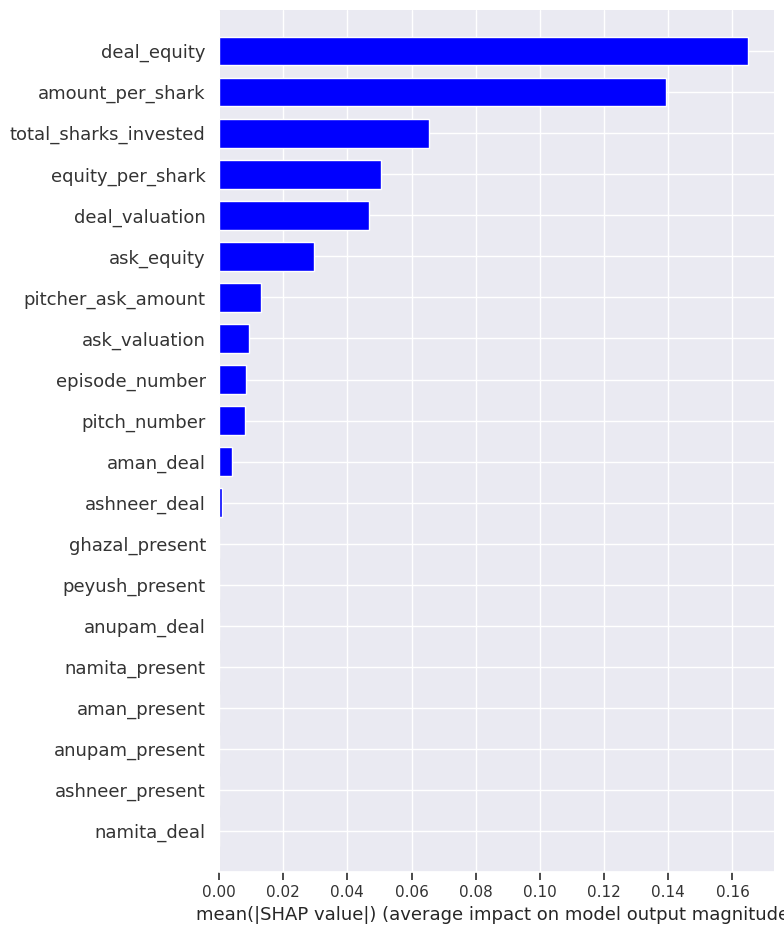

In [65]:
# SHAP variable importance for Tree based model
shap.summary_plot(tree_shap_values, X_train, plot_type="bar", color="blue")

From the plot it is observed that total_sharks_invested, equity_per_shark, deal_amount, deal_equity, amount_per_shark are said to be significant.



####Interpreting Waterfall SHAP visualization


*   Let's consider the same sample (sample_ind = 16)

Notice the value of volatile_acidity in the waterfall model is the same as what we have in SHAP partial dependence plot. It says that f(x) = 1.038 is what we got as a model output and the expected output for this sample was 0.565, with the difference of 0.473. 

The waterfall model explains how we got the expected output, and which features contributed to what. The below graph shows that "amount_per_shark" has the biggest and most positive impact in increasing the quality of wine by 0.5 for this specific sample. Followed by "deal_amount" had a negative impact and it bought the probability to get deal again by 0.15 for this sample, and so on. Using this model we can visually interpret why exactly this specific sample is giving an output of 1.038.

*   Similarly we can interpret the tree-based model for the same sample.

Where the output we got was 1 and the expected output was 0.565. in the tree-based model, we just see that the magnitude of the impact made by individual features varies from what we had in a linear model. Here in the tree-based model, the output is majorly determined by only three features - deal_equtity, amount_per_shark, total_sharks_invested

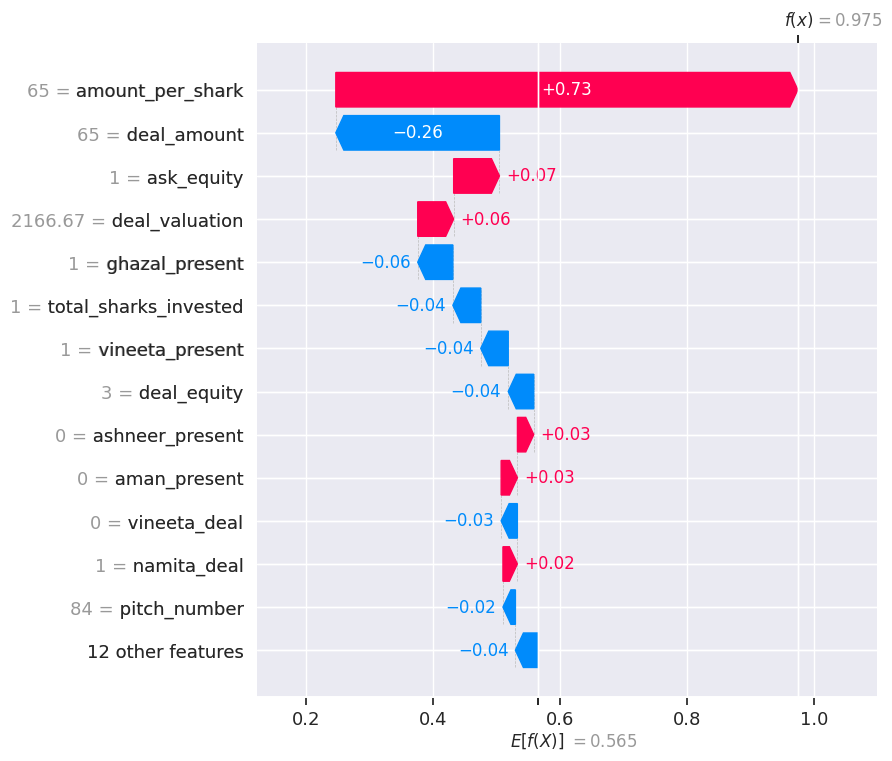

In [66]:
# Waterfall plot for linear model
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=14)

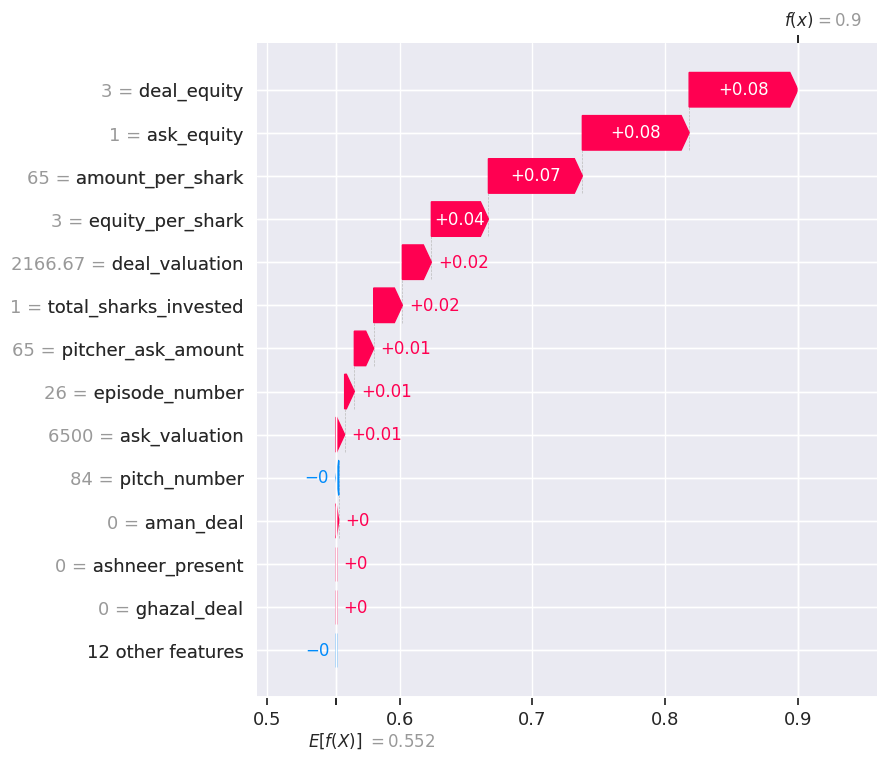

In [67]:
# Waterfall plot for Tree Based Model
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)

####Interpret the summary plot for the Linear and Tree-based model:

Here the features are listed in descending order of their importance. This is one of the easiest ways to analyze an ML model and how the features are affecting the target and to what extent.

Each dot(both red and blue) represents a feature of a deal. Red color represents high values whereas blue color represents low value

If a dot(a feature of deal) is on the right side of the y-axis then it had a positive impact and if it is on the left side of the axis it had a negative impact. The position of a dot(a feature of wine) on the x-axis represents the intensity of impact it had, the more it is away from the axis greater the intensity.

Let us try to understand how both models are performing side by side

Higher value of total_sharks_invested tends to have a positive impact on the probablity of deal. This visualization is very useful when it comes to interpreting how our model is working

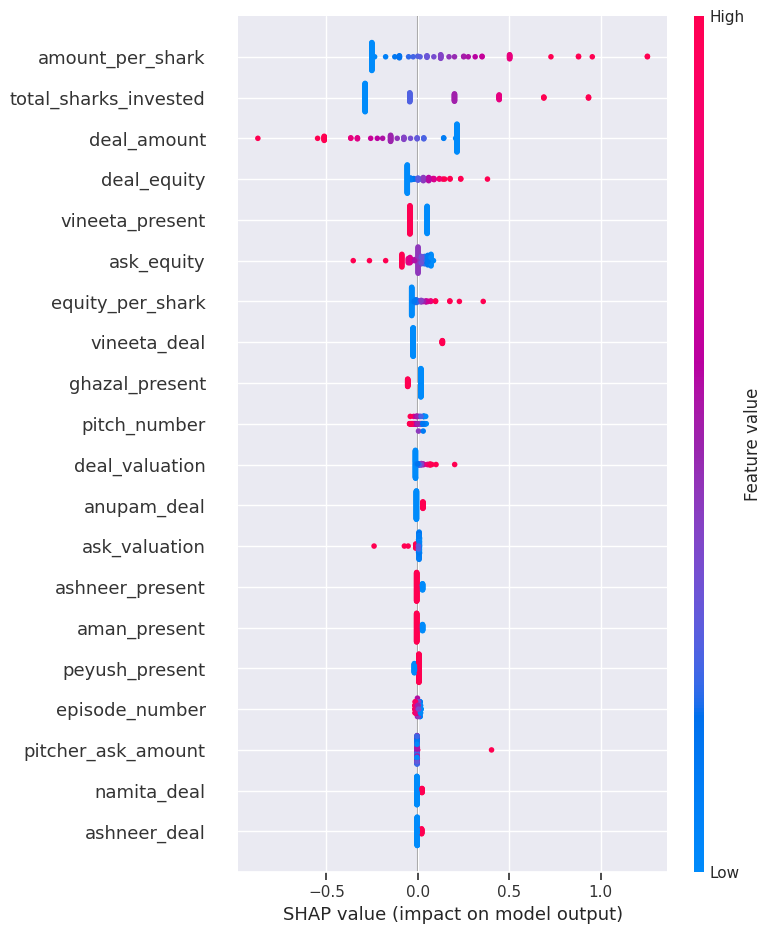

In [70]:
# SHAP summary for Linear Model
shap.summary_plot(linear_shap_values, X_train)

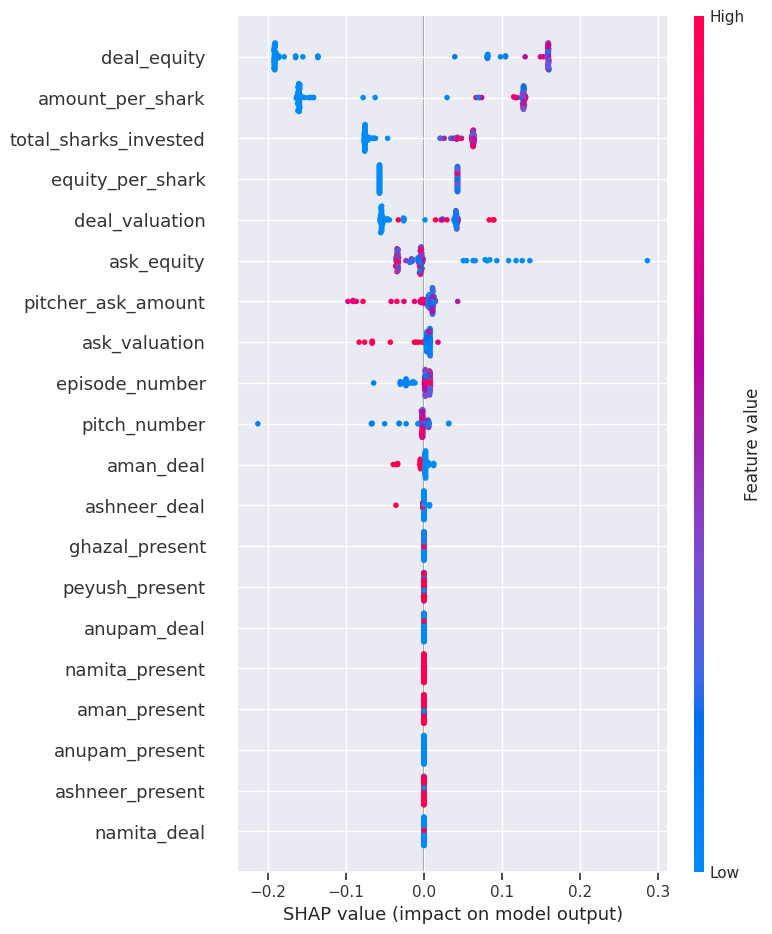

In [71]:
# SHAP summary for Tree Based Model
shap.summary_plot(tree_shap_values, X_train)

###Interpreting SHAP dependence plot for Linear and Tree-based model


SHAP dependence plots are an alternative to partial dependence plots and accumulated local effects. While PDP and ALE plot show average effects, SHAP dependence also shows the variance on the y-axis. Especially in case of interactions, the SHAP dependence plot will be much more dispersed in the y-axis. Let us interpret the linear and Tree-based models using the SHAP dependence plot. Here in these graphs, we get a dot for every deal in our dataset.


*   As we can observe the linear model feature and its SHAP value have a linear relationship. If a feature has a positive impact on the proabability of deal then the relationship will be directly proportional e.g. amount_per_shark and deal_equity

*   For the tree-based model as observed the relationship between feature and its SHAP value is no longer linear. Now we see that the SHAP dependence plot no longer exactly matches the partial dependence plot because they are accounting for the interaction effects. Because if we look at the PDP, we are losing all the high order interaction (and's and or's) in the model that our model may be doing. But unlike PDP, the SHAP defense plot takes these interactions into account.


####Example of SHAP dependence plot of Alcohol

In the linear model the relationship is linear between amount_per_shark and its SHAP values. There is not much information to extract from these plots the only information which could be extracted is if the relationship is directly or inversely proportional.

In the tree-based model we could extract the information on how the probability of deal is affected while being tuned the feature. It also reinforces the inference we got from the above PDP and ICE plot i.e. The probability of deal in the range (10 - 12) changes drastically.

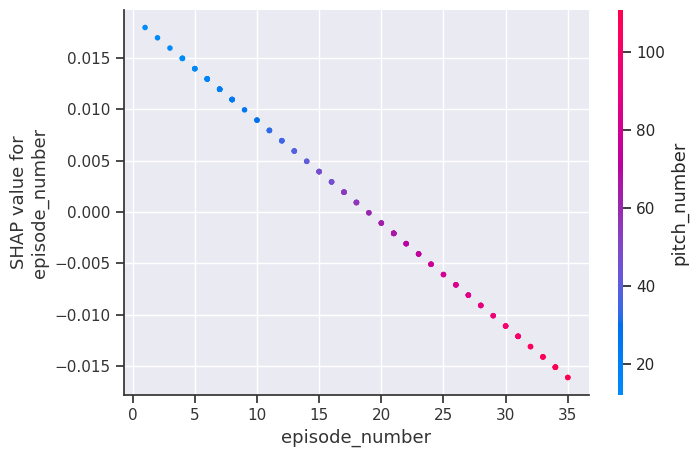

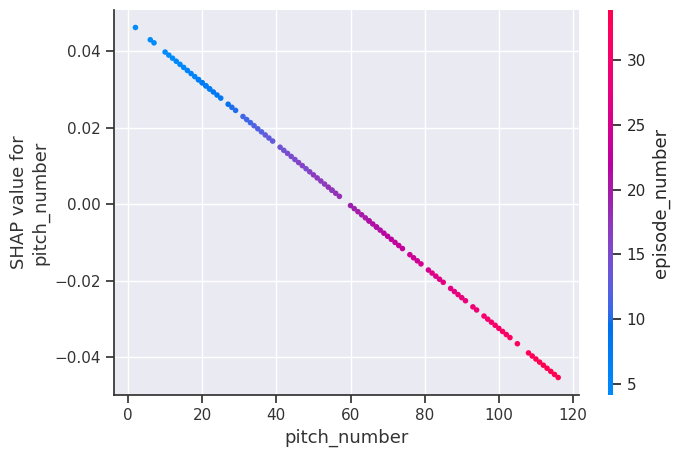

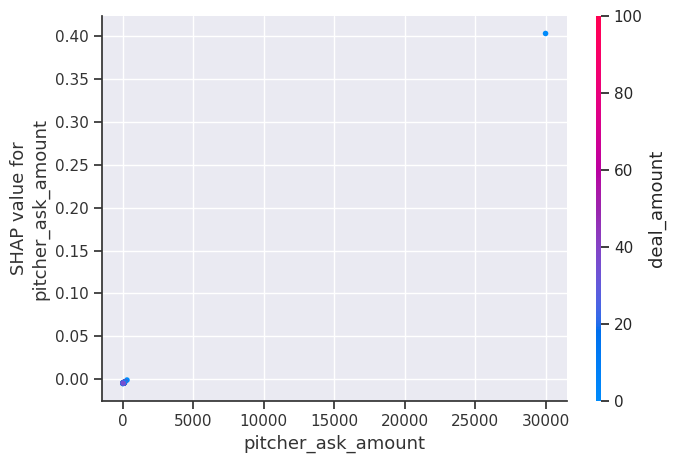

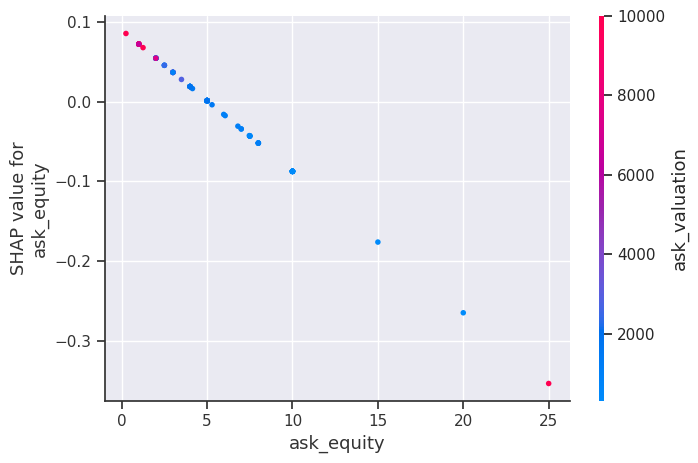

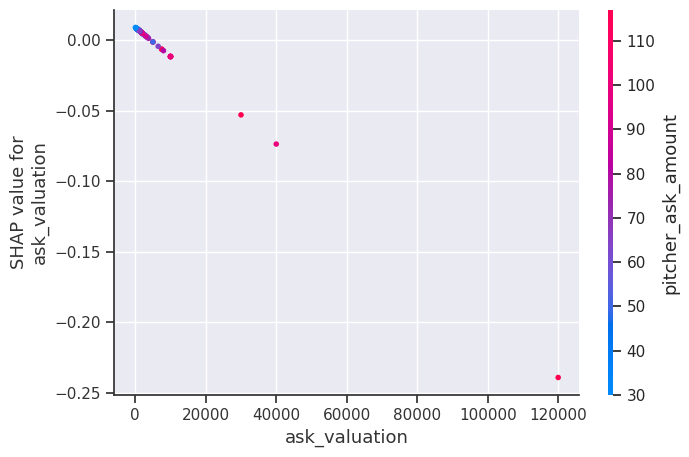

...

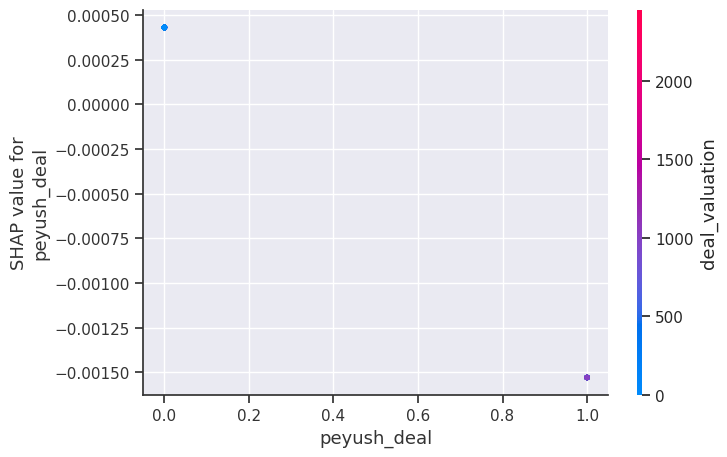

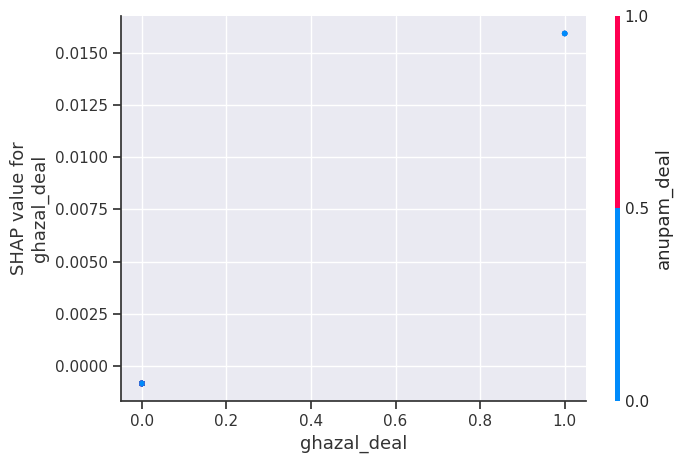

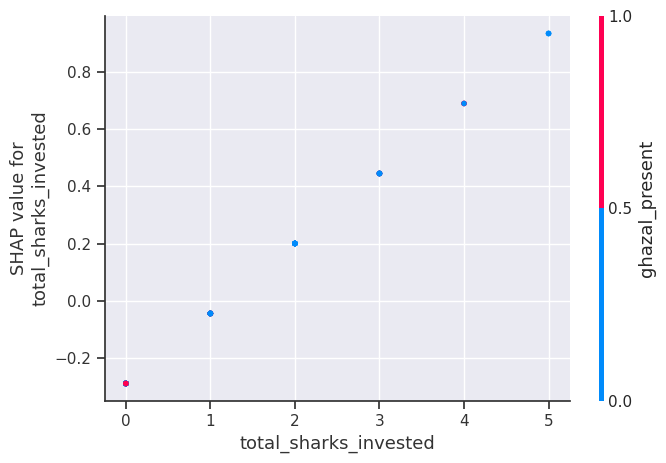

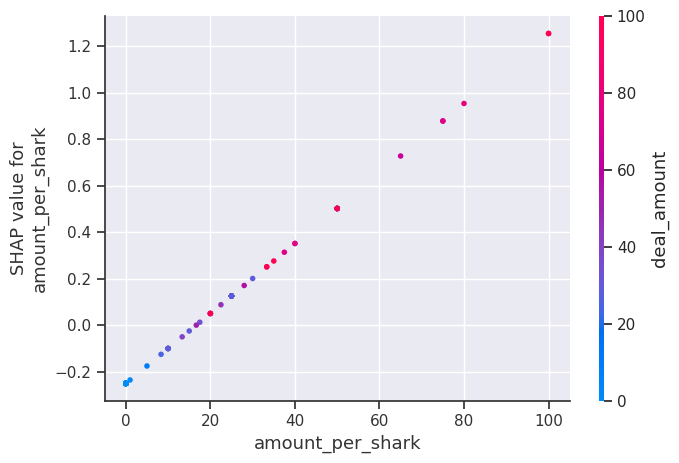

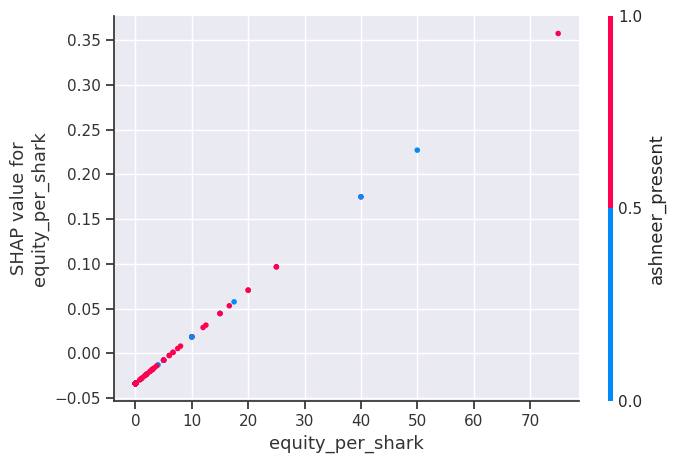

In [72]:
# SHAP partial dependence plot for linear model
for i in X_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, X_train)

####Interpreting SHAP dependence plot for Linear and Tree-based model:


The SHAP dependence plot shows the marginal effect one or two features have on the predicted outcome of a machine learning model. It tells whether the relationship between the target and a feature is linear, monotonic, or more complex. Let us interpret the linear and Tree-based models using the SHAP dependence plot. Here in these graphs, we get a dot for every deal in our dataset

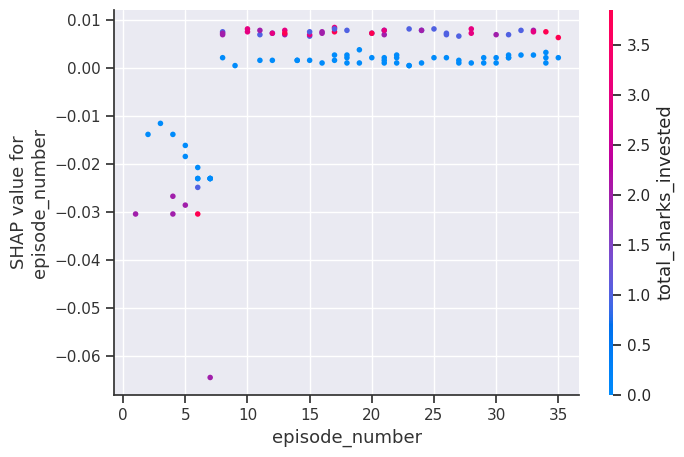

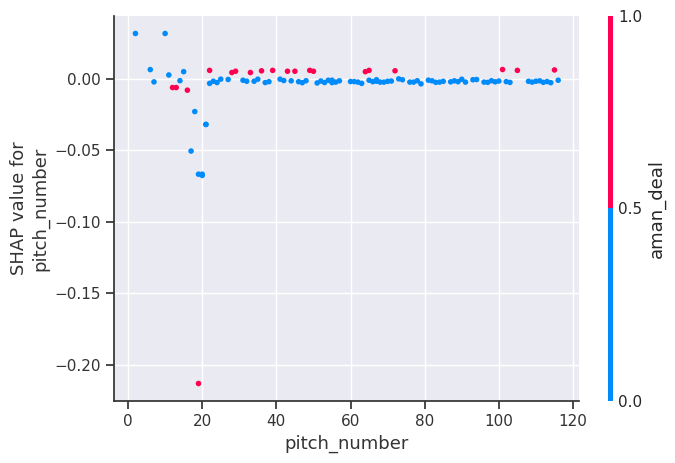

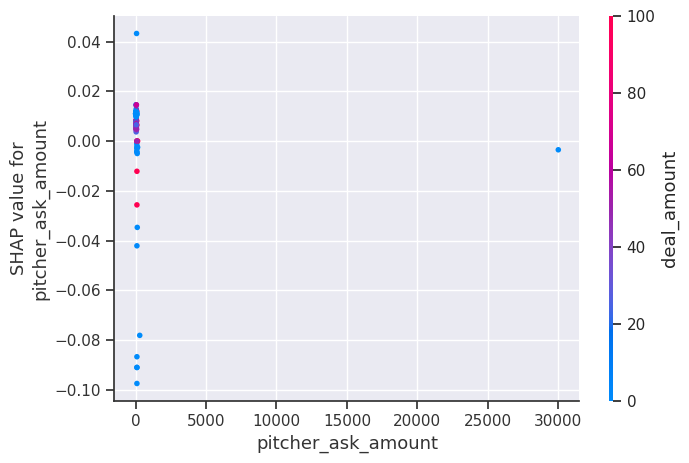

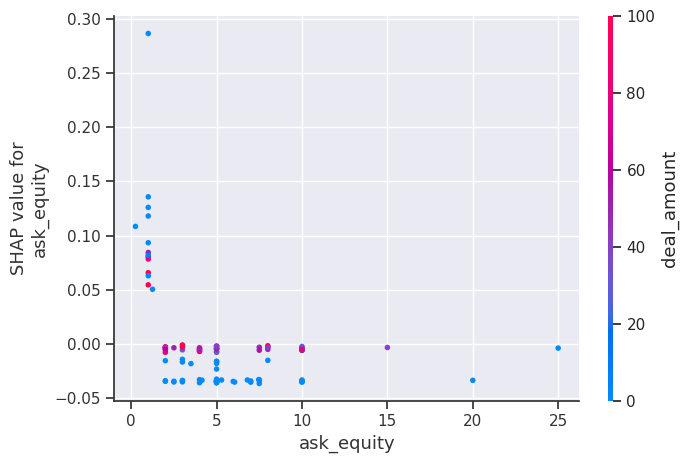

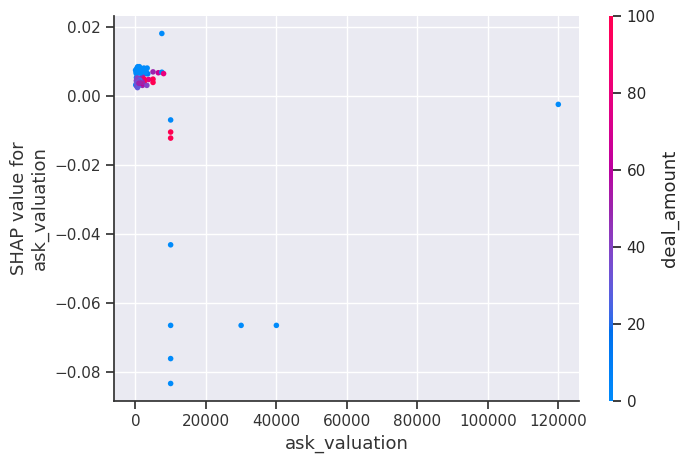

...

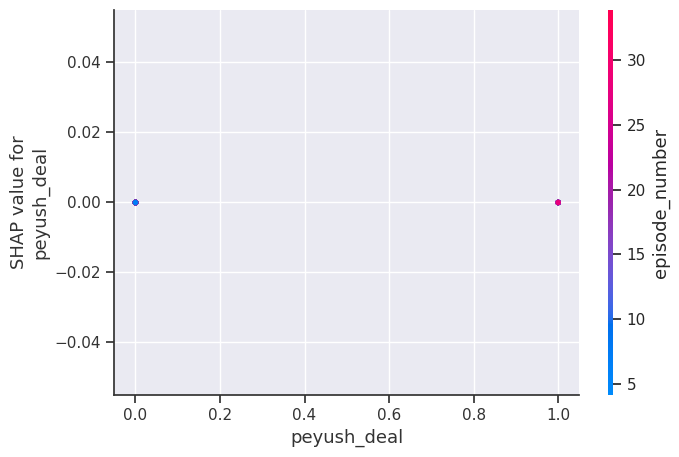

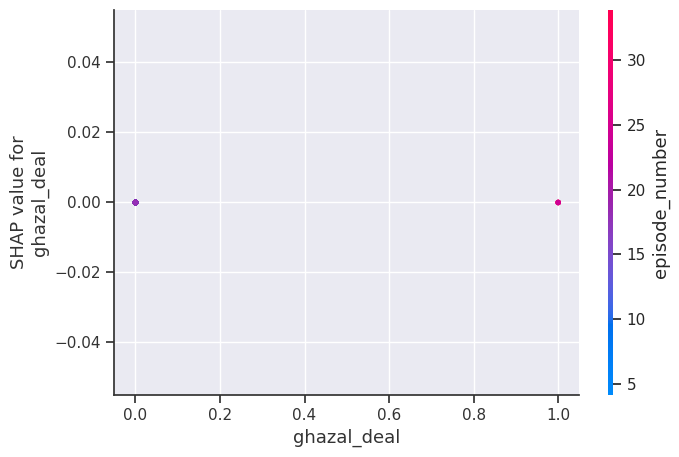

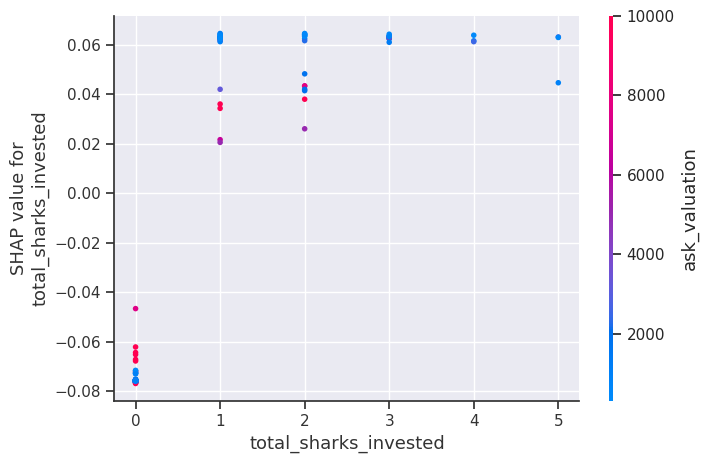

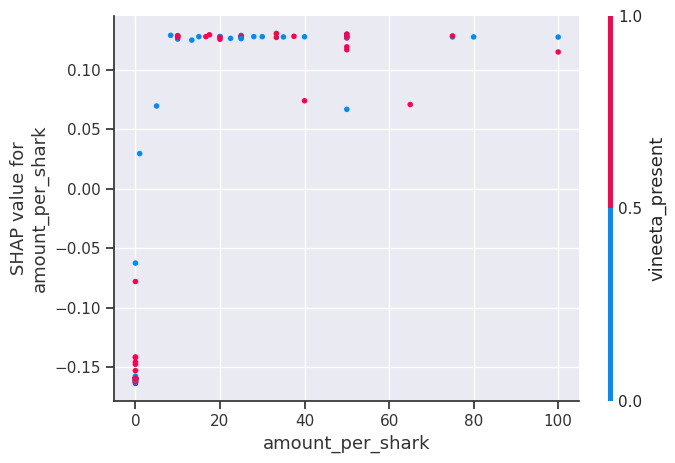

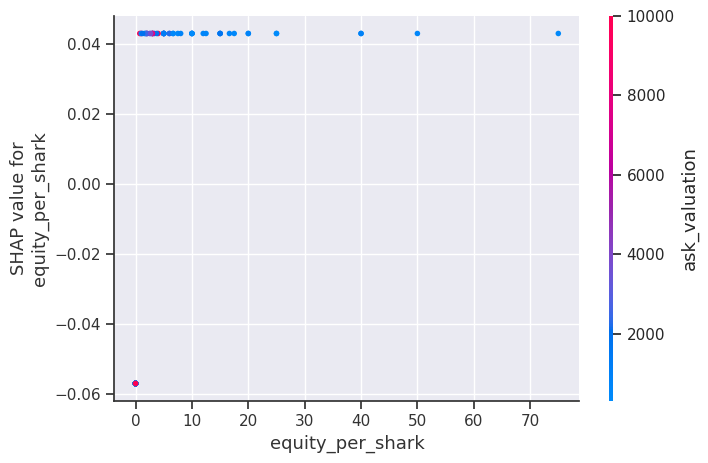

In [73]:
# SHAP partial dependence plot for a tree based model
for i in X_train.columns:
    shap.dependence_plot(i, tree_shap_values.values, X_train)

In [74]:
X_output_linear = X_test.copy()
X_output_linear.loc[:, "predict"] = np.round(
    linear_model.predict(X_output_linear), 2
)  # Attaching the output of linear model to test dataframe

X_output_tree = X_test.copy()
X_output_tree.loc[:, "predict"] = np.round(
    tree_model.predict(X_output_tree), 2
)  # Attaching the output of tree based model to test dataframe

In [75]:
# Force Plot of Tree Based Model
explainerModel = shap.TreeExplainer(tree_model)
shap_values_Model = explainerModel.shap_values(X_output_tree)


def shap_plot_tree(j):
    p = shap.force_plot(
        explainerModel.expected_value, shap_values_Model[j], X_output_tree.iloc[[j]]
    )
    return p

####Force Plot SHAP analysis

This plot is the same as the waterfall model which we saw above the only difference is the visualization is condensed. It is really up to an individual which visualization is preferred some find this easier to read others find the waterfall model easier to read.

In [76]:
shap.initjs()  # Initializing JavaScript module
print(shap_plot_tree(10))

####Heatmap Visualization for Linear and Tree-based model:

This visualization is a summarization of the entire dataset on how each data point in every feature is affecting the target(data).


*   Here the Y-axis is Features
*   and X-axis is Instance of that feature
*   The color of the instance defines if it had a positive effect or negative effect by its color. If the instance is red then it had a positive effect and if the instance is blue then it had a negative effect
*   The intensity of the color is directly proportional to the intensity of the effect. Deeper the color, the more impactful the feature is


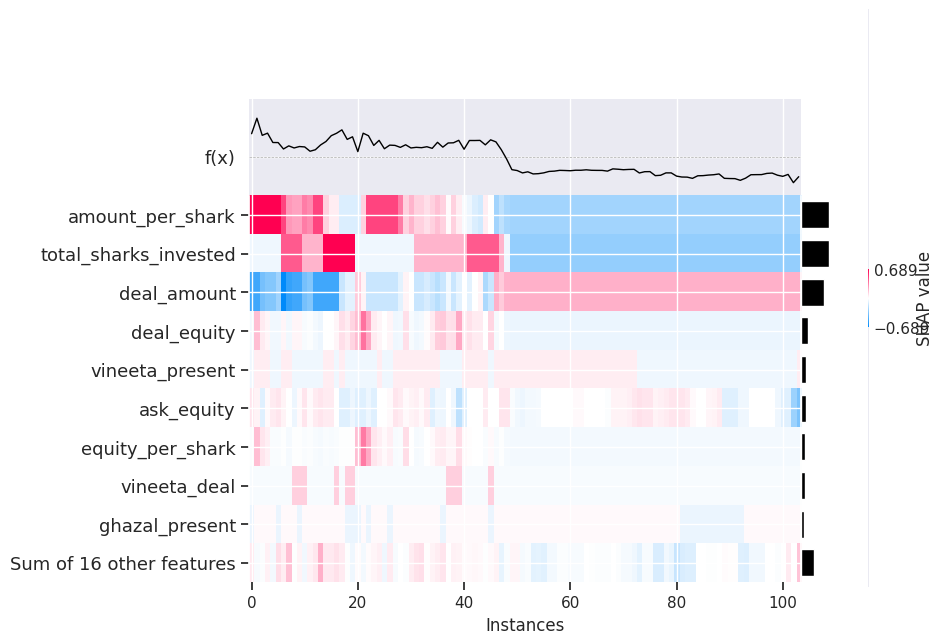

In [77]:
shap.plots.heatmap(linear_shap_values)  # SHAP heatmap for a Linear Model

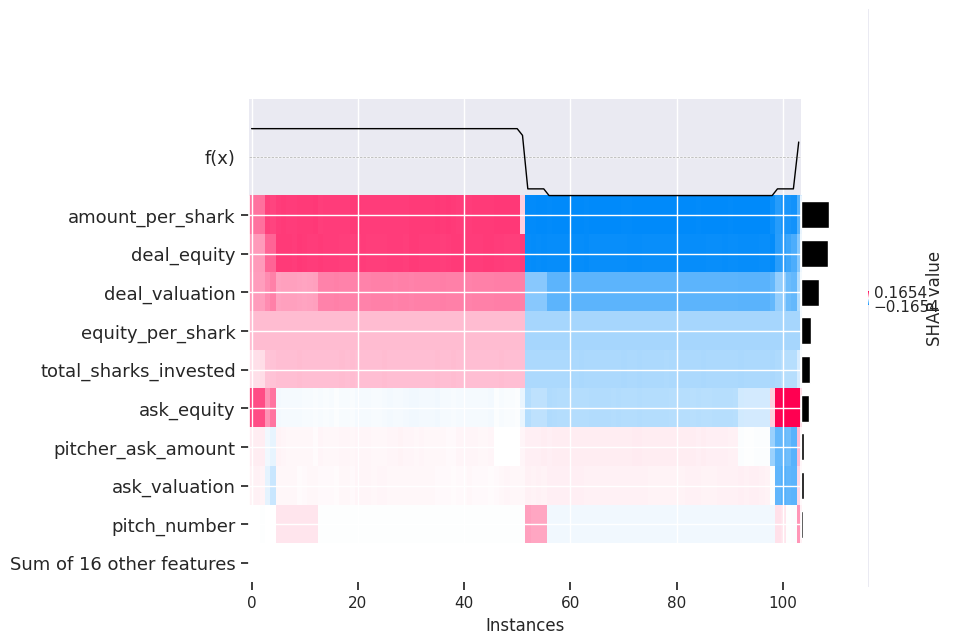

In [ ]:
shap.plots.heatmap(tree_shap_values)  # SHAP HeatMap of a Tree Based Model

####LIME (Local Interpretation Model-Agnostic Explanation) Analysis:




LIME builds a surrogate model, i.e. converts a more complicated model (say a deep tree-based model into a simple linear model) around the data points in which we are interested and then it will try to make an approximation out of this simple model on the whole model. LIME builds a local model in such a way that it can interpret the whole Black-Box

LIME works well on tabular, text, image datasets - hence it works on different datasets



Let us Interpret our Linear model and Tree-based model on sample data (sample_index = 10) using LIME and try to understand what is happening under the hood. Please refer below for Visualizations of both models



As we can see on the left-hand side LIME gives us information about the minimum and maximum values predicted by the model. The Color orange here represents positive and blue represents negative
Here for this sample as seen below deal_amount, deal_equity, equity_per_shark, total_sharks_invested harmed both linear and tree-based model



These interpretations were carried out locally in the region where of out sample data(sample_index = 10).

In [78]:
!pip install lime
import lime
from lime import lime_tabular


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [79]:
# Initializing LIME explainer for Linear Model
lime_linear_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train), feature_names=X_train.columns, mode="regression"
)

In [80]:
# Getting LIME interpretation for a sample data
idx = 10
np_x_test = np.array(X_test)
np_y_test = np.array(Y_test)
print("Prediction : ", linear_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], linear_model.predict, num_features=np_x_test.shape[1]
)
lime_linear_explanation

Prediction :  [0.84392568]
Actual :      1


X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names


In [81]:
lime_linear_explanation.show_in_notebook()  # Display Results in Notebook

In [82]:
# Initializing LIME explainer for Tree Based Model
lime_tree_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train), feature_names=X_train.columns, mode="regression"
)

In [83]:
# Getting LIME interpretation for a sample data
idx = 10
np_x_test = np.array(X_test)
np_y_test = np.array(Y_test)
print("Prediction : ", tree_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_tree_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], tree_model.predict, num_features=np_x_test.shape[1]
)
lime_tree_explanation

Prediction :  [1.]
Actual :      1


X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was fitted with feature names


In [84]:
lime_tree_explanation.show_in_notebook()  # Display Results in Notebook

####PDP(Partial Dependence Plot) for Linear model and Tree-based Model


Linear Model -


If we closely look at the PDP of the linear model we can see that if features volatile_acidity, sulfates, alcohol are tuned while freezing the rest if them the output of the model varies linearly and these variables have the most significant effect on the output(quality of wine) 2. Tree-Based Model - On looking at the PDP of the tree-based model, it re-affirms the interpretation we got from the PDP of the Linear Model and Best AutoML model. The only difference here is that the output doesn't vary linearly

####PDP(Partial Dependence Plot) for Linear model and Tree-based Model:

*   Linear Model - If we closely look at the PDP of the linear model we can see that if features volatile_acidity, sulfates, alcohol are tuned while freezing the rest if them the output of the model varies linearly and these variables have the most significant effect on the output(quality of wine)

*   Tree-Based Model - On looking at the PDP of the tree-based model, it re-affirms the interpretation we got from the PDP of the Linear Model and Best AutoML model. The only difference here is that the output doesn't vary linearly

####Comparision between SHAP, LIME, and Partial Dependence Plot Analysis:

Unlike LIME, SHAP does not necessarily build a local interpretable model but rather uses the black-box model to calculate the marginal contribution to the prediction for each feature and then relies on the theoretically sound game theory concept of Shapley values to calculate the feature importance. In this way, SHAP improves upon LIME due to its greater stability and lack of local linear model assumptions.



*   PDP gives the extent of effect a variable has on the output by freezing the rest of them
*   SHAP gives how much each variable contributes to the prediction
*   LIME is more like SHAP but a lite version of it - It takes the local region of the point of interest and gives us information about the contribution each variable has made to the output


We have to analyze our needs and then consider the tradeoff to select the best suitable interpretable method for the ML model

####References :

H2O AI AutoML - https://docs.h2o.ai/

https://towardsdatascience.com/a-deep-dive-into-h2os-automl-4b1fe51d3f3e

http://net-informations.com/ds/mla/ols.html

https://github.com/Amrutha1103/002776773_AMRUTHA_SAI_ASSIGNMENT3

https://medium.com/dataman-in-ai/explain-your-model-with-the-shap-values-bc36aac4de3d

https://www.youtube.com/watch?v=2AyCEp1fnM4&t=5s

###Licences:

MIT License


Copyright (c) 2023 Amrutha Sai Edara

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE